In [1]:
#Import the storage module

from google.cloud import storage
from io import StringIO
import pandas as pd

#Source for the files

source_bucket_name = "my-big-data-as"

#Create a client object that points to GCS

storage_client = storage.Client()

#Get a list of the 'blobs' (objects or files) in the bucket

blobs = storage_client.list_blobs(source_bucket_name, prefix="landing/D1")

#Make a list

filtered_blobs = [blob for blob in blobs if blob.name.endswith('.csv')]

#Define the EDA function

def perform_eda(df): 
    
    #Number of observations
    
    num_observations = df.shape[0]
    print(f"Number of observations: {num_observations}") 

    #Number of missing fields 
    
    missing_values = df.isnull().sum() 
    print("Number of missing values in each field:")
    print(missing_values[missing_values > 0]) 

    #List of variables 
    
    variables = df.columns.tolist() 
    print(f"List of variables: {variables}") 

    #Summary for date variables 
    
    date_columns = df.select_dtypes(include=['datetime', 'datetime64']).columns 
    if date_columns.size > 0: 
        for date_col in date_columns: 
            min_date = df[date_col].min() 
            max_date = df[date_col].max() 
            print(f"Min date for {date_col}: {min_date}") 
            print(f"Max date for {date_col}: {max_date}") 

    #Summary statistics
    
    numeric_summary = df.describe()
    print("Summary statistics for numerical columns:")
    print(numeric_summary)

#Iterate through the list and print out their names

for blob in filtered_blobs:
    print(f"File {blob.name} with size {blob.size} bytes")
    source_file_path = f"gs://{source_bucket_name}/landing/D1/{blob.name}" 
    df = pd.read_csv(StringIO(blob.download_as_text()), header=0, sep=",") 
    filename = blob.name.replace('landing/D1/', '') 
    filename_parts = filename.split('_') 
    ticker_symbol = filename_parts[0]

    #Add a new column to the data frame using the ticker name 
    
    df['ticker_symbol'] = ticker_symbol
    df.info()  # Display DataFrame info

    #Perform EDA
    
    perform_eda(df)

File landing/D1/A.US_D1.csv with size 45993751 bytes
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6103 entries, 0 to 6102
Columns: 1299 entries, datetime to ticker_symbol
dtypes: float64(1296), int64(1), object(2)
memory usage: 60.5+ MB
Number of observations: 6103
Number of missing values in each field:
bbands_3_upperband      2
bbands_3_middleband     2
bbands_3_lowerband      2
bbands_4_upperband      3
bbands_4_middleband     3
                       ..
willr_60               59
willr_70               69
willr_80               79
willr_90               89
willr_100              99
Length: 1284, dtype: int64
List of variables: ['datetime', 'open', 'high', 'low', 'close', 'volume', 'bbands_3_upperband', 'bbands_3_middleband', 'bbands_3_lowerband', 'bbands_4_upperband', 'bbands_4_middleband', 'bbands_4_lowerband', 'bbands_5_upperband', 'bbands_5_middleband', 'bbands_5_lowerband', 'bbands_6_upperband', 'bbands_6_middleband', 'bbands_6_lowerband', 'bbands_7_upperband', 'bbands_7_mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6103.000000  6103.000000  6103.000000  6103.000000  6.103000e+03   
mean     55.436167    56.154839    54.720044    55.447727  2.269264e+06   
std      36.776679    37.168607    36.355450    36.760620  1.569454e+06   
min      10.700000    11.130000    10.500000    10.820000  2.540000e+02   
25%      31.445000    31.955000    30.980000    31.465000  1.282257e+06   
50%      41.180000    41.630000    40.710000    41.180000  1.930241e+06   
75%      67.570000    68.375000    66.845000    67.550000  2.822083e+06   
max     179.280000   179.570000   177.170000   179.280000  2.874950e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6101.000000          6101.000000         6101.000000   
mean            56.701908            55.436142           54.170266   
std             37.461762            36.734360           36.078182   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2567.000000  2567.000000  2567.000000  2567.000000  2.567000e+03   
mean     30.668605    31.162715    30.155582    30.645801  1.938795e+07   
std      13.391754    13.519588    13.261990    13.393950  2.367677e+07   
min       8.770000     9.200000     8.250000     9.050000  1.200000e+03   
25%      16.745000    17.090000    16.360000    16.735000  5.609994e+06   
50%      32.170000    32.750000    31.640000    32.140000  1.002924e+07   
75%      42.040000    42.585000    41.440000    42.060000  2.603912e+07   
max      58.790000    59.090000    57.800000    58.500000  3.708366e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2565.000000          2565.000000         2565.000000   
mean            31.510105            30.654530           29.798963   
std             13.604583            13.383504           13.193608   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     33.793973    34.158501    33.447975    33.819603  9.780370e+07   
std      50.662000    51.212202    50.163744    50.717343  8.692737e+07   
min       0.120000     0.140000     0.120000     0.140000  2.289900e+04   
25%       0.990000     1.020000     0.970000     1.000000  4.059806e+07   
50%      11.800000    11.910000    11.670000    11.830000  7.253690e+07   
75%      38.450000    38.630000    38.150000    38.450000  1.258074e+08   
max     198.020000   199.620000   197.090000   198.010000  1.588296e+09   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            34.458176            33.800443           33.142744   
std             51.625858            50.679748           49.750764   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2774.000000  2774.000000  2774.000000  2774.000000  2.774000e+03   
mean     88.484488    89.416128    87.565595    88.530097  5.502616e+06   
std      34.852775    35.163918    34.575139    34.893309  4.032667e+06   
min      33.350000    33.900000    33.330000    33.720000  2.297000e+03   
25%      60.715000    61.320000    60.170000    60.715000  3.380820e+06   
50%      80.805000    81.750000    79.950000    80.815000  4.502782e+06   
75%     109.797500   111.430000   109.115000   110.327500  6.451947e+06   
max     174.900000   175.910000   172.500000   175.110000  8.328670e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2772.000000          2772.000000         2772.000000   
mean            89.989582            88.525361           87.061374   
std             35.307503            34.853936           34.449332   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  804.000000  804.000000  804.000000  804.000000  8.040000e+02   
mean   138.821057  141.796978  135.869428  138.880373  4.354016e+06   
std     29.011291   29.910387   28.044131   28.891057  3.841548e+06   
min     82.440000   84.250000   81.910000   82.440000  4.260000e+02   
25%    116.307500  119.085000  114.400000  116.382500  2.530458e+06   
50%    138.165000  140.420000  134.860000  137.365000  3.442165e+06   
75%    160.817500  166.072500  157.312500  161.830000  5.011481e+06   
max    215.990000  219.940000  209.090000  216.740000  5.773375e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          802.000000           802.000000          802.000000   
mean           143.842743           138.878329          133.914190   
std             30.235391            28.757871           27.719946   
min             85.510000            8

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     58.890861    59.462500    58.293041    58.908515  4.856901e+06   
std      24.311157    24.506352    24.111287    24.303587  2.904166e+06   
min      29.750000    30.010000     0.000000    29.560000  1.112200e+04   
25%      42.970000    43.380000    42.500000    43.000000  2.939551e+06   
50%      49.500000    49.940000    48.940000    49.470000  4.165900e+06   
75%      63.130000    63.470000    62.650000    63.090000  5.992500e+06   
max     141.460000   142.600000   140.730000   141.480000  4.488709e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            59.841793            58.899414           57.956917   
std             24.665186            24.287150           23.960898   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5973.000000  5973.000000  5973.000000  5973.000000  5.973000e+03   
mean     52.570480    53.060824    52.072118    52.594472  5.170341e+05   
std      21.165661    21.298283    21.018893    21.168540  9.107738e+05   
min      14.440000    14.560000    13.880000    14.310000  2.000000e+02   
25%      36.410000    36.740000    35.980000    36.420000  1.528680e+05   
50%      51.750000    52.220000    51.400000    51.810000  3.271660e+05   
75%      69.530000    70.080000    68.780000    69.560000  6.535630e+05   
max     104.000000   105.610000   103.200000   104.040000  5.318157e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5971.000000          5971.000000         5971.000000   
mean            53.385806            52.597161           51.808541   
std             21.411709            21.145466           21.003000   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5683.000000  5683.000000  5683.000000  5683.000000  5.683000e+03   
mean    106.121522   107.159027   105.166062   106.213232  2.375761e+06   
std      96.410646    97.315043    95.581763    96.460144  1.884267e+06   
min      11.400000    12.260000    11.300000    11.810000  2.620000e+02   
25%      31.575000    32.010000    31.230000    31.650000  1.267574e+06   
50%      67.590000    68.080000    66.970000    67.760000  1.906010e+06   
75%     157.085000   159.240000   155.610000   157.235000  2.942226e+06   
max     415.340000   417.370000   414.550000   415.340000  3.292235e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5681.000000          5681.000000         5681.000000   
mean           107.908238           106.185969          104.463589   
std             97.964149            96.402805           94.877803   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    133.708344   135.499783   131.843155   133.740450  3.357214e+06   
std     158.886250   160.716386   156.876320   158.855705  3.228095e+06   
min      15.710000    16.480000    15.700000    15.980000  1.110000e+02   
25%      34.800000    35.397500    34.287500    34.820000  1.431098e+06   
50%      48.880000    49.890000    48.045000    48.950000  2.499336e+06   
75%     149.317500   150.720000   147.562500   149.282500  4.274486e+06   
max     696.280000   699.540000   678.910000   688.360000  9.054091e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           136.897516           133.684338          130.471113   
std            162.223471           158.742869          155.368346   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     65.841440    66.758498    64.891467    65.851724  2.644861e+06   
std      45.981026    46.492256    45.483860    46.028164  1.657527e+06   
min      12.000000    13.880000    12.000000    13.250000  1.800000e+03   
25%      34.827500    35.430000    34.335000    34.842500  1.503549e+06   
50%      46.000000    46.700000    45.265000    45.960000  2.274157e+06   
75%      86.567500    88.410000    85.290000    86.717500  3.345132e+06   
max     200.840000   202.770000   200.820000   200.900000  2.683640e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            67.468506            65.837041           64.205659   
std             46.942341            45.983811           45.103169   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     35.286373    35.668140    34.893519    35.282520  3.049633e+06   
std      19.088614    19.255449    18.911637    19.083187  2.351984e+06   
min       8.440000     8.500000     8.190000     8.320000  2.375000e+03   
25%      19.670000    20.000000    19.500000    19.820000  1.492050e+06   
50%      33.220000    33.610000    32.810000    33.230000  2.356169e+06   
75%      43.900000    44.350000    43.495000    43.920000  3.920342e+06   
max      98.710000    98.880000    96.850000    98.220000  4.375140e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            35.916434            35.278982           34.641502   
std             19.372161            19.074610           18.793610   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5841.000000  5841.000000  5841.000000  5841.000000  5.841000e+03   
mean     90.957180    91.767247    90.141111    91.000974  1.785933e+06   
std      62.583929    63.111767    62.017123    62.587185  1.210369e+06   
min      27.260000    29.100000    26.460000    27.250000  4.960000e+02   
25%      44.420000    44.750000    44.060000    44.420000  1.055632e+06   
50%      58.160000    58.580000    57.750000    58.220000  1.511255e+06   
75%     121.650000   122.850000   120.350000   122.050000  2.206408e+06   
max     269.950000   274.920000   269.900000   269.900000  2.686654e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5839.000000          5839.000000         5839.000000   
mean            92.324223            90.981233           89.638301   
std             63.515197            62.560269           61.637955   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     78.422012    79.580310    77.266468    78.458404  1.880572e+06   
std      76.163732    77.146453    75.142329    76.155362  1.732173e+06   
min      10.200000    11.750000    10.180000    10.900000  9.000000e+02   
25%      32.260000    32.920000    31.640000    32.200000  8.142000e+05   
50%      41.560000    42.190000    41.000000    41.670000  1.419231e+06   
75%     108.500000   110.170000   106.690000   108.570000  2.419029e+06   
max     342.520000   344.390000   339.330000   342.270000  3.225131e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            80.429189            78.439278           76.449352   
std             77.911746            76.118009           74.388129   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     49.603556    50.018330    49.161233    49.605783  9.870670e+05   
std      18.063774    18.216172    17.902872    18.062985  6.843225e+05   
min      19.780000    20.070000    19.510000    19.800000  4.120000e+02   
25%      37.880000    38.205000    37.525000    37.940000  5.000490e+05   
50%      43.660000    43.980000    43.260000    43.650000  8.565580e+05   
75%      55.880000    56.280000    55.520000    55.885000  1.303010e+06   
max      98.490000    99.200000    97.660000    98.510000  1.351812e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            50.263670            49.603425           48.943175   
std             18.312539            18.057265           17.823567   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6387.000000  6387.000000  6387.000000  6387.000000  6.387000e+03   
mean     51.587896    52.024769    51.117426    51.585857  1.932600e+06   
std      20.390449    20.525725    20.248407    20.394755  1.418041e+06   
min      17.950000    18.250000    15.100000    17.710000  1.294000e+03   
25%      35.800000    36.025000    35.495000    35.790000  1.088952e+06   
50%      44.840000    45.300000    44.430000    44.880000  1.702313e+06   
75%      65.990000    66.495000    65.590000    66.035000  2.470676e+06   
max     105.000000   105.600000   104.340000   105.180000  4.200668e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6385.000000          6385.000000         6385.000000   
mean            52.281738            51.581300           50.880854   
std             20.594773            20.389324           20.199802   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     19.891656    20.194608    19.560277    19.879399  4.067160e+06   
std      15.059103    15.325537    14.754378    15.045176  2.802681e+06   
min       1.000000     1.090000     0.920000     0.950000  1.200000e+03   
25%      11.400000    11.550000    11.270000    11.400000  2.170725e+06   
50%      14.370000    14.560000    14.200000    14.380000  3.618520e+06   
75%      21.800000    22.090000    21.530000    21.800000  5.316341e+06   
max      90.880000    92.500000    87.380000    89.440000  4.821100e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            20.422059            19.875501           19.329080   
std             15.610287            15.032723           14.506248   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     50.857584    51.395712    50.323516    50.876908  2.110447e+06   
std      13.971925    13.985544    13.982272    13.981704  1.919063e+06   
min      11.120000    12.490000    10.830000    11.530000  3.760000e+02   
25%      41.310000    41.895000    40.740000    41.325000  1.159166e+06   
50%      49.560000    50.050000    48.975000    49.570000  1.698220e+06   
75%      61.170000    61.692500    60.510000    61.135000  2.509506e+06   
max      91.520000    91.760000    90.900000    91.700000  4.566074e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            51.785645            50.872216           49.958903   
std             13.994962            13.956158           14.036804   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     58.115471    58.796445    57.398119    58.097552  1.023439e+07   
std      24.405700    24.643584    24.160688    24.435488  2.867190e+07   
min       0.370000     0.370000     0.330000     0.340000  7.830000e+02   
25%      45.100000    46.000000    44.500000    45.090000  3.186600e+06   
50%      57.210000    57.900000    56.560000    57.270000  4.980805e+06   
75%      66.630000    67.200000    66.100000    66.660000  8.022422e+06   
max     152.060000   153.500000   150.500000   153.010000  9.831165e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            59.315135            58.088175           56.861410   
std             24.918126            24.408743           24.003906   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5045.000000  5045.000000  5045.000000  5045.000000  5.045000e+03   
mean     76.064155    76.849352    75.301160    76.081019  6.465826e+05   
std      42.499391    42.874576    42.131161    42.495920  6.501373e+05   
min      13.110000    15.060000    12.520000    12.840000  1.116000e+03   
25%      38.360000    38.770000    37.960000    38.340000  2.601180e+05   
50%      65.050000    65.760000    64.450000    65.120000  4.434410e+05   
75%     103.100000   104.260000   101.700000   103.000000  8.205980e+05   
max     194.000000   194.120000   190.210000   193.120000  1.169574e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5043.000000          5043.000000         5043.000000   
mean            77.331810            76.073078           74.814311   
std             43.111878            42.467904           41.863566   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     58.696037    59.234060    58.147278    58.719862  5.196676e+05   
std      48.991349    49.394117    48.583433    49.002194  4.095632e+05   
min      14.950000    15.630000    14.820000    15.080000  1.000000e+02   
25%      28.500000    28.800000    28.247500    28.540000  2.941990e+05   
50%      40.910000    41.330000    40.500000    41.000000  4.496565e+05   
75%      61.212500    61.750000    60.332500    61.075000  6.618950e+05   
max     252.590000   254.000000   252.120000   252.920000  1.178981e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            59.579303            58.698540           57.817706   
std             49.646113            48.960754           48.297173   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6116.000000  6116.000000  6116.000000  6116.000000  6.116000e+03   
mean     52.851212    53.738473    51.891534    52.786045  2.382816e+06   
std      41.310676    42.317138    40.136656    41.144042  2.520616e+06   
min       0.640000     0.710000     0.560000     0.700000  1.000000e+02   
25%      21.745000    22.277500    21.207500    21.675000  9.061705e+05   
50%      47.185000    47.860000    46.480000    47.175000  1.612675e+06   
75%      74.007500    75.022500    73.122500    74.155000  3.124187e+06   
max     344.190000   345.500000   320.000000   327.630000  5.694764e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6114.000000          6114.000000         6114.000000   
mean            54.328693            52.758551           51.188296   
std             42.994247            41.081114           39.346177   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     69.781632    70.815443    68.683163    69.771372  6.527118e+05   
std      60.095586    61.188449    58.866148    60.058290  6.481565e+05   
min      14.560000    15.000000    14.560000    14.560000  2.150000e+02   
25%      29.100000    29.485000    28.807500    29.130000  1.506500e+05   
50%      52.055000    52.820000    51.350000    52.070000  5.446385e+05   
75%      79.810000    80.900000    78.737500    80.002500  9.130685e+05   
max     325.180000   334.550000   325.180000   325.380000  1.214335e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            71.602262            69.766209           67.930173   
std             62.081304            60.031813           58.058273   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5801.000000  5801.000000  5801.000000  5801.000000  5.801000e+03   
mean    116.505173   118.415104   114.439142   116.496071  6.406096e+05   
std     161.158437   163.586294   158.302566   161.011044  7.343574e+05   
min       1.330000     1.480000     1.260000     1.300000  2.000000e+02   
25%      12.650000    12.990000    12.300000    12.690000  3.182500e+05   
50%      30.420000    30.950000    29.830000    30.310000  5.067810e+05   
75%     198.580000   203.670000   195.560000   199.390000  7.493200e+05   
max     734.460000   737.450000   723.780000   729.920000  2.054808e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5799.000000          5799.000000         5799.000000   
mean           119.913349           116.485911          113.058420   
std            165.594738           160.973998          156.518174   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     62.590725    63.213435    61.990535    62.608438  2.444138e+06   
std      32.097014    32.348394    31.843496    32.102123  1.695205e+06   
min      14.290000    14.740000    13.770000    14.160000  1.000000e+02   
25%      36.750000    37.190000    36.310000    36.720000  1.290454e+06   
50%      53.400000    53.930000    53.000000    53.400000  2.000900e+06   
75%      90.580000    91.550000    89.930000    90.850000  3.057100e+06   
max     144.350000   144.990000   143.060000   144.320000  2.162408e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            63.595255            62.592544           61.589784   
std             32.530795            32.080705           31.677799   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2582.000000  2582.000000  2582.000000  2582.000000  2.582000e+03   
mean     89.544973    90.480229    88.596476    89.558362  5.355493e+05   
std      25.732302    26.019187    25.455612    25.732273  3.558304e+05   
min      40.700000    41.070000    40.240000    40.740000  2.210000e+02   
25%      65.842500    66.502500    65.295000    65.870000  3.348505e+05   
50%      88.695000    89.550000    87.770000    88.735000  4.532220e+05   
75%     109.692500   111.047500   108.365000   109.677500  6.258018e+05   
max     147.780000   148.700000   146.800000   148.130000  4.472217e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2580.000000          2580.000000         2580.000000   
mean            91.102054            89.560097           88.018101   
std             26.247032            25.696718           25.216201   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     41.864373    42.621172    41.108305    41.872532  1.480328e+07   
std      38.346124    39.049279    37.641834    38.373472  1.006381e+07   
min       8.210000     8.450000     7.800000     8.150000  1.950000e+03   
25%      16.200000    16.440000    16.000000    16.190000  7.134197e+06   
50%      22.200000    22.430000    21.860000    22.160000  1.230854e+07   
75%      52.560000    53.790000    51.410000    52.560000  2.043290e+07   
max     191.500000   196.940000   186.930000   193.120000  1.334129e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            43.208100            41.855548           40.503051   
std             39.685677            38.326612           37.059726   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4234.000000  4234.000000  4234.000000  4234.000000  4.234000e+03   
mean     30.033122    30.310227    29.765498    30.047877  2.189102e+06   
std      14.174816    14.262939    14.095823    14.182627  3.076190e+06   
min       5.900000     6.210000     5.800000     5.950000  1.066000e+03   
25%      12.250000    12.380000    12.122500    12.262500  5.076608e+05   
50%      30.720000    30.955000    30.370000    30.690000  8.018335e+05   
75%      42.370000    42.685000    41.970000    42.365000  2.875160e+06   
max      59.060000    59.850000    58.990000    59.540000  5.352466e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4232.000000          4232.000000         4232.000000   
mean            30.499256            30.051845           29.604452   
std             14.339348            14.171594           14.075297   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     26.265577    26.834218    25.679141    26.251919  2.750859e+07   
std      31.860607    32.514548    31.203541    31.872732  2.852054e+07   
min       1.620000     1.690000     1.610000     1.630000  4.881000e+03   
25%       6.320000     6.470000     6.150000     6.320000  8.112000e+06   
50%      14.100000    14.370000    13.810000    14.070000  1.764627e+07   
75%      27.630000    28.360000    27.050000    27.690000  3.764885e+07   
max     163.280000   164.460000   156.100000   161.910000  3.088380e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            27.251906            26.234487           25.217063   
std             32.994531            31.827369           30.704773   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     56.210210    56.751916    55.657190    56.227693  5.676265e+05   
std      34.925048    35.177466    34.652049    34.918163  5.408597e+05   
min      16.000000    16.060000    15.500000    15.940000  7.330000e+02   
25%      34.137500    34.545000    33.715000    34.150000  1.808000e+05   
50%      44.210000    44.680000    43.735000    44.160000  4.729735e+05   
75%      62.520000    62.925000    61.895000    62.525000  7.847065e+05   
max     164.890000   165.420000   164.320000   165.070000  1.118298e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            57.149477            56.215726           55.281997   
std             35.304053            34.888384           34.502298   
mi

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  6577.00000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    115.99887   117.289126   114.692449   116.007125  5.133953e+06   
std      70.49341    71.073853    69.905325    70.520845  4.531683e+06   
min      31.21000    33.770000    30.570000    31.070000  5.500000e+02   
25%      58.66000    59.380000    57.890000    58.580000  1.877599e+06   
50%      74.75000    75.600000    73.620000    74.690000  3.918137e+06   
75%     172.66000   174.250000   171.000000   172.490000  7.122419e+06   
max     292.40000   296.670000   289.260000   292.390000  7.520016e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           118.097238           115.990452          113.883586   
std             71.372452            70.477746           69.652050   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4628.000000  4628.000000  4628.000000  4628.000000  4.628000e+03   
mean    122.327046   123.733217   120.957321   122.378161  1.212886e+06   
std      88.298221    89.177132    87.500974    88.359140  1.199729e+06   
min      12.990000    13.720000    11.740000    12.490000  2.000000e+02   
25%      52.445000    53.295000    51.727500    52.495000  4.676070e+05   
50%     105.735000   107.290000   104.100000   105.560000  8.280215e+05   
75%     149.000000   150.542500   147.175000   148.710000  1.564217e+06   
max     381.560000   383.780000   379.980000   381.550000  2.780639e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4626.000000          4626.000000         4626.000000   
mean           124.772330           122.341375          119.910571   
std             89.743446            88.268209           86.853114   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6471.000000  6471.000000  6471.000000  6471.000000  6.471000e+03   
mean     88.409974    89.375070    87.392207    88.416342  1.939344e+06   
std      79.532768    80.322378    78.705851    79.541067  1.556668e+06   
min       0.690000     0.770000     0.600000     0.690000  6.000000e+02   
25%      27.880000    28.490000    27.345000    27.905000  9.858500e+05   
50%      51.940000    52.490000    51.330000    51.930000  1.558046e+06   
75%     136.980000   138.005000   135.830000   136.850000  2.457242e+06   
max     302.500000   303.720000   298.370000   303.620000  2.925580e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6469.000000          6469.000000         6469.000000   
mean            90.009170            88.406588           86.804001   
std             80.846293            79.521698           78.234669   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     35.908247    36.345617    35.441975    35.903030  1.020980e+08   
std      50.635293    51.220961    50.003689    50.613617  9.481576e+07   
min       0.290000     0.300000     0.270000     0.290000  2.460000e+03   
25%       2.440000     2.500000     2.400000     2.450000  4.362646e+07   
50%       9.010000     9.150000     8.870000     9.000000  8.055600e+07   
75%      49.250000    49.580000    48.800000    49.130000  1.316692e+08   
max     187.200000   188.650000   184.830000   186.570000  1.902395e+09   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            36.711863            35.890214           35.068471   
std             51.704366            50.591407           49.501749   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2445.000000  2445.000000  2445.000000  2445.000000  2.445000e+03   
mean    175.744221   178.344728   173.216282   175.891440  7.791828e+05   
std      90.703000    91.864416    89.764084    90.902965  7.946787e+05   
min      53.130000    54.900000    52.510000    52.980000  2.000000e+02   
25%      87.900000    89.300000    86.000000    87.790000  3.481020e+05   
50%     163.500000   166.220000   160.940000   163.130000  5.368340e+05   
75%     240.340000   243.580000   236.540000   239.470000  9.605750e+05   
max     530.500000   536.540000   524.640000   531.690000  1.253906e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2443.000000          2443.000000         2443.000000   
mean           180.778338           175.915800          171.053185   
std             93.826767            90.674685           88.986680   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     99.104172   100.367675    97.855103    99.163442  2.861158e+05   
std     102.481494   103.722188   101.224142   102.503548  2.816037e+05   
min       5.880000     5.940000     5.500000     5.750000  1.000000e+02   
25%      30.895000    31.450000    30.275000    30.975000  1.157930e+05   
50%      52.680000    53.340000    52.170000    52.800000  2.156770e+05   
75%     125.625000   126.320000   124.360000   125.635000  3.607780e+05   
max     411.220000   413.890000   407.760000   410.940000  4.241416e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean           101.245749            99.137646           97.029477   
std            104.674641           102.443101          100.271451   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6576.000000  6576.000000  6576.00000  6576.000000  6.576000e+03   
mean     95.769483    96.695891    94.86792    95.809378  1.263953e+06   
std      86.741852    87.508579    85.97118    86.755207  1.157388e+06   
min      14.510000    15.410000    13.17000    14.600000  9.520000e+02   
25%      36.430000    36.860000    36.00000    36.437500  5.992815e+05   
50%      51.800000    52.115000    51.45000    51.815000  9.542655e+05   
75%     136.165000   137.115000   135.20250   136.410000  1.555613e+06   
max     343.720000   347.370000   342.52000   345.200000  2.035530e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            97.261758            95.785633           94.309661   
std             87.972028            86.724509           85.512253   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     44.747747    45.271247    44.219298    44.755813  4.189716e+05   
std      17.337946    17.460463    17.207049    17.343454  4.852826e+05   
min      11.810000    11.940000    11.190000    11.810000  1.200000e+03   
25%      30.180000    30.650000    29.750000    30.200000  1.075000e+05   
50%      43.950000    44.420000    43.480000    43.900000  3.031000e+05   
75%      56.420000    56.990000    55.760000    56.380000  5.629040e+05   
max     100.880000   102.730000   100.540000   101.710000  1.220473e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            45.663395            44.750354           43.837395   
std             17.584653            17.321359           17.156025   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6467.000000  6467.000000  6467.000000  6467.000000  6.467000e+03   
mean     60.156023    61.016552    59.208989    60.117965  3.243593e+06   
std      27.190991    27.458495    26.855623    27.172219  2.388928e+06   
min       7.670000     8.160000     7.450000     7.790000  5.000000e+02   
25%      40.025000    40.670000    39.250000    39.935000  1.739292e+06   
50%      56.940000    57.690000    56.010000    56.850000  2.703523e+06   
75%      78.345000    79.605000    77.015000    78.590000  4.083542e+06   
max     147.330000   149.230000   144.440000   146.870000  2.666320e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6465.000000          6465.000000         6465.000000   
mean            61.697304            60.125650           58.554011   
std             27.703189            27.151007           26.672765   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    117.427308   118.538508   116.266052   117.435598  9.461326e+05   
std      80.305757    80.968561    79.613272    80.280863  6.230527e+05   
min      23.940000    24.940000    23.000000    24.190000  2.924000e+03   
25%      53.240000    54.000000    52.600000    53.380000  5.603910e+05   
50%      87.280000    88.050000    86.535000    87.250000  7.989000e+05   
75%     152.257500   153.332500   151.165000   152.200000  1.144298e+06   
max     325.360000   328.560000   321.870000   325.360000  9.106915e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           119.342791           117.416801          115.490919   
std             81.467675            80.253737           79.094399   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     60.782566    61.425764    60.122338    60.797092  8.213893e+05   
std      22.104607    22.227168    22.000221    22.117545  7.191226e+05   
min      18.410000    20.580000    18.380000    19.050000  3.000000e+02   
25%      42.690000    43.125000    42.195000    42.650000  3.137000e+05   
50%      56.600000    57.120000    55.920000    56.580000  6.603270e+05   
75%      76.620000    77.415000    75.880000    76.745000  1.142207e+06   
max     136.930000   138.200000   135.400000   136.030000  8.001720e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            62.020517            60.791964           59.563432   
std             22.408861            22.082453           21.950767   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3083.000000  3083.000000  3083.000000  3083.000000  3.083000e+03   
mean     83.013435    84.039903    81.905015    82.987470  1.514163e+06   
std      31.652447    32.049806    31.167752    31.621272  9.806366e+05   
min      19.550000    19.760000    19.220000    19.650000  7.700000e+02   
25%      66.745000    67.470000    65.925000    66.695000  9.357960e+05   
50%      81.530000    82.510000    80.490000    81.570000  1.310897e+06   
75%      96.030000    97.180000    94.865000    96.055000  1.842448e+06   
max     179.660000   180.810000   176.750000   178.120000  1.571398e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3081.000000          3081.000000         3081.000000   
mean            84.889646            83.005177           81.120740   
std             32.391567            31.584611           30.862866   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     87.478782    88.353338    86.564972    87.493752  3.370126e+05   
std      44.421815    44.815643    43.998467    44.410258  3.702075e+05   
min      24.940000    25.630000    24.880000    25.000000  2.000000e+02   
25%      53.030000    54.045000    51.950000    53.025000  9.455000e+04   
50%      77.520000    78.110000    76.900000    77.550000  2.654000e+05   
75%     114.745000   115.525000   113.375000   114.580000  4.432440e+05   
max     223.570000   224.950000   222.960000   223.560000  6.314538e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            88.967614            87.495936           86.024213   
std             45.076280            44.395545           43.761976   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6295.000000  6295.000000  6295.000000  6295.000000  6.295000e+03   
mean    148.235155   149.916593   146.517678   148.289528  1.552627e+06   
std     205.835459   208.202966   203.443103   205.962995  1.440203e+06   
min       2.950000     2.970000     2.900000     2.910000  2.000000e+02   
25%      22.800000    23.230000    22.435000    22.875000  4.897205e+05   
50%      51.500000    52.000000    50.550000    51.310000  1.122857e+06   
75%     165.815000   167.955000   164.035000   166.250000  2.214392e+06   
max     886.990000   895.930000   879.680000   889.330000  2.532846e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6293.000000          6293.000000         6293.000000   
mean           152.237682           148.208689          144.179647   
std            210.963023           205.798395          200.819270   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     51.218028    51.660777    50.746308    51.222383  3.496203e+05   
std      32.823066    33.093381    32.529320    32.827401  3.286087e+05   
min      14.630000    14.810000    14.250000    14.750000  2.000000e+02   
25%      26.030000    26.250000    25.770000    26.020000  1.609000e+05   
50%      32.070000    32.270000    31.840000    32.080000  3.015170e+05   
75%      82.740000    83.240000    81.950000    82.700000  4.602030e+05   
max     124.190000   125.280000   123.790000   124.410000  9.891905e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            51.914561            51.215991           50.517379   
std             33.257570            32.816932           32.392184   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6471.000000  6471.000000  6471.000000  6471.000000  6.471000e+03   
mean    119.874659   121.044868   118.615441   119.881803  5.631742e+05   
std      59.966916    60.418222    59.436523    59.949184  5.901939e+05   
min      31.000000    31.310000    30.500000    30.880000  2.080000e+02   
25%      55.675000    56.945000    54.370000    55.915000  2.411870e+05   
50%     125.420000   126.690000   123.810000   125.110000  4.086250e+05   
75%     171.840000   173.460000   170.015000   171.795000  6.562660e+05   
max     256.170000   259.050000   253.950000   258.260000  6.104644e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6469.000000          6469.000000         6469.000000   
mean           121.811343           119.883939          117.956480   
std             60.678690            59.927167           59.232816   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3661.000000  3661.000000  3661.000000  3661.000000  3.661000e+03   
mean    239.216916   242.188227   236.268522   239.389306  1.785739e+06   
std     228.157114   231.084643   225.622644   228.566105  1.493510e+06   
min      14.600000    14.820000    14.330000    14.480000  5.060000e+02   
25%      36.710000    37.140000    36.210000    36.700000  9.688460e+05   
50%     174.310000   176.310000   172.500000   174.200000  1.446219e+06   
75%     319.730000   322.190000   316.470000   318.830000  2.163868e+06   
max    1147.210000  1151.820000  1132.510000  1147.560000  3.548031e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3659.000000          3659.000000         3659.000000   
mean           244.469639           239.208699          233.947732   
std            233.111918           228.086797          223.186053   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     76.331259    77.138352    75.503470    76.340967  5.757910e+05   
std      47.907862    48.374314    47.417005    47.907722  4.691189e+05   
min      17.170000    17.750000    17.020000    17.260000  1.500000e+02   
25%      48.390000    48.900000    47.930000    48.360000  2.902930e+05   
50%      59.010000    59.700000    58.460000    59.050000  4.401170e+05   
75%      90.830000    92.160000    90.170000    90.900000  7.067820e+05   
max     228.150000   229.240000   226.190000   227.370000  6.713245e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            77.687665            76.326627           74.965498   
std             48.684728            47.877183           47.104281   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3986.000000  3986.000000  3986.000000  3986.000000  3.986000e+03   
mean     77.651899    78.367373    76.899844    77.657434  7.199050e+05   
std      49.661256    50.148369    49.149448    49.654187  7.211973e+05   
min      16.630000    16.920000    16.220000    16.500000  1.943000e+03   
25%      33.822500    34.012500    33.555000    33.835000  4.346165e+05   
50%      68.485000    68.985000    67.855000    68.600000  6.008785e+05   
75%     123.652500   125.115000   122.477500   123.720000  8.341942e+05   
max     188.970000   189.650000   188.840000   188.860000  2.309944e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3984.000000          3984.000000         3984.000000   
mean            78.796333            77.657912           76.519596   
std             50.468326            49.642267           48.845289   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1921.000000  1921.000000  1921.000000  1921.000000  1.921000e+03   
mean     79.690250    81.072738    78.281447    79.681301  6.916515e+05   
std      77.588915    78.676774    76.502167    77.594693  3.155476e+06   
min       0.950000     0.970000     0.930000     0.940000  1.030000e+02   
25%      12.630000    13.000000    12.180000    12.560000  2.040950e+05   
50%      53.360000    54.550000    52.280000    53.280000  3.283070e+05   
75%     151.830000   154.830000   149.000000   152.000000  5.813690e+05   
max     259.180000   260.690000   257.920000   259.160000  9.990136e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1919.000000          1919.000000         1919.000000   
mean            82.029067            79.615336           77.201584   
std             79.372803            77.475284           75.803396   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     79.423161    80.327280    78.514397    79.427587  4.942628e+06   
std      41.655755    42.105813    41.213783    41.652194  4.873226e+06   
min       9.990000    10.660000     9.710000    10.270000  1.804000e+03   
25%      48.300000    48.960000    47.700000    48.250000  2.302700e+06   
50%      63.170000    63.630000    62.530000    63.160000  3.570353e+06   
75%     102.000000   103.310000   100.840000   101.760000  5.658560e+06   
max     198.390000   199.550000   197.240000   198.340000  8.680568e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            81.043807            79.409713           77.775594   
std             42.515040            41.612639           40.823933   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6076.000000  6076.000000  6076.000000  6076.000000  6.076000e+03   
mean     47.541687    47.899157    47.205082    47.566141  2.134422e+06   
std      11.211000    11.256275    11.156584    11.201821  2.383358e+06   
min      25.940000    26.040000    25.550000    25.800000  1.000000e+02   
25%      40.037500    40.410000    39.677500    40.090000  8.008250e+05   
50%      46.300000    46.600000    45.980000    46.285000  1.357198e+06   
75%      52.422500    52.740000    52.090000    52.392500  2.756244e+06   
max      80.780000    82.680000    80.730000    81.070000  4.463691e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6074.000000          6074.000000         6074.000000   
mean            48.368303            47.563056           46.757824   
std             11.341608            11.185208           11.093822   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6574.000000  6574.000000  6574.000000  6574.000000  6.574000e+03   
mean    546.118366   551.663649   540.585721   546.362799  4.938975e+05   
std     665.453527   672.150169   658.974771   665.875906  5.400174e+05   
min      21.190000    21.560000    20.500000    21.190000  3.000000e+02   
25%      85.600000    86.412500    84.832500    85.662500  1.496178e+05   
50%     261.200000   263.555000   259.365000   261.225000  3.441230e+05   
75%     748.560000   754.842500   741.570000   748.060000  6.683000e+05   
max    2736.090000  2750.000000  2714.420000  2733.650000  1.314850e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6572.000000          6572.000000         6572.000000   
mean           554.728634           546.133649          537.538696   
std            676.059094           665.421487          654.961656   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    119.512501   120.933523   118.063593   119.503296  5.040723e+06   
std      92.060062    93.092749    90.988165    92.050044  5.574016e+06   
min      25.000000    25.420000    24.730000    25.090000  4.000000e+02   
25%      51.000000    51.630000    50.390000    50.970000  2.666430e+06   
50%      77.200000    77.800000    76.400000    77.170000  3.649500e+06   
75%     156.100000   158.180000   154.170000   156.150000  5.355493e+06   
max     446.010000   446.010000   440.190000   440.910000  8.464517e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           122.038805           119.492502          116.946243   
std             93.977646            92.017666           90.153396   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     35.467829    35.891399    35.048235    35.465393  6.606570e+07   
std      20.386107    20.578492    20.225953    20.409334  8.952646e+07   
min       3.220000     3.510000     2.530000     3.160000  2.000000e+02   
25%      16.520000    16.710000    16.320000    16.490000  7.539100e+06   
50%      31.330000    31.780000    30.930000    31.410000  3.967615e+07   
75%      48.750000    49.310000    48.110000    48.720000  8.378300e+07   
max      88.580000    89.290000    88.300000    89.030000  9.467538e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            36.213139            35.466344           34.719483   
std             20.729438            20.400908           20.132122   
mi

Summary statistics for numerical columns:
            open       high        low      close        volume  \
count  59.000000  59.000000  59.000000  59.000000  5.900000e+01   
mean   52.458644  53.181356  52.027288  52.688644  1.385879e+06   
std     4.736054   4.618681   4.797186   4.691548  7.858605e+05   
min    43.420000  44.150000  42.810000  42.820000  1.219000e+03   
25%    48.615000  49.045000  48.200000  48.725000  7.955625e+05   
50%    53.570000  53.970000  53.230000  53.590000  1.370331e+06   
75%    57.085000  57.565000  56.365000  57.205000  1.822808e+06   
max    59.150000  60.760000  58.950000  59.140000  3.573719e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count           57.000000            57.000000           57.000000   
mean            53.710526            52.728070           51.744912   
std              4.378612             4.573921            4.866012   
min             45.680000            44.040000           41.730000   
25% 

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     57.415313    57.984833    56.832582    57.422976  2.752391e+06   
std      16.657161    16.794362    16.507011    16.654456  2.322124e+06   
min      18.720000    18.950000    18.180000    18.580000  3.953000e+03   
25%      45.097500    45.500000    44.740000    45.097500  1.558990e+06   
50%      57.430000    57.995000    56.850000    57.510000  2.288550e+06   
75%      69.540000    70.072500    69.012500    69.532500  3.285481e+06   
max      98.200000    98.700000    98.000000    98.400000  7.163531e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            58.381999            57.426936           56.471815   
std             16.926069            16.636119           16.440161   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  609.000000  609.000000  609.000000  609.000000  6.090000e+02   
mean    43.814466   44.617783   42.977833   43.787110  2.947507e+06   
std     12.607115   12.717429   12.396372   12.527374  1.887779e+06   
min     26.190000   27.020000   25.750000   25.960000  8.000000e+02   
25%     35.160000   35.830000   34.570000   35.250000  1.907510e+06   
50%     39.240000   39.800000   38.380000   39.210000  2.626840e+06   
75%     49.820000   50.650000   48.500000   49.820000  3.512632e+06   
max     81.000000   82.000000   76.450000   78.400000  1.836012e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          607.000000           607.000000          607.000000   
mean            45.123278            43.754465           42.385634   
std             12.734691            12.491395           12.322978   
min             27.560000            2

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     53.070426    53.909532    52.229367    53.070038  4.116623e+06   
std      23.500061    23.806359    23.211706    23.505980  3.896204e+06   
min      11.360000    11.440000    11.200000    11.280000  3.020000e+02   
25%      35.360000    35.850000    34.840000    35.355000  1.871034e+06   
50%      48.780000    49.460000    48.010000    48.700000  3.131221e+06   
75%      68.475000    69.435000    67.485000    68.430000  5.108720e+06   
max     137.220000   141.970000   137.220000   138.070000  6.827221e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            54.581600            53.068693           51.555717   
std             24.083869            23.475728           23.005089   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    118.371597   119.423508   117.270996   118.389740  9.628275e+05   
std      81.858451    82.534027    81.126325    81.845558  6.006142e+05   
min      24.000000    24.750000    22.380000    23.880000  2.671000e+03   
25%      53.687500    54.015000    53.447500    53.740000  6.047125e+05   
50%      79.260000    79.710000    78.715000    79.235000  8.323165e+05   
75%     197.300000   198.157500   196.052500   197.500000  1.158401e+06   
max     286.330000   287.320000   283.550000   286.130000  1.141164e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           120.107615           118.381260          116.654808   
std             82.995521            81.827517           80.700886   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     59.711081    60.451422    58.953543    59.722845  1.518965e+06   
std      35.072822    35.424070    34.690530    35.077357  1.181189e+06   
min      15.430000    15.520000    14.910000    15.290000  1.123000e+03   
25%      33.200000    33.690000    32.750000    33.237500  6.814512e+05   
50%      44.000000    44.400000    43.500000    43.960000  1.201093e+06   
75%      90.500000    92.470000    88.950000    90.535000  2.027277e+06   
max     167.940000   169.620000   167.590000   168.330000  1.552565e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            61.057280            59.723082           58.388847   
std             35.786042            35.056184           34.445491   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6506.000000  6506.000000  6506.000000  6506.000000  6.506000e+03   
mean     66.700852    67.313358    66.067853    66.712032  3.691633e+05   
std      13.947744    14.013463    13.873956    13.944274  3.958484e+05   
min      36.730000    37.470000    34.970000    37.000000  7.000000e+02   
25%      56.750000    57.272500    56.060000    56.742500  1.152000e+05   
50%      66.160000    66.820000    65.500000    66.115000  2.629245e+05   
75%      73.450000    74.060000    72.707500    73.430000  4.895405e+05   
max     110.500000   111.060000   109.900000   110.870000  7.739220e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6504.000000          6504.000000         6504.000000   
mean            67.743907            66.715263           65.686724   
std             14.108652            13.916304           13.877603   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5674.000000  5674.000000  5674.000000  5674.000000  5.674000e+03   
mean     65.613292    66.398750    64.782522    65.595455  9.750625e+05   
std      23.178953    23.454943    22.856099    23.151449  8.708102e+05   
min      15.400000    15.900000    15.050000    15.800000  1.000000e+03   
25%      53.342500    54.000000    52.772500    53.380000  5.292962e+05   
50%      65.430000    66.040000    64.780000    65.425000  7.853595e+05   
75%      79.300000    79.947500    78.407500    79.335000  1.155246e+06   
max     133.450000   135.000000   131.000000   133.000000  2.436853e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5672.000000          5672.000000         5672.000000   
mean            66.903708            65.597793           64.291987   
std             23.592862            23.122779           22.717846   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean    157.945433   160.306429   155.548263   157.924303  1.945683e+06   
std     115.300430   116.650563   113.888241   115.215579  2.332688e+06   
min      18.000000    18.510000    17.250000    17.500000  1.000000e+02   
25%      50.355000    51.365000    49.505000    50.380000  7.049120e+05   
50%     115.590000   118.160000   112.710000   115.820000  1.333777e+06   
75%     274.230000   278.055000   270.560000   273.865000  2.642530e+06   
max     475.570000   480.180000   460.500000   476.300000  9.137198e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean           161.908218           157.927505          153.946747   
std            117.652905           115.157178          112.945787   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5482.000000  5482.000000  5482.000000  5482.000000  5.482000e+03   
mean    195.469456   197.854177   193.043473   195.492187  8.981267e+04   
std     176.565758   178.863466   174.096738   176.435422  7.729810e+04   
min      33.400000    33.700000    33.220000    33.500000  3.000000e+02   
25%      74.492500    75.515000    73.720000    74.652500  4.860000e+04   
50%     116.685000   117.845000   115.820000   116.835000  7.289100e+04   
75%     275.970000   279.540000   272.952500   276.135000  1.087005e+05   
max     822.730000   832.700000   817.170000   825.770000  2.587800e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5480.000000          5480.000000         5480.000000   
mean           199.358369           195.496088          191.633819   
std            180.413951           176.411717          172.523518   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     38.496200    38.968031    38.015900    38.497172  4.479975e+06   
std      10.054151    10.119205     9.988758    10.046676  3.626094e+06   
min      17.410000    18.010000    15.440000    17.720000  4.000000e+02   
25%      30.260000    30.640000    29.900000    30.260000  2.230310e+06   
50%      38.005000    38.525000    37.490000    38.020000  3.463199e+06   
75%      45.605000    46.140000    45.030000    45.622500  5.541105e+06   
max      68.380000    68.380000    66.810000    67.940000  6.323470e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            39.286170            38.492195           37.698153   
std             10.164731            10.026930            9.961813   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4232.000000  4232.000000  4232.000000  4232.000000  4.232000e+03   
mean   1259.762389  1274.269369  1245.180262  1259.802502  5.917652e+05   
std     834.667564   843.735480   826.024704   834.830317  6.479337e+05   
min      46.870000    52.630000    45.150000    47.060000  1.000000e+02   
25%     494.967500   502.477500   484.747500   493.062500  1.690102e+05   
50%    1267.005000  1280.260000  1249.960000  1266.500000  3.700530e+05   
75%    1913.467500  1930.020000  1897.010000  1911.247500  8.280392e+05   
max    3580.000000  3580.000000  3537.030000  3567.950000  8.805873e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4230.000000          4230.000000         4230.000000   
mean          1285.168582          1259.546409         1233.924194   
std            849.720886           833.849030          818.760539   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5067.000000  5067.000000  5067.000000  5067.000000  5.067000e+03   
mean     21.459791    21.805281    21.109959    21.462126  1.076041e+06   
std      10.278835    10.465809    10.071209    10.266221  2.515942e+06   
min       4.880000     5.060000     4.750000     5.000000  1.000000e+02   
25%      12.390000    12.545000    12.070000    12.405000  1.040000e+04   
50%      21.880000    22.260000    21.570000    21.970000  2.563500e+04   
75%      27.765000    28.105000    27.330000    27.770000  1.106800e+05   
max      52.990000    53.220000    51.720000    52.570000  5.492241e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5065.000000          5065.000000         5065.000000   
mean            22.026883            21.463682           20.900577   
std             10.547395            10.257268           10.006081   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4042.000000  4042.000000  4042.000000  4042.000000  4.042000e+03   
mean     12.349557    12.598315    12.080967    12.337343  5.759881e+05   
std       9.652908     9.791774     9.472090     9.638244  7.991724e+05   
min       0.980000     1.050000     0.820000     0.940000  6.706000e+03   
25%       5.050000     5.192500     4.890000     5.060000  1.366572e+05   
50%      11.030000    11.290000    10.750000    11.025000  3.080165e+05   
75%      17.067500    17.347500    16.797500    17.092500  7.717198e+05   
max      53.150000    53.990000    52.230000    52.360000  1.819578e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4040.000000          4040.000000         4040.000000   
mean            12.727653            12.329495           11.931235   
std              9.884224             9.625300            9.382119   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6134.000000  6134.000000  6134.000000  6134.000000  6.134000e+03   
mean    289.526709   292.591722   286.336482   289.531625  3.686131e+05   
std     232.364315   234.420590   230.181684   232.326364  4.316324e+05   
min      12.750000    13.000000    12.500000    12.810000  5.620000e+02   
25%      93.845000    95.560000    92.295000    93.555000  1.152590e+05   
50%     206.025000   209.010000   202.895000   206.020000  2.915915e+05   
75%     424.350000   427.367500   420.225000   423.937500  4.988232e+05   
max     971.520000   973.160000   962.310000   971.890000  1.591881e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6132.000000          6132.000000         6132.000000   
mean           294.895075           289.490980          284.087004   
std            236.021194           232.202434          228.506426   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     47.791525    48.301641    47.261530    47.787947  7.688791e+06   
std      22.333067    22.589879    22.064633    22.335611  5.471371e+06   
min      17.020000    17.500000    16.000000    17.300000  3.000000e+02   
25%      26.000000    26.240000    25.780000    26.000000  4.427455e+06   
50%      50.160000    50.770000    49.720000    50.180000  6.497844e+06   
75%      62.350000    63.010000    61.730000    62.310000  9.444124e+06   
max     134.440000   136.000000   131.310000   133.870000  9.458507e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            48.638815            47.780277           46.921635   
std             22.823027            22.316829           21.883604   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4253.000000  4253.000000  4253.000000  4253.000000  4.253000e+03   
mean     73.171533    73.851627    72.488895    73.208135  5.858920e+05   
std      54.791672    55.247096    54.306028    54.798240  4.681418e+05   
min      10.090000    10.190000     9.210000     9.750000  1.000000e+02   
25%      22.520000    22.780000    22.320000    22.560000  3.008700e+05   
50%      54.060000    54.420000    53.700000    54.070000  4.544860e+05   
75%     125.000000   126.260000   123.860000   124.980000  7.207530e+05   
max     204.310000   207.290000   204.250000   205.700000  7.660700e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4251.000000          4251.000000         4251.000000   
mean            74.303065            73.189795           72.076380   
std             55.574457            54.760291           53.968955   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6506.000000  6506.000000  6506.000000  6506.000000  6.506000e+03   
mean    119.884563   120.717249   118.942919   119.859686  4.601162e+05   
std      85.117866    85.644467    84.519381    85.105990  7.317940e+05   
min      27.840000    28.300000    27.020000    27.460000  2.000000e+00   
25%      55.860000    56.140000    55.545000    55.832500  4.309000e+03   
50%      80.730000    81.295000    80.210000    80.760000  1.240000e+05   
75%     169.437500   170.150000   168.237500   169.495000  6.535000e+05   
max     371.640000   373.340000   368.460000   370.480000  1.207950e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6504.000000          6504.000000         6504.000000   
mean           121.354674           119.836848          118.319091   
std             86.014378            85.052879           84.118114   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6245.000000  6245.000000  6245.000000  6245.000000  6.245000e+03   
mean     36.082633    36.423920    35.739817    36.099822  5.807903e+05   
std      12.953475    13.058375    12.861342    12.956106  5.682266e+05   
min      15.680000    16.180000    13.510000    15.670000  1.000000e+02   
25%      27.460000    27.740000    27.200000    27.490000  2.778000e+05   
50%      32.680000    32.940000    32.370000    32.640000  4.932200e+05   
75%      43.460000    43.830000    43.130000    43.490000  7.576810e+05   
max      75.760000    76.250000    75.560000    75.750000  2.451704e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6243.000000          6243.000000         6243.000000   
mean            36.690141            36.094764           35.499353   
std             13.173090            12.936432           12.783197   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     26.377864    26.722868    26.017675    26.377996  8.093158e+06   
std      15.852064    16.035512    15.662345    15.857060  8.455703e+06   
min       5.020000     5.170000     4.790000     4.970000  2.000000e+02   
25%      12.980000    13.160000    12.810000    13.000000  3.094726e+06   
50%      23.890000    24.190000    23.550000    23.860000  6.117347e+06   
75%      38.750000    39.230000    38.250000    38.760000  1.049240e+07   
max      81.060000    81.690000    79.750000    81.000000  2.282154e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            26.973921            26.370385           25.766935   
std             16.225971            15.843240           15.509606   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     51.558181    52.211828    50.896170    51.571731  1.046598e+06   
std      16.555407    16.664312    16.461402    16.575511  9.239382e+05   
min      14.790000    15.740000    14.620000    15.200000  6.000000e+02   
25%      40.000000    40.520000    39.405000    39.970000  2.670000e+05   
50%      47.750000    48.400000    47.160000    47.750000  9.128490e+05   
75%      60.250000    60.850000    59.665000    60.340000  1.521727e+06   
max     108.530000   109.540000   107.500000   109.390000  1.124635e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            52.749845            51.574108           50.398427   
std             16.833870            16.547865           16.408151   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4196.000000  4196.000000  4196.000000  4196.000000  4.196000e+03   
mean     40.809373    41.406649    40.183530    40.812066  3.584957e+06   
std      32.295813    32.790765    31.839924    32.345821  2.985893e+06   
min       3.750000     4.190000     3.550000     3.860000  4.000000e+02   
25%      16.900000    17.220000    16.575000    16.895000  2.192755e+06   
50%      31.130000    31.455000    30.710000    31.110000  3.054627e+06   
75%      51.455000    52.075000    50.652500    51.392500  4.272100e+06   
max     149.670000   149.780000   146.090000   148.760000  1.038356e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4194.000000          4194.000000         4194.000000   
mean            41.823736            40.791619           39.759669   
std             33.221466            32.310444           31.434724   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     84.391437    85.250832    83.468299    84.390944  7.391375e+05   
std      35.015109    35.260787    34.733193    35.004247  7.718977e+05   
min      23.940000    24.130000    23.440000    23.820000  3.000000e+02   
25%      47.980000    48.520000    47.070000    47.900000  3.070310e+05   
50%      90.220000    91.760000    89.010000    90.270000  5.315250e+05   
75%     116.170000   117.320000   115.010000   116.140000  8.828890e+05   
max     147.790000   147.830000   146.000000   147.470000  1.300055e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            85.876634            84.400660           82.924595   
std             35.418302            34.988036           34.614841   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     45.882421    46.416845    45.304706    45.851534  6.313863e+07   
std      18.070138    18.206007    17.937662    18.074747  1.650875e+08   
min       1.020000     1.080000     0.970000     1.020000  3.900000e+03   
25%      41.240000    41.770000    40.540000    41.200000  1.075942e+07   
50%      48.320000    48.760000    47.790000    48.300000  1.490327e+07   
75%      54.940000    55.470000    54.320000    54.890000  2.635319e+07   
max      81.960000    83.110000    80.970000    82.020000  2.723608e+09   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            46.828697            45.849579           44.870297   
std             18.309319            18.060936           17.886634   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     28.757094    29.022138    28.476084    28.756799  2.737519e+06   
std       6.835020     6.873083     6.805369     6.839536  1.952385e+06   
min      13.640000    14.040000    13.520000    13.810000  1.000000e+02   
25%      23.470000    23.710000    23.250000    23.480000  1.485109e+06   
50%      27.000000    27.260000    26.755000    26.990000  2.342938e+06   
75%      34.152500    34.480000    33.830000    34.162500  3.421995e+06   
max      48.400000    48.860000    48.020000    48.680000  2.884030e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            29.183534            28.756238           28.329057   
std              6.915956             6.833473            6.779027   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     61.250047    61.924152    60.568029    61.268083  1.986387e+06   
std      16.721687    16.860492    16.585659    16.727097  1.358679e+06   
min      25.000000    25.210000    24.870000    24.980000  3.000000e+02   
25%      49.110000    49.770000    48.360000    49.110000  1.202700e+06   
50%      60.440000    61.010000    59.750000    60.490000  1.681819e+06   
75%      72.060000    72.760000    71.460000    72.130000  2.409200e+06   
max     108.050000   108.850000   107.340000   108.060000  3.380220e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            62.401866            61.259706           60.117525   
std             16.997334            16.699934           16.493362   
mi

Summary statistics for numerical columns:
             open        high        low       close        volume  \
count  978.000000  978.000000  978.00000  978.000000  9.780000e+02   
mean    42.668415   43.246074   42.13953   42.720020  4.036279e+06   
std      9.932276    9.932800    9.88613    9.894154  3.152032e+06   
min     13.150000   13.250000   12.26000   12.890000  4.600000e+03   
25%     37.757500   38.412500   37.25000   37.830000  2.467504e+06   
50%     43.565000   44.080000   43.06000   43.580000  3.354178e+06   
75%     50.377500   50.885000   49.89250   50.295000  4.744732e+06   
max     59.550000   60.040000   59.06000   59.800000  4.388538e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          976.000000           976.000000          976.000000   
mean            43.643145            42.731783           41.820707   
std              9.923232             9.841158            9.796110   
min             14.030000            13.330000 

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     97.022977    98.116338    95.870499    97.021767  4.114587e+06   
std      55.685429    56.246678    55.150360    55.724723  3.546040e+06   
min      22.650000    23.290000    21.710000    22.160000  7.210000e+02   
25%      57.645000    58.322500    56.925000    57.715000  1.797684e+06   
50%      81.360000    82.200000    80.335000    81.415000  2.996824e+06   
75%     112.885000   114.012500   111.697500   112.920000  5.300980e+06   
max     298.290000   299.200000   296.040000   298.300000  5.820120e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            98.961879            96.998593           95.035246   
std             56.627288            55.657103           54.747534   
mi

Summary statistics for numerical columns:
              open         high          low       close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.00000  6.576000e+03   
mean     97.008863    97.887681    96.116842    97.02705  1.348974e+06   
std      47.579153    47.905208    47.229312    47.56846  1.042409e+06   
min      35.020000    35.930000    33.470000    35.00000  3.310000e+02   
25%      59.897500    60.500000    59.190000    59.83000  7.266332e+05   
50%      77.635000    78.270000    76.935000    77.60000  1.030837e+06   
75%     130.172500   131.002500   129.200000   130.20500  1.602125e+06   
max     231.150000   231.370000   228.820000   231.14000  2.262404e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            98.481865            97.010993           95.540181   
std             48.094103            47.535901           47.033212   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3445.000000  3445.000000  3445.000000  3445.000000  3.445000e+03   
mean     80.089774    80.969675    79.219733    80.105820  5.117528e+05   
std      38.699573    39.121533    38.310208    38.707618  4.357214e+05   
min      20.250000    20.680000    19.600000    20.160000  2.000000e+02   
25%      48.900000    49.440000    48.400000    48.940000  3.064400e+05   
50%      80.620000    81.560000    80.010000    80.670000  4.303700e+05   
75%     114.080000   115.330000   112.580000   114.050000  6.092440e+05   
max     182.330000   183.740000   180.400000   182.000000  1.473229e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3443.000000          3443.000000         3443.000000   
mean            81.325626            80.091525           78.857406   
std             39.214641            38.665291           38.146499   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1494.000000  1494.000000  1494.000000  1494.000000  1.494000e+03   
mean     67.313494    68.128788    66.502517    67.334398  1.129295e+06   
std      19.364202    19.532613    19.201252    19.363717  5.673270e+05   
min      31.120000    35.050000    29.170000    29.800000  4.000000e+02   
25%      48.872500    49.257500    48.325000    48.782500  7.616132e+05   
50%      68.385000    69.425000    67.410000    68.385000  1.003590e+06   
75%      83.190000    84.220000    82.347500    83.272500  1.363733e+06   
max     110.330000   111.000000   108.670000   110.330000  4.919870e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1492.000000          1492.000000         1492.000000   
mean            68.733713            67.330047           65.926595   
std             19.603632            19.336100           19.137475   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  715.000000  715.000000  715.000000  715.000000  7.150000e+02   
mean    49.752601   50.312993   49.234615   49.770797  9.397279e+05   
std      7.315398    7.255052    7.421943    7.359811  6.645321e+05   
min     31.210000   32.060000   28.350000   29.710000  1.895370e+05   
25%     44.435000   45.185000   43.955000   44.590000  5.899480e+05   
50%     50.800000   51.270000   50.490000   50.860000  7.980380e+05   
75%     55.600000   56.140000   55.215000   55.675000  1.106048e+06   
max     62.600000   63.040000   62.270000   62.640000  9.950487e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          713.000000           713.000000          713.000000   
mean            50.705849            49.762342           48.818696   
std              7.199244             7.334209            7.569283   
min             31.200000            3

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5743.000000  5743.000000  5743.000000  5743.000000  5.743000e+03   
mean     71.400806    72.135429    70.634198    71.409878  1.618613e+06   
std      53.174575    53.664103    52.639924    53.173862  1.146857e+06   
min       1.030000     1.220000     1.000000     1.030000  2.000000e+02   
25%      29.165000    29.620000    28.730000    29.155000  9.549660e+05   
50%      64.220000    64.730000    63.740000    64.130000  1.378615e+06   
75%     106.335000   107.355000   105.080000   106.360000  1.936012e+06   
max     209.000000   209.870000   208.640000   208.640000  2.548499e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5741.000000          5741.000000         5741.000000   
mean            72.620456            71.410725           70.200986   
std             54.026753            53.167236           52.335605   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     37.831145    38.286977    37.346559    37.823245  8.327850e+06   
std      14.235593    14.254300    14.209362    14.230371  1.482787e+07   
min       6.420000     6.740000     6.110000     6.380000  3.500000e+02   
25%      27.250000    27.810000    26.750000    27.320000  1.964700e+06   
50%      38.040000    38.450000    37.600000    37.960000  3.084731e+06   
75%      47.820000    48.230000    47.350000    47.840000  5.309626e+06   
max      75.500000    76.510000    75.060000    75.940000  2.217060e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000           6575.00000         6575.000000   
mean            38.689472             37.82365           36.957770   
std             14.292359             14.21517           14.196113   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1465.000000  1465.000000  1465.000000  1465.000000  1.465000e+03   
mean     67.615160    68.799440    66.387713    67.641870  8.180356e+05   
std      21.589092    21.787568    21.310748    21.543551  7.527116e+05   
min      28.780000    31.500000    28.650000    30.970000  3.000000e+02   
25%      51.150000    51.980000    50.150000    51.300000  4.331260e+05   
50%      66.410000    67.460000    65.190000    66.430000  6.340790e+05   
75%      79.440000    80.980000    77.280000    79.260000  9.941620e+05   
max     130.040000   130.370000   127.770000   130.320000  1.306139e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1463.000000          1463.000000         1463.000000   
mean            69.652673            67.666808           65.680807   
std             21.920144            21.500252           21.186682   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4608.000000  4608.000000  4608.000000  4608.000000  4.608000e+03   
mean     52.005955    52.659998    51.374214    52.050725  2.226173e+06   
std      63.379758    64.165286    62.627632    63.436279  2.017999e+06   
min       2.650000     2.840000     2.420000     2.610000  4.750000e+02   
25%      12.505000    12.657500    12.380000    12.540000  1.057590e+06   
50%      20.050000    20.345000    19.895000    20.140000  1.753745e+06   
75%      66.220000    67.040000    65.472500    66.025000  2.803347e+06   
max     276.730000   279.330000   275.810000   276.710000  4.659174e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4606.000000          4606.000000         4606.000000   
mean            53.102356            52.010519           50.918487   
std             64.703522            63.354560           62.031052   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2681.000000  2681.000000  2681.000000  2681.000000  2.681000e+03   
mean    100.085927   101.188933    99.026755   100.165576  5.712489e+05   
std      61.423639    62.039616    60.841667    61.469947  4.391181e+05   
min      17.620000    18.750000    17.380000    18.270000  4.010000e+02   
25%      41.520000    41.890000    41.080000    41.580000  3.350710e+05   
50%      85.650000    86.810000    84.750000    85.850000  4.774340e+05   
75%     164.590000   166.690000   162.800000   164.800000  6.933300e+05   
max     228.720000   229.420000   227.910000   228.830000  6.053837e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2679.000000          2679.000000         2679.000000   
mean           101.954386           100.148111           98.341751   
std             62.478179            61.407596           60.384215   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4803.000000  4803.000000  4803.000000  4803.000000  4.803000e+03   
mean     68.951255    69.806494    68.066450    68.944372  1.056654e+06   
std      41.591209    42.008726    41.178187    41.590914  8.880028e+05   
min       7.020000     7.800000     5.710000     7.520000  9.140000e+02   
25%      36.180000    36.865000    35.565000    36.115000  5.042555e+05   
50%      57.770000    58.330000    57.120000    57.740000  7.966080e+05   
75%     104.220000   105.220000   102.865000   104.215000  1.323722e+06   
max     173.820000   176.500000   173.530000   173.820000  1.944010e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4801.000000          4801.000000         4801.000000   
mean            70.407134            68.937021           67.466697   
std             42.280037            41.559796           40.879755   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  479.000000  479.000000  479.000000  479.000000  4.790000e+02   
mean    83.468392   84.729248   82.326367   83.586597  3.852778e+05   
std     20.592012   20.546516   20.578258   20.530850  6.341489e+05   
min     43.150000   43.990000   42.180000   43.090000  0.000000e+00   
25%     65.515000   66.675000   63.885000   65.980000  0.000000e+00   
50%     83.790000   85.050000   82.550000   83.920000  0.000000e+00   
75%     95.265000   96.330000   94.085000   95.400000  6.892505e+05   
max    126.580000  127.240000  123.760000  126.560000  3.675551e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          477.000000           477.000000          477.000000   
mean            85.540440            83.579644           81.619371   
std             20.555253            20.433170           20.405531   
min             44.620000            4

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4663.000000  4663.000000  4663.000000  4663.000000  4.663000e+03   
mean     93.859612    95.381490    92.302007    93.857920  1.973221e+06   
std      74.237152    75.053536    73.430056    74.267373  1.546217e+06   
min      11.340000    11.930000    11.190000    11.310000  3.000000e+02   
25%      39.825000    40.490000    39.095000    39.650000  9.188370e+05   
50%      67.430000    68.890000    65.820000    67.490000  1.651832e+06   
75%     134.725000   137.110000   131.995000   134.625000  2.570970e+06   
max     322.070000   323.980000   318.610000   321.780000  2.477221e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4661.000000          4661.000000         4661.000000   
mean            96.455355            93.877421           91.299618   
std             75.804169            74.211029           73.008793   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2369.000000  2369.000000  2369.000000  2369.000000  2.369000e+03   
mean     34.015163    34.454247    33.556138    34.005070  4.045210e+06   
std       8.450028     8.506070     8.378698     8.437476  2.965055e+06   
min      14.700000    17.680000    14.120000    15.340000  2.500000e+03   
25%      26.050000    26.410000    25.680000    26.080000  2.555355e+06   
50%      35.100000    35.470000    34.580000    35.020000  3.438329e+06   
75%      40.280000    40.720000    39.830000    40.300000  4.781606e+06   
max      56.380000    57.000000    56.350000    56.350000  4.593176e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2367.000000          2367.000000         2367.000000   
mean            34.764368            34.009890           33.255344   
std              8.531204             8.424029            8.360548   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     55.502738    56.000803    55.003676    55.520526  5.747919e+05   
std      22.294615    22.435926    22.139472    22.296316  5.690757e+05   
min      14.940000    15.380000    14.680000    14.750000  4.000000e+02   
25%      36.160000    36.440000    35.850000    36.160000  1.630000e+05   
50%      52.900000    53.290000    52.310000    52.890000  4.393790e+05   
75%      72.380000    73.110000    71.750000    72.470000  7.888260e+05   
max     106.770000   107.360000   104.220000   104.230000  7.908951e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            56.321042            55.518812           54.716516   
std             22.535983            22.278739           22.098774   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6571.000000  6571.000000  6571.000000  6571.000000  6.571000e+03   
mean     60.912190    61.634308    60.202089    60.940519  9.181002e+05   
std      22.537043    22.700772    22.371029    22.525185  8.028662e+05   
min      15.690000    15.880000    14.370000    14.750000  4.030000e+02   
25%      43.500000    44.160000    42.800000    43.525000  3.955455e+05   
50%      59.000000    59.510000    58.400000    59.020000  7.607560e+05   
75%      76.745000    77.365000    76.035000    76.735000  1.208743e+06   
max     119.650000   121.230000   117.700000   119.550000  1.222393e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6569.000000          6569.000000         6569.000000   
mean            62.090496            60.942344           59.794180   
std             22.787000            22.505843           22.288141   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3382.000000  3382.000000  3382.000000  3382.000000  3.382000e+03   
mean    297.652365   301.316461   294.174926   297.727123  8.089581e+05   
std     193.459458   195.682845   191.375873   193.440944  7.771218e+05   
min      31.760000    32.500000    31.360000    32.000000  2.000000e+02   
25%     132.465000   134.595000   131.202500   132.810000  4.150375e+05   
50%     300.280000   304.875000   296.630000   300.640000  6.334805e+05   
75%     408.195000   413.137500   405.002500   408.782500  9.720078e+05   
max     823.080000   825.620000   817.530000   821.010000  1.356859e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3380.000000          3380.000000         3380.000000   
mean           303.297917           297.776970          292.256006   
std            196.770093           193.392602          190.168488   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    116.577946   117.943845   115.272081   116.620397  1.550484e+06   
std      73.524843    74.229393    72.798732    73.508149  1.567213e+06   
min       9.110000     9.510000     8.000000     8.820000  1.000000e+02   
25%      54.460000    55.040000    53.900000    54.480000  7.378650e+05   
50%      94.250000    95.290000    93.310000    94.320000  1.084428e+06   
75%     165.540000   167.530000   163.810000   165.490000  1.791029e+06   
max     339.100000   340.110000   334.310000   339.090000  5.133437e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           118.884176           116.584204          114.284140   
std             74.734064            73.446880           72.345758   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     56.675163    57.241749    56.065166    56.674110  4.940396e+05   
std      28.867723    29.115377    28.592399    28.859429  4.018104e+05   
min      18.290000    18.820000    17.060000    18.110000  1.000000e+02   
25%      37.380000    37.887500    36.900000    37.380000  2.503908e+05   
50%      44.455000    44.740000    44.100000    44.400000  3.619030e+05   
75%      74.482500    75.220000    73.765000    74.470000  5.958462e+05   
max     141.710000   143.220000   140.110000   141.250000  5.755533e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            57.625298            56.654988           55.684731   
std             29.357044            28.823836           28.392240   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     70.016567    70.619041    69.416495    70.046874  2.333261e+06   
std      13.775809    13.842573    13.733991    13.792489  1.353576e+06   
min      40.500000    43.570000    40.500000    42.810000  2.000000e+02   
25%      58.800000    59.360000    58.150000    58.830000  1.473200e+06   
50%      68.930000    69.520000    68.490000    69.010000  2.076365e+06   
75%      77.660000    78.300000    77.120000    77.690000  2.835900e+06   
max     122.840000   124.740000   122.660000   124.550000  1.903370e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000          6575.00000   
mean            71.028925            70.044858            69.06078   
std             13.963974            13.763910            13.73321   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     92.987875    93.847967    92.124409    93.002538  9.324007e+05   
std      46.726581    47.195391    46.290700    46.729852  6.783112e+05   
min      28.500000    30.380000    28.370000    29.940000  6.800000e+02   
25%      56.485000    57.000000    55.890000    56.510000  5.511800e+05   
50%      72.880000    73.330000    72.500000    72.790000  7.751130e+05   
75%     131.050000   132.095000   130.075000   131.070000  1.115410e+06   
max     238.190000   239.870000   235.610000   237.580000  1.305799e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            94.371858            92.997138           91.622497   
std             47.465230            46.719758           46.026491   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     53.364929    54.025814    52.669364    53.353155  1.527757e+06   
std      17.876870    17.972963    17.771048    17.866579  1.403621e+06   
min      11.910000    13.450000    11.720000    12.400000  5.000000e+02   
25%      40.380000    41.060000    39.747500    40.390000  6.868898e+05   
50%      52.725000    53.440000    52.000000    52.705000  1.071164e+06   
75%      63.272500    63.780000    62.690000    63.220000  1.913276e+06   
max     107.380000   108.190000   105.310000   107.380000  2.019502e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            54.492861            53.346984           52.201051   
std             18.037498            17.845400           17.720738   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     37.331297    37.786889    36.861092    37.333943  1.132625e+07   
std      13.046641    13.133233    12.949472    13.047005  9.163535e+06   
min      11.450000    11.960000    11.100000    11.220000  5.007000e+03   
25%      28.300000    28.650000    28.000000    28.340000  5.789388e+06   
50%      36.490000    36.900000    36.000000    36.450000  1.007983e+07   
75%      44.530000    44.930000    44.010000    44.480000  1.579128e+07   
max      76.450000    76.870000    75.690000    76.610000  1.222397e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            38.093817            37.333757           36.573699   
std             13.245660            13.031890           12.904809   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5338.000000  5338.000000  5338.000000  5338.000000  5.338000e+03   
mean    215.618767   218.413277   212.632746   215.574710  9.229261e+05   
std     137.628413   139.635877   135.272009   137.401569  6.188641e+05   
min      39.000000    42.000000    38.900000    41.500000  1.100000e+03   
25%     100.290000   101.017500    99.450000   100.137500  5.248748e+05   
50%     187.725000   190.320000   185.875000   188.090000  7.897880e+05   
75%     277.492500   281.162500   272.982500   276.995000  1.187782e+06   
max     705.500000   714.480000   699.000000   708.080000  8.495040e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5336.000000          5336.000000         5336.000000   
mean           220.342933           215.607991          210.873117   
std            140.894678           137.337893          134.085701   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4548.000000  4548.000000  4548.000000  4548.000000  4.548000e+03   
mean    607.123712   614.328514   599.886996   607.252485  5.080022e+05   
std     560.286526   565.950827   554.630645   560.375287  5.497206e+05   
min      39.410000    40.000000    36.860000    38.720000  3.540000e+02   
25%     149.465000   152.000000   147.075000   149.422500  1.903940e+05   
50%     417.000000   421.835000   413.445000   417.440000  3.842885e+05   
75%     746.632500   753.745000   740.247500   746.235000  6.515670e+05   
max    2340.000000  2348.420000  2316.820000  2339.590000  9.734700e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4546.000000          4546.000000         4546.000000   
mean           619.456474           607.007030          594.557552   
std            569.924471           559.779959          549.994890   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5084.000000  5084.000000  5084.000000  5084.000000  5.084000e+03   
mean    130.336878   131.844007   128.804858   130.342870  1.451548e+06   
std      58.860273    59.283091    58.390839    58.837243  1.250958e+06   
min      18.340000    20.150000    17.700000    17.840000  6.680000e+02   
25%      88.597500    89.680000    87.607500    88.665000  6.287322e+05   
50%     122.070000   123.545000   120.755000   122.225000  9.981845e+05   
75%     161.427500   163.445000   159.775000   161.525000  1.891771e+06   
max     276.060000   277.090000   271.940000   275.980000  1.542493e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5082.000000          5082.000000         5082.000000   
mean           132.935439           130.337926          127.740281   
std             59.466404            58.786319           58.227530   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     31.947672    32.239735    31.633783    31.947039  1.751155e+06   
std      18.448252    18.588945    18.306275    18.452552  1.276359e+06   
min       3.500000     3.700000     3.410000     3.500000  4.000000e+02   
25%      15.680000    15.820000    15.500000    15.670000  9.187500e+05   
50%      27.630000    27.940000    27.375000    27.630000  1.517306e+06   
75%      46.190000    46.500000    45.822500    46.175000  2.231032e+06   
max      72.960000    73.760000    72.570000    73.560000  1.416080e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            32.405888            31.941275           31.476702   
std             18.680897            18.448736           18.228101   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5121.000000  5121.000000  5121.000000  5121.000000  5.121000e+03   
mean     52.781896    53.507756    52.042603    52.799906  1.289620e+06   
std      28.494948    28.770401    28.212239    28.507237  1.570714e+06   
min      13.380000    13.530000    13.100000    13.300000  6.000000e+02   
25%      27.010000    27.730000    26.470000    27.030000  3.839080e+05   
50%      53.510000    54.440000    52.720000    53.720000  7.157370e+05   
75%      69.580000    70.510000    68.690000    69.640000  1.682446e+06   
max     147.170000   148.980000   146.380000   146.900000  2.949092e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5119.000000          5119.000000         5119.000000   
mean            54.049191            52.799367           51.549519   
std             29.050924            28.485337           28.054821   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5384.000000  5384.000000  5384.000000  5384.000000  5.384000e+03   
mean     19.897935    20.088366    19.695771    19.896688  3.122041e+06   
std       6.750511     6.782364     6.717355     6.752514  2.005885e+06   
min       4.500000     4.620000     4.350000     4.520000  1.168000e+03   
25%      14.117500    14.280000    13.937500    14.140000  1.883175e+06   
50%      19.760000    19.950000    19.560000    19.780000  2.763338e+06   
75%      25.812500    26.060000    25.552500    25.812500  3.842650e+06   
max      32.920000    33.500000    32.840000    33.100000  3.634557e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5382.000000          5382.000000         5382.000000   
mean            20.195743            19.897152           19.598554   
std              6.802347             6.748265            6.703523   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     73.498081    74.507559    72.475322    73.508607  3.228435e+06   
std      29.594983    29.857577    29.344572    29.598683  3.790651e+06   
min       7.950000     9.340000     7.800000     8.320000  7.840000e+02   
25%      51.550000    52.500000    50.690000    51.615000  1.404950e+06   
50%      71.965000    72.765000    71.220000    71.980000  2.123884e+06   
75%      87.800000    88.512500    86.822500    87.710000  3.649011e+06   
max     177.180000   180.760000   175.790000   178.060000  9.694620e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            75.314582            73.502720           71.690872   
std             30.119200            29.555898           29.175180   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6504.000000  6504.000000  6504.000000  6504.000000  6.504000e+03   
mean    132.442735   133.873958   130.964125   132.454417  3.487729e+05   
std     119.393887   120.591261   118.161550   119.384252  4.169617e+05   
min      11.000000    11.640000    10.170000    10.880000  9.240000e+02   
25%      40.940000    41.422500    40.422500    40.950000  1.479000e+05   
50%      70.190000    70.895000    69.290000    70.235000  2.532050e+05   
75%     213.197500   217.622500   212.562500   217.115000  4.252275e+05   
max     455.200000   463.590000   451.000000   455.920000  1.113246e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6502.000000          6502.000000         6502.000000   
mean           134.789803           132.438911          130.087974   
std            121.282463           119.356756          117.485997   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5405.000000  5405.000000  5405.000000  5405.000000  5.405000e+03   
mean     66.108444    66.895943    65.309817    66.106324  6.738711e+06   
std      19.649319    19.873510    19.456560    19.663146  4.065066e+06   
min      23.130000    25.600000    20.840000    22.670000  1.300000e+03   
25%      52.220000    52.920000    51.580000    52.120000  3.970900e+06   
50%      63.180000    63.880000    62.450000    63.150000  5.843150e+06   
75%      74.390000    75.070000    73.600000    74.350000  8.639924e+06   
max     137.000000   138.490000   133.960000   134.990000  4.425415e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5403.000000          5403.000000         5403.000000   
mean            67.481903            66.099347           64.716992   
std             20.030287            19.626990           19.333538   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2927.000000  2927.000000  2927.000000  2927.000000  2.927000e+03   
mean     75.364650    76.175996    74.556628    75.401558  2.449104e+05   
std      46.860303    47.271438    46.451542    46.883402  3.705043e+05   
min      12.560000    13.030000    12.250000    12.650000  1.690000e+02   
25%      31.550000    31.935000    31.060000    31.550000  1.143185e+05   
50%      76.020000    76.680000    75.030000    75.940000  1.775290e+05   
75%     113.970000   114.930000   112.800000   113.865000  2.730410e+05   
max     204.300000   205.830000   204.090000   204.260000  1.400212e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2925.000000          2925.000000         2925.000000   
mean            76.614598            75.378007           74.141248   
std             47.463440            46.817969           46.199019   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  683.000000  683.000000  683.000000  683.000000  6.830000e+02   
mean   510.009136  514.759195  505.291230  510.338990  1.058595e+06   
std     52.018352   52.274636   51.661538   52.011599  5.911559e+05   
min    380.210000  381.210000  377.120000  379.410000  1.000000e+02   
25%    480.355000  484.915000  474.660000  480.310000  7.232805e+05   
50%    508.990000  513.130000  502.260000  508.320000  9.522790e+05   
75%    545.935000  551.015000  540.435000  546.375000  1.265998e+06   
max    681.260000  681.910000  671.710000  681.300000  6.043739e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          681.000000           681.000000          681.000000   
mean           518.242805           510.303965          502.365066   
std             52.441802            51.252907           50.883423   
min            380.600000           38

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     39.336688    39.715946    38.962516    39.351406  1.504457e+06   
std       9.939389    10.025965     9.859168     9.945402  1.155202e+06   
min      20.170000    20.390000    19.650000    19.760000  2.500000e+03   
25%      31.050000    31.380000    30.750000    31.070000  7.736000e+05   
50%      38.330000    38.750000    37.940000    38.320000  1.261945e+06   
75%      46.500000    46.920000    46.070000    46.520000  1.889054e+06   
max      67.780000    67.890000    67.040000    67.550000  2.713330e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            39.928440            39.347854           38.767358   
std             10.091261             9.935850            9.808488   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     43.249988    43.790549    42.713023    43.272750  6.017709e+05   
std      30.680977    30.975531    30.373576    30.679636  6.249248e+05   
min       7.060000     7.150000     6.990000     7.060000  5.000000e+02   
25%      23.920000    24.280000    23.610000    23.980000  2.520440e+05   
50%      34.240000    34.620000    33.850000    34.240000  4.429490e+05   
75%      48.720000    49.150000    48.210000    48.730000  7.577300e+05   
max     158.430000   161.120000   156.610000   159.070000  1.691120e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            44.179042            43.275758           42.372363   
std             31.264443            30.667721           30.153875   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     66.632328    67.281913    65.943114    66.639815  4.323901e+05   
std      32.553526    32.827439    32.250799    32.540049  4.038110e+05   
min      17.560000    18.100000    16.380000    17.590000  1.570000e+02   
25%      38.450000    38.780000    38.100000    38.500000  1.718000e+05   
50%      64.560000    65.140000    63.910000    64.610000  3.519770e+05   
75%      85.540000    86.440000    84.600000    85.540000  5.644040e+05   
max     178.800000   180.370000   178.730000   178.740000  1.107864e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            67.685764            66.640315           65.594829   
std             32.986193            32.530754           32.104058   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5951.000000  5951.000000  5951.000000  5951.000000  5.951000e+03   
mean     89.681860    90.801978    88.495557    89.689052  4.464790e+05   
std      84.787714    85.885893    83.569720    84.786412  4.606801e+05   
min      18.200000    19.400000    17.190000    18.040000  1.000000e+02   
25%      36.210000    36.750000    35.790000    36.255000  2.072905e+05   
50%      50.350000    50.840000    49.790000    50.330000  3.223710e+05   
75%     108.860000   109.815000   107.570000   108.935000  5.302675e+05   
max     455.200000   460.210000   453.040000   458.300000  9.567605e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5949.000000          5949.000000         5949.000000   
mean            91.603421            89.675315           87.747191   
std             86.747190            84.755786           82.821312   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4951.000000  4951.000000  4951.000000  4951.000000  4.951000e+03   
mean    106.720416   108.184928   105.202305   106.756736  3.193730e+06   
std      67.965213    68.717517    67.138784    67.947243  2.738274e+06   
min       9.600000     9.850000     9.000000     9.570000  1.071000e+03   
25%      52.435000    53.445000    51.630000    52.445000  1.662506e+06   
50%      83.940000    84.400000    83.160000    83.810000  2.625417e+06   
75%     154.305000   156.450000   152.185000   154.620000  3.905047e+06   
max     310.000000   311.750000   307.250000   309.980000  4.929361e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4949.000000           4949.00000         4949.000000   
mean           109.351303            106.74273          104.134037   
std             69.375137             67.87268           66.549439   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1191.000000  1191.000000  1191.000000  1191.000000  1.191000e+03   
mean    152.376977   155.717330   148.823283   152.378648  2.863426e+06   
std      64.385747    65.379498    63.253966    64.376801  2.295606e+06   
min       0.250000     0.250000     0.250000     0.250000  1.000000e+02   
25%     102.895000   104.555000   100.390000   103.060000  1.611480e+06   
50%     153.150000   155.500000   148.590000   152.440000  2.290552e+06   
75%     200.490000   205.135000   195.065000   200.495000  3.468164e+06   
max     290.990000   298.480000   283.020000   293.180000  2.946996e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1189.000000          1189.000000         1189.000000   
mean           158.169647           152.418284          146.667056   
std             65.755791            64.096823           62.795349   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6577.000000  6577.000000  6577.00000  6577.000000  6.577000e+03   
mean     35.144972    35.596181    34.66532    35.138251  3.607800e+07   
std      21.454700    21.796322    21.02273    21.438669  2.691424e+07   
min       8.450000     9.210000     8.12000     8.570000  1.474500e+04   
25%      19.890000    20.110000    19.68000    19.910000  1.611957e+07   
50%      26.660000    26.940000    26.39000    26.650000  3.060955e+07   
75%      46.870000    47.270000    46.29000    46.850000  4.893220e+07   
max     141.630000   146.750000   138.87000   144.380000  5.023894e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            35.981930            35.132423           34.282908   
std             22.281074            21.414074           20.684680   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6180.000000  6180.000000  6180.000000  6180.000000  6.180000e+03   
mean    153.770382   155.863481   151.624955   153.808531  2.577261e+05   
std     203.063563   205.716925   200.244653   202.971249  6.729875e+05   
min      15.060000    15.310000    14.000000    15.060000  3.000000e+02   
25%      40.017500    40.657500    39.357500    40.060000  6.452225e+04   
50%      60.155000    60.950000    59.280000    60.160000  1.090215e+05   
75%     184.685000   187.187500   182.457500   184.837500  1.852790e+05   
max     944.460000   952.760000   929.200000   939.760000  3.437054e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6178.000000          6178.000000          6178.00000   
mean           157.351303           153.838181           150.32516   
std            208.043588           202.854082           198.63636   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     42.148475    42.663353    41.626979    42.155416  4.536555e+06   
std      17.343353    17.509484    17.177662    17.341385  4.301378e+06   
min      17.860000    18.920000    17.690000    18.370000  8.846000e+03   
25%      29.810000    30.190000    29.440000    29.790000  1.168200e+06   
50%      36.110000    36.570000    35.650000    36.150000  3.513080e+06   
75%      51.460000    52.010000    50.680000    51.490000  6.456180e+06   
max     103.630000   104.870000   103.100000   103.150000  8.500430e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            43.053630            42.154747           41.255965   
std             17.685107            17.319281           17.093152   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    117.261987   118.473217   116.022624   117.304767  6.751912e+05   
std     132.335559   133.491995   131.182714   132.387215  6.087100e+05   
min      18.360000    18.740000    18.090000    18.150000  1.000000e+02   
25%      39.450000    40.000000    39.000000    39.500000  2.761930e+05   
50%      48.150000    49.000000    47.330000    48.130000  5.261080e+05   
75%     133.560000   134.160000   132.590000   133.400000  9.304000e+05   
max     606.210000   607.790000   601.900000   606.130000  2.241860e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           119.248893           117.242497          115.236259   
std            134.273949           132.255491          130.280733   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2407.000000  2407.000000  2407.000000  2407.000000  2.407000e+03   
mean     55.432800    56.233797    54.581720    55.429356  9.122428e+05   
std      31.844395    32.239019    31.353095    31.792513  1.159488e+06   
min      19.850000    20.100000    18.920000    19.900000  2.930000e+02   
25%      29.745000    30.230000    29.400000    29.800000  4.161360e+05   
50%      42.660000    43.150000    42.040000    42.700000  6.071500e+05   
75%      73.990000    75.310000    72.555000    73.950000  9.662080e+05   
max     142.640000   142.640000   140.780000   142.350000  1.892514e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2405.000000          2405.000000         2405.000000   
mean            56.853414            55.448245           54.043002   
std             32.576606            31.778943           31.043720   
mi

Summary statistics for numerical columns:
            open        high         low       close        volume  \
count  577.00000  577.000000  577.000000  577.000000  5.770000e+02   
mean    26.03799   26.438302   25.606135   26.022513  2.683171e+06   
std      3.19779    3.236440    3.131696    3.186550  3.762528e+06   
min     18.90000   19.490000   18.390000   19.010000  0.000000e+00   
25%     24.27000   24.620000   23.990000   24.300000  0.000000e+00   
50%     25.85000   26.250000   25.500000   25.820000  0.000000e+00   
75%     28.10000   28.370000   27.690000   28.070000  5.164330e+06   
max     36.25000   36.550000   35.400000   36.100000  3.043743e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          575.000000           575.000000          575.000000   
mean            26.719061            26.028730           25.338226   
std              3.307300             3.159947            3.091596   
min             19.780000            19.380000 

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6461.000000  6461.000000  6461.000000  6461.000000  6.461000e+03   
mean     56.776030    57.572071    55.930495    56.782890  2.185561e+06   
std      19.386214    19.488731    19.267700    19.371928  2.116804e+06   
min       9.940000    10.130000     7.500000     9.250000  7.000000e+02   
25%      43.570000    44.470000    42.440000    43.570000  9.396300e+05   
50%      59.880000    60.480000    59.020000    59.830000  1.829609e+06   
75%      70.990000    71.670000    70.210000    70.980000  2.906649e+06   
max     134.750000   134.880000   124.000000   131.250000  4.767887e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6459.000000          6459.000000         6459.000000   
mean            58.205289            56.787173           55.368955   
std             19.634817            19.323731           19.234249   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1194.000000  1194.000000  1194.000000  1194.000000  1.194000e+03   
mean     44.464497    45.029255    43.912739    44.476348  2.925775e+06   
std      12.991605    13.015979    12.914318    12.977323  1.785247e+06   
min      21.080000    23.050000    20.380000    20.750000  3.000000e+02   
25%      29.500000    30.100000    28.992500    29.435000  1.852546e+06   
50%      46.080000    46.635000    45.530000    46.080000  2.518324e+06   
75%      56.227500    56.927500    55.780000    56.237500  3.489454e+06   
max      67.310000    68.430000    67.310000    67.310000  1.723724e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1192.000000          1192.000000         1192.000000   
mean            45.394983            44.486451           43.577827   
std             13.061060            12.967649           12.908386   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6574.000000  6574.000000  6574.000000  6574.000000  6.574000e+03   
mean     55.449136    56.033013    54.829789    55.442589  5.432838e+06   
std      23.543145    23.689098    23.407509    23.549471  5.064238e+06   
min      22.000000    22.800000    21.840000    21.950000  3.927000e+03   
25%      35.250000    35.642500    34.782500    35.202500  2.422150e+06   
50%      48.630000    49.145000    47.970000    48.615000  4.250260e+06   
75%      73.750000    74.440000    73.067500    73.802500  7.013188e+06   
max     113.350000   113.650000   112.450000   113.440000  1.656245e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6572.000000          6572.000000         6572.000000   
mean            56.436103            55.437658           54.439270   
std             23.800437            23.538694           23.331008   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5630.000000  5630.000000  5630.000000  5630.000000  5.630000e+03   
mean     99.027815    99.955604    98.060117    99.031954  6.616012e+06   
std      28.338884    28.516969    28.134296    28.332662  3.952531e+06   
min      50.450000    50.920000    49.810000    50.450000  4.000000e+02   
25%      76.500000    77.500000    75.502500    76.592500  3.898138e+06   
50%      97.375000    98.525000    96.495000    97.595000  5.817067e+06   
75%     116.460000   117.317500   115.627500   116.440000  8.337932e+06   
max     188.130000   189.680000   186.460000   188.120000  5.831894e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5628.000000          5628.000000         5628.000000   
mean           100.680178            99.023873           97.367536   
std             28.690461            28.305016           28.012800   
mi

Summary statistics for numerical columns:
              open         high          low       close        volume  \
count  2888.000000  2888.000000  2888.000000  2888.00000  2.888000e+03   
mean     28.242926    28.886028    27.592822    28.22973  3.546342e+06   
std      28.215217    28.800944    27.582910    28.18175  6.519859e+06   
min       4.570000     4.940000     3.300000     4.55000  8.100000e+02   
25%       9.340000     9.510000     9.150000     9.35750  6.522150e+05   
50%      12.935000    13.140000    12.700000    12.93500  1.437434e+06   
75%      44.667500    45.472500    43.550000    44.64000  3.378964e+06   
max     119.160000   119.810000   116.600000   119.49000  1.366555e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2886.000000          2886.000000         2886.000000   
mean            29.258319            28.227554           27.196760   
std             29.150900            28.174403           27.237999   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     62.007459    62.527851    61.458651    62.012161  1.996507e+06   
std      15.100531    15.182761    15.010910    15.099399  1.344149e+06   
min      27.390000    28.030000    27.150000    27.300000  3.000000e+02   
25%      48.040000    48.402500    47.627500    47.980000  1.091625e+06   
50%      63.855000    64.295000    63.360000    63.850000  1.750730e+06   
75%      74.950000    75.512500    74.272500    74.942500  2.552519e+06   
max      93.630000    93.630000    92.100000    92.320000  2.178557e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            62.863502            62.017536           61.171510   
std             15.266245            15.083520           14.971964   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4231.000000  4231.000000  4231.000000  4231.000000  4.231000e+03   
mean     31.245275    31.706972    30.749629    31.224517  1.060806e+07   
std      17.179380    17.304704    17.041497    17.172367  8.445707e+06   
min       3.900000     4.060000     3.510000     3.930000  2.000000e+02   
25%      12.445000    12.665000    12.125000    12.420000  6.137600e+06   
50%      34.570000    35.160000    34.040000    34.530000  8.834781e+06   
75%      46.400000    46.975000    45.670000    46.285000  1.251586e+07   
max      63.230000    63.440000    62.380000    63.170000  1.215048e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4229.000000          4229.000000         4229.000000   
mean            32.012064            31.224725           30.437508   
std             17.407474            17.166878           16.953149   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  733.000000  733.000000  733.000000  733.000000  7.330000e+02   
mean   109.904366  113.173356  106.796767  109.870286  3.214072e+06   
std     53.837079   55.566213   52.410839   53.742566  2.856863e+06   
min     44.000000   44.960000   41.370000   43.060000  1.714000e+03   
25%     62.380000   65.120000   60.900000   62.900000  1.733500e+06   
50%     85.000000   87.010000   83.580000   85.000000  2.577883e+06   
75%    153.640000  157.890000  148.900000  153.630000  3.900099e+06   
max    247.520000  257.250000  241.210000  246.000000  4.020854e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          731.000000           731.000000          731.000000   
mean           114.769453           109.809248          104.849166   
std             56.003909            53.615313           51.536237   
min             45.960000            4

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  1195.000000  1195.000000  1195.00000  1195.000000  1.195000e+03   
mean     67.392711    68.222243    66.59549    67.400351  2.859385e+06   
std      10.436812    10.396674    10.46003    10.439891  2.223604e+06   
min      30.350000    31.080000    28.33000    28.480000  1.518000e+03   
25%      61.055000    61.795000    60.06500    60.760000  1.686746e+06   
50%      69.930000    70.870000    69.15000    69.810000  2.247381e+06   
75%      74.810000    75.535000    74.08000    74.850000  3.256798e+06   
max      86.000000    87.280000    85.03000    86.340000  2.447132e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1193.000000          1193.000000         1193.000000   
mean            68.795708            67.394996           65.994376   
std             10.314828            10.407698           10.605138   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1114.000000  1114.000000  1114.000000  1114.000000  1.114000e+03   
mean     94.284964    96.683779    91.909381    94.333743  2.770197e+06   
std      35.162370    35.938577    34.246398    35.084955  2.099855e+06   
min      27.900000    29.250000    27.550000    28.040000  1.011000e+03   
25%      75.737500    77.352500    74.102500    75.717500  1.657849e+06   
50%      91.750000    93.980000    89.495000    91.765000  2.369818e+06   
75%     109.997500   112.447500   107.520000   110.035000  3.371328e+06   
max     197.700000   199.680000   192.000000   196.570000  2.507109e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1112.000000          1112.000000         1112.000000   
mean            98.184892            94.359317           90.533408   
std             36.312600            34.973141           33.896245   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    117.498685   118.887561   116.107874   117.521455  2.253761e+06   
std     103.532834   104.715151   102.402338   103.555736  1.901232e+06   
min      25.120000    26.240000    24.510000    24.850000  1.000000e+03   
25%      53.307500    53.940000    52.425000    53.355000  1.036300e+06   
50%      81.825000    82.620000    81.000000    81.845000  1.640336e+06   
75%     131.500000   132.892500   129.667500   131.290000  2.858010e+06   
max     445.700000   450.000000   445.610000   446.560000  3.108065e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           119.865992           117.487630          115.109367   
std            105.498725           103.489366          101.554564   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4190.000000  4190.000000  4190.000000  4190.000000  4.190000e+03   
mean     56.573916    57.259523    55.884647    56.582282  3.260413e+06   
std      32.500283    32.854085    32.164391    32.512035  2.696733e+06   
min       4.870000     5.040000     4.730000     4.890000  5.000000e+02   
25%      24.482500    24.755000    24.100000    24.510000  1.412426e+06   
50%      56.780000    57.190000    56.290000    56.790000  2.437472e+06   
75%      77.635000    78.140000    76.782500    77.457500  4.354566e+06   
max     134.420000   135.690000   134.050000   135.380000  6.010512e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4188.000000          4188.000000         4188.000000   
mean            57.785136            56.575867           55.366784   
std             33.141612            32.492431           31.888103   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3591.000000  3591.000000  3591.000000  3591.000000  3.591000e+03   
mean    107.260443   108.345068   106.165466   107.271128  2.167489e+06   
std      69.406211    70.082068    68.696492    69.397608  2.125292e+06   
min      21.880000    22.180000    21.300000    21.750000  4.370000e+02   
25%      53.625000    54.055000    53.080000    53.535000  1.061128e+06   
50%      77.440000    78.170000    76.640000    77.490000  1.649277e+06   
75%     161.230000   162.505000   159.595000   160.825000  2.571084e+06   
max     260.000000   262.210000   257.700000   260.440000  3.604337e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3589.000000          3589.000000         3589.000000   
mean           109.046186           107.286907          105.527501   
std             70.515952            69.386156           68.313699   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     75.898805    76.747720    75.078560    75.935374  9.086076e+05   
std      33.284576    33.648914    32.914229    33.280653  8.268443e+05   
min      14.690000    14.810000    14.500000    14.630000  3.000000e+02   
25%      53.677500    54.287500    53.117500    53.727500  4.815518e+05   
50%      63.235000    64.000000    62.545000    63.235000  7.381680e+05   
75%     100.540000   101.755000    99.550000   100.572500  1.123970e+06   
max     173.110000   174.160000   173.100000   173.100000  2.310990e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            77.275379            75.934995           74.594536   
std             33.841319            33.246965           32.766726   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     33.958809    34.480012    33.414054    33.950484  3.640942e+06   
std      25.914152    26.228800    25.636719    25.943863  3.272181e+06   
min       4.400000     4.800000     3.790000     4.310000  5.820000e+02   
25%      17.250000    17.660000    16.950000    17.257500  1.350931e+06   
50%      25.165000    25.580000    24.710000    25.155000  2.767416e+06   
75%      39.342500    40.010000    38.382500    39.255000  5.046038e+06   
max     153.120000   154.640000   151.100000   153.140000  3.515218e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            34.818445            33.935096           33.051809   
std             26.422056            25.897812           25.399561   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     97.695132    98.669439    96.685283    97.717167  1.744938e+06   
std      68.399181    69.119853    67.629667    68.397074  1.358169e+06   
min      29.380000    29.750000    28.000000    29.190000  2.674000e+03   
25%      55.990000    56.640000    55.307500    55.940000  9.189250e+05   
50%      73.085000    73.765000    72.550000    73.090000  1.508352e+06   
75%      94.442500    94.992500    93.832500    94.350000  2.268014e+06   
max     331.000000   333.960000   329.870000   332.430000  3.119368e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            99.389624            97.701930           96.014203   
std             69.626764            68.370397           67.172531   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     65.641074    66.276312    64.936572    65.623902  7.931307e+06   
std      44.579233    44.933914    44.135018    44.534789  5.168267e+06   
min      13.800000    14.100000    13.480000    13.760000  3.000000e+03   
25%      28.630000    28.970000    28.250000    28.630000  4.965836e+06   
50%      40.755000    41.250000    40.170000    40.730000  6.749294e+06   
75%     102.910000   103.962500   101.812500   102.940000  9.434328e+06   
max     200.190000   203.030000   195.400000   201.920000  1.062460e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            66.786422            65.615032           64.443602   
std             45.253066            44.525525           43.860456   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4861.000000  4861.000000  4861.000000  4861.000000  4.861000e+03   
mean     78.861426    79.751288    77.913750    78.869284  9.941978e+05   
std      40.783445    41.152411    40.375336    40.772835  7.469197e+05   
min      12.000000    12.010000    12.000000    12.000000  7.080000e+02   
25%      44.780000    45.740000    44.060000    44.900000  5.633450e+05   
50%      67.470000    68.010000    66.940000    67.540000  8.665540e+05   
75%     114.400000   115.380000   113.200000   114.630000  1.238336e+06   
max     176.890000   178.220000   176.880000   176.890000  1.282936e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4859.000000          4859.000000         4859.000000   
mean            80.359446            78.871303           77.383075   
std             41.425316            40.748006           40.114659   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     62.929158    63.769434    62.081378    62.946713  1.533769e+06   
std      35.722614    36.063540    35.399144    35.748619  1.420204e+06   
min      15.810000    16.560000    15.560000    15.810000  6.250000e+02   
25%      34.490000    35.250000    33.640000    34.360000  8.307000e+05   
50%      51.130000    51.870000    50.510000    51.120000  1.225400e+06   
75%      85.730000    86.560000    84.770000    85.730000  1.828657e+06   
max     175.120000   177.190000   172.650000   174.080000  3.033355e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            64.327197            62.938411           61.549559   
std             36.339869            35.719766           35.193818   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     67.846299    68.556615    67.117275    67.856491  9.360195e+05   
std      36.402954    36.684712    36.112987    36.403065  6.212017e+05   
min      22.000000    22.710000    21.790000    22.050000  4.940000e+02   
25%      39.710000    40.130000    39.250000    39.700000  4.988000e+05   
50%      53.790000    54.380000    53.060000    53.870000  7.719000e+05   
75%      86.540000    87.230000    85.750000    86.530000  1.196321e+06   
max     182.950000   184.050000   182.920000   182.960000  7.912504e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            69.055887            67.848289           66.640572   
std             36.880368            36.381146           35.913146   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1241.000000  1241.000000  1241.000000  1241.000000  1.241000e+03   
mean     53.155681    53.827276    52.473352    53.143094  3.722545e+06   
std       8.056845     8.012634     8.077976     8.064221  1.919586e+06   
min      23.100000    25.430000    21.950000    22.000000  1.000000e+02   
25%      49.000000    49.660000    48.270000    48.930000  2.587984e+06   
50%      53.190000    53.860000    52.590000    53.200000  3.368460e+06   
75%      58.390000    59.110000    57.650000    58.470000  4.459873e+06   
max      71.000000    71.860000    69.880000    70.920000  1.576477e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1239.000000          1239.000000         1239.000000   
mean            54.325424            53.144358           51.963180   
std              7.933997             8.036927            8.226291   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4938.000000  4938.000000  4938.000000  4938.000000  4.938000e+03   
mean    146.266055   147.992653   144.543467   146.291442  5.225371e+05   
std     149.691232   151.477116   147.870331   149.660889  4.591287e+05   
min       2.920000     3.060000     2.610000     2.840000  1.000000e+02   
25%      21.502500    21.737500    21.232500    21.485000  2.797082e+05   
50%      73.245000    73.675000    72.460000    73.195000  4.041305e+05   
75%     272.617500   275.977500   269.592500   272.987500  6.096480e+05   
max     564.330000   567.570000   564.330000   564.330000  7.868000e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4936.000000          4936.000000         4936.000000   
mean           148.963276           146.264459          143.565717   
std            152.409498           149.609100          146.888006   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     58.713413    59.401109    58.014505    58.719179  1.301243e+06   
std      40.745351    41.133944    40.330268    40.738284  1.056202e+06   
min      11.880000    12.060000    11.750000    11.750000  2.000000e+02   
25%      27.385000    27.725000    26.930000    27.340000  6.809720e+05   
50%      45.500000    46.000000    45.050000    45.510000  1.043600e+06   
75%      78.475000    79.285000    76.720000    78.335000  1.612018e+06   
max     173.060000   173.060000   170.660000   172.180000  1.725969e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            59.857444            58.710303           57.563104   
std             41.366239            40.709747           40.090010   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     68.186582    68.751601    67.595916    68.196465  7.582059e+05   
std      32.833591    33.068602    32.572200    32.831043  4.265731e+05   
min      23.660000    24.060000    23.320000    23.580000  3.000000e+02   
25%      41.600000    41.960000    41.230000    41.630000  4.766000e+05   
50%      49.100000    49.570000    48.690000    49.140000  6.630100e+05   
75%     101.150000   101.990000   100.320000   101.110000  9.392000e+05   
max     144.350000   145.430000   142.410000   144.150000  6.285495e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            69.097557            68.195186           67.292871   
std             33.229989            32.822489           32.440089   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     54.741317    55.208463    54.251458    54.742191  3.739183e+06   
std      30.667673    30.900240    30.436182    30.675324  3.198045e+06   
min      12.020000    12.140000    11.720000    11.820000  6.700000e+02   
25%      20.900000    21.040000    20.750000    20.890000  1.795620e+06   
50%      58.750000    59.440000    58.250000    58.815000  2.622342e+06   
75%      82.112500    82.740000    81.395000    82.107500  4.655750e+06   
max     115.510000   116.330000   115.170000   115.430000  3.601175e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            55.520770            54.735785           53.950811   
std             31.042437            30.666385           30.340033   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5879.000000  5879.000000  5879.000000  5879.000000  5.879000e+03   
mean     64.913298    65.616042    64.232740    64.937175  8.048424e+05   
std      26.710641    26.962140    26.475655    26.707999  6.654691e+05   
min       9.630000     9.940000     9.250000     9.810000  2.000000e+02   
25%      49.170000    49.970000    48.500000    49.250000  4.125195e+05   
50%      63.870000    64.460000    63.260000    63.890000  6.357980e+05   
75%      79.840000    80.610000    78.955000    79.710000  9.709840e+05   
max     134.070000   136.480000   132.090000   133.780000  9.026060e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5877.000000          5877.000000         5877.000000   
mean            66.093361            64.939740           63.786117   
std             27.133748            26.680618           26.312069   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4874.000000  4874.000000  4874.000000  4874.000000  4.874000e+03   
mean     53.908398    54.713385    53.038357    53.876606  5.155150e+06   
std      21.086851    21.340855    20.783908    21.065409  3.442756e+06   
min       5.510000     5.960000     4.700000     5.420000  2.012000e+03   
25%      39.672500    40.252500    39.097500    39.595000  2.971291e+06   
50%      57.205000    58.045000    56.345000    57.200000  4.180857e+06   
75%      66.540000    67.400000    65.420000    66.417500  6.402958e+06   
max     124.840000   127.430000   122.720000   124.550000  7.158582e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4872.000000          4872.000000         4872.000000   
mean            55.311837            53.874234           52.436603   
std             21.533970            21.043274           20.638805   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4746.000000  4746.000000  4746.000000  4746.000000  4.746000e+03   
mean     95.710006    97.444730    93.886037    95.723525  6.465781e+05   
std     133.474013   135.750887   130.917899   133.418160  8.139930e+05   
min       1.420000     1.620000     1.360000     1.390000  1.132000e+03   
25%      11.435000    11.680000    11.110000    11.400000  2.553168e+05   
50%      44.210000    44.795000    43.340000    44.095000  4.442260e+05   
75%     111.355000   113.057500   109.460000   111.022500  7.588168e+05   
max     657.030000   659.450000   646.520000   651.310000  2.762947e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4744.000000          4744.000000         4744.000000   
mean            98.711998            95.735413           92.758723   
std            137.550980           133.385824          129.465115   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     66.046830    67.041265    65.035676    66.054596  3.290744e+06   
std      38.197288    38.555711    37.806116    38.184641  2.887300e+06   
min      11.040000    11.330000    10.770000    10.950000  3.000000e+02   
25%      40.980000    41.790000    39.660000    40.880000  1.486880e+06   
50%      56.250000    57.310000    55.190000    56.170000  2.578990e+06   
75%      94.120000    95.800000    92.640000    94.250000  4.180820e+06   
max     149.060000   151.260000   147.710000   149.030000  4.252945e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            67.643556            66.048286           64.453014   
std             38.791418            38.157292           37.619847   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6394.000000  6394.000000  6394.000000  6394.000000  6.394000e+03   
mean     52.049193    53.137498    51.007293    52.078317  9.166110e+06   
std      35.714051    37.362143    34.138608    35.741451  6.636178e+06   
min      10.270000    10.600000     9.910000    10.270000  7.000000e+02   
25%      32.070000    32.560000    31.612500    32.062500  4.871691e+06   
50%      42.495000    43.125000    41.885000    42.520000  7.579150e+06   
75%      57.137500    58.047500    56.275000    57.190000  1.168000e+07   
max     326.750000   354.250000   306.250000   334.000000  1.037820e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6392.000000          6392.000000         6392.000000   
mean            54.021073            52.080613           50.140091   
std             39.111315            35.623599           32.729059   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     87.527546    88.325940    86.714226    87.542526  8.832748e+05   
std      60.232594    60.735791    59.680219    60.193043  8.338238e+05   
min      24.100000    24.390000    23.780000    24.000000  9.410000e+02   
25%      39.350000    39.950000    38.857500    39.495000  4.432928e+05   
50%      50.650000    51.115000    50.165000    50.630000  6.848250e+05   
75%     131.162500   131.802500   130.432500   131.192500  1.073342e+06   
max     236.000000   238.930000   234.810000   235.780000  2.380062e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            88.871515            87.530411           86.189357   
std             61.111665            60.174149           59.280914   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     57.885541    58.345728    57.405260    57.895411  1.268622e+06   
std      18.477577    18.620091    18.333109    18.486689  8.116309e+05   
min      26.750000    27.250000    26.250000    26.310000  8.000000e+02   
25%      42.700000    43.000000    42.400000    42.740000  7.340750e+05   
50%      51.690000    52.000000    51.310000    51.695000  1.120667e+06   
75%      74.710000    75.442500    74.042500    74.682500  1.596018e+06   
max     101.230000   102.210000   100.590000   101.920000  1.433603e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            58.617119            57.893126           57.169034   
std             18.720288            18.477069           18.257552   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     78.041099    78.861546    77.204729    78.085192  6.363020e+05   
std      65.219653    65.905129    64.496795    65.242206  7.173433e+05   
min      18.010000    18.200000    17.840000    18.160000  2.500000e+02   
25%      30.540000    30.880000    30.190000    30.500000  3.487600e+05   
50%      38.850000    39.160000    38.440000    38.820000  4.982010e+05   
75%     119.970000   120.770000   118.580000   119.990000  7.479000e+05   
max     297.090000   300.110000   295.180000   297.110000  3.169096e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            79.494243            78.065592           76.636967   
std             66.496194            65.203349           63.952052   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     45.108085    45.564764    44.648069    45.121601  1.615251e+06   
std      19.105129    19.227403    18.969295    19.105208  1.083908e+06   
min       7.860000     8.250000     6.250000     7.900000  8.000000e+02   
25%      28.690000    29.000000    28.310000    28.630000  9.869888e+05   
50%      45.635000    45.980000    45.260000    45.640000  1.404784e+06   
75%      60.995000    61.740000    60.342500    61.005000  1.962179e+06   
max      82.880000    83.380000    81.900000    82.640000  2.849370e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            45.845897            45.120319           44.394678   
std             19.315002            19.097175           18.903758   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     94.547824    95.590087    93.500616    94.571592  1.191869e+06   
std      76.130290    76.975917    75.273870    76.117559  9.186835e+05   
min      20.220000    20.540000    19.810000    19.960000  1.000000e+02   
25%      42.460000    42.880000    41.800000    42.360000  6.471380e+05   
50%      65.190000    65.740000    64.570000    65.250000  1.009309e+06   
75%     109.720000   110.320000   109.150000   109.720000  1.485092e+06   
max     371.800000   374.200000   370.220000   371.860000  1.290850e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            96.424925            94.570135           92.715407   
std             77.697752            76.105666           74.587572   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     66.026917    66.780179    65.249462    66.030573  8.047198e+05   
std      21.594192    21.760863    21.413085    21.572919  5.722146e+05   
min      18.270000    18.720000    17.760000    18.000000  7.000000e+02   
25%      48.690000    49.380000    48.100000    48.750000  4.376530e+05   
50%      64.950000    65.750000    64.350000    64.960000  6.801640e+05   
75%      79.650000    80.360000    78.830000    79.650000  1.024900e+06   
max     129.940000   130.470000   128.440000   130.000000  1.408094e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            67.341831            66.027746           64.713605   
std             21.860011            21.555672           21.313699   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     62.147354    62.785037    61.484380    62.147744  2.522104e+06   
std      14.895832    14.949689    14.834185    14.883817  1.746348e+06   
min      24.900000    25.610000    24.390000    24.870000  5.000000e+02   
25%      51.770000    52.290000    51.160000    51.760000  1.278109e+06   
50%      60.320000    60.900000    59.750000    60.310000  2.059827e+06   
75%      68.480000    69.160000    67.810000    68.440000  3.257997e+06   
max     105.810000   105.990000   104.900000   105.700000  1.868527e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            63.241328            62.143253           61.045171   
std             14.992446            14.859575           14.805560   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2993.000000  2993.000000  2993.000000  2993.000000  2.993000e+03   
mean     60.020060    61.680678    58.331253    60.003779  1.635216e+06   
std      84.523649    86.691767    82.247532    84.459556  2.146450e+06   
min       0.700000     0.710000     0.650000     0.700000  1.000000e+02   
25%       4.430000     4.610000     4.310000     4.440000  3.929100e+05   
50%       8.970000     9.170000     8.760000     8.970000  1.073629e+06   
75%     121.450000   124.680000   119.200000   122.190000  2.190646e+06   
max     336.000000   339.920000   336.000000   336.000000  4.925783e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2991.000000          2991.000000         2991.000000   
mean            62.695272            59.996229           57.297302   
std             87.988821            84.424850           81.000975   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     78.288635    79.409822    77.101218    78.270833  2.270322e+06   
std      35.811809    36.173088    35.420360    35.796226  1.522468e+06   
min      13.000000    13.380000    11.750000    12.880000  2.380000e+03   
25%      46.350000    47.180000    45.590000    46.360000  1.196700e+06   
50%      79.700000    80.930000    78.220000    79.890000  2.036247e+06   
75%     102.790000   104.420000   101.450000   102.900000  2.969314e+06   
max     198.470000   199.500000   195.050000   197.150000  1.693394e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            80.260891            78.272916           76.284984   
std             36.493779            35.756911           35.165581   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3029.000000  3029.000000  3029.000000  3029.000000  3.029000e+03   
mean    171.760363   174.427111   168.993701   171.787686  2.885267e+05   
std     156.810655   159.147934   154.155165   156.622035  3.199094e+05   
min      13.300000    13.700000    13.290000    13.400000  1.080000e+02   
25%      51.650000    53.320000    51.260000    52.880000  1.490350e+05   
50%     112.380000   113.700000   110.720000   112.630000  2.201790e+05   
75%     260.700000   263.540000   257.010000   260.290000  3.360870e+05   
max     725.400000   725.400000   711.650000   717.490000  7.076159e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3027.000000          3027.000000         3027.000000   
mean           176.556333           171.797645          167.038973   
std            161.282223           156.556720          152.141843   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5911.000000  5911.000000  5911.000000  5911.000000  5.911000e+03   
mean    257.353450   260.352675   254.230902   257.430541  4.873459e+05   
std     256.402448   259.032078   253.531429   256.406521  6.607021e+05   
min       0.210000     0.220000     0.190000     0.200000  2.000000e+02   
25%      51.785000    52.865000    50.270000    51.870000  1.904500e+05   
50%     158.670000   161.030000   156.500000   158.810000  3.469500e+05   
75%     429.210000   433.590000   425.480000   430.015000  6.216335e+05   
max     880.720000   885.260000   874.090000   882.830000  2.745027e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5909.000000          5909.000000         5909.000000   
mean           262.286221           257.378118          252.469893   
std            260.869848           256.293997          251.821237   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     52.690172    53.203579    52.141422    52.697139  1.498637e+06   
std      16.954004    17.038407    16.851764    16.945135  1.337739e+06   
min      17.000000    17.310000    15.680000    16.750000  6.510000e+02   
25%      40.320000    40.750000    40.000000    40.390000  7.359030e+05   
50%      53.490000    53.980000    52.990000    53.460000  1.192900e+06   
75%      64.310000    64.900000    63.730000    64.300000  1.799512e+06   
max      93.410000    94.320000    92.920000    93.240000  1.312207e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            53.554677            52.695988           51.837247   
std             17.085069            16.935930           16.833314   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     46.307853    46.920436    45.682787    46.306588  1.808455e+06   
std      20.292636    20.473561    20.100649    20.286901  2.421442e+06   
min       4.920000     5.370000     4.210000     4.950000  5.000000e+02   
25%      33.650000    34.190000    33.220000    33.700000  2.891000e+05   
50%      43.030000    43.510000    42.560000    43.000000  9.971000e+05   
75%      58.510000    59.180000    57.860000    58.500000  2.186863e+06   
max     109.630000   111.470000   108.600000   109.840000  4.713782e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            47.322742            46.309346           45.296125   
std             20.592965            20.274016           20.022840   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4093.000000  4093.000000  4093.000000  4093.000000  4.093000e+03   
mean     46.500838    46.951942    46.011322    46.496841  1.145363e+06   
std      30.720292    30.967086    30.462746    30.729189  9.976361e+05   
min       1.520000     1.530000     1.430000     1.510000  6.600000e+03   
25%       8.620000     8.840000     8.460000     8.650000  7.030290e+05   
50%      52.780000    53.360000    52.150000    52.700000  9.960230e+05   
75%      73.690000    74.400000    72.870000    73.630000  1.362086e+06   
max      97.250000    99.420000    96.440000    98.610000  3.158510e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4091.000000          4091.000000         4091.000000   
mean            47.235972            46.498917           45.761738   
std             31.126911            30.725882           30.364162   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    147.936375   149.413666   146.388615   147.956146  2.329641e+05   
std      89.204321    89.977112    88.333441    89.167295  2.289762e+05   
min      26.060000    26.250000    25.690000    26.130000  2.000000e+02   
25%      64.200000    65.070000    63.170000    64.480000  9.980000e+04   
50%     128.850000   130.220000   127.500000   129.100000  1.843000e+05   
75%     226.170000   228.280000   223.730000   226.250000  2.837080e+05   
max     359.570000   363.360000   356.630000   359.310000  2.825513e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           150.331671           147.957685          145.583624   
std             90.440869            89.142721           87.907186   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     82.945636    83.838426    82.039104    82.968171  1.498473e+06   
std      34.785961    35.096855    34.514305    34.819295  1.254270e+06   
min      30.560000    31.680000    30.020000    30.290000  2.001000e+03   
25%      64.630000    65.250000    63.900000    64.570000  6.004000e+05   
50%      73.010000    73.860000    72.280000    73.060000  1.204300e+06   
75%      87.920000    88.840000    86.710000    87.840000  2.019588e+06   
max     240.970000   241.840000   239.820000   240.940000  1.710508e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            84.493395            82.943399           81.393486   
std             35.271800            34.748966           34.319145   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     73.223485    73.908390    72.514747    73.233062  1.019194e+06   
std      25.765338    26.002641    25.503339    25.761976  5.317296e+05   
min      17.250000    17.440000    15.930000    16.690000  2.028000e+03   
25%      58.900000    59.430000    58.600000    58.930000  6.660000e+05   
50%      73.320000    73.930000    72.640000    73.320000  9.082770e+05   
75%      92.400000    93.170000    91.780000    92.420000  1.234600e+06   
max     135.000000   135.550000   133.850000   134.940000  5.128290e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            74.324287            73.235487           72.146760   
std             26.154333            25.746898           25.376451   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2229.000000  2229.000000  2229.000000  2229.000000  2.229000e+03   
mean     74.870170    76.651283    73.047968    74.857218  1.968645e+06   
std      64.955095    66.522649    63.299507    64.892075  1.645324e+06   
min       6.370000     6.830000     6.040000     6.360000  5.540000e+02   
25%      16.330000    16.630000    16.130000    16.370000  1.092863e+06   
50%      56.640000    57.950000    55.330000    56.850000  1.623217e+06   
75%     111.210000   113.950000   108.650000   111.010000  2.335046e+06   
max     305.060000   307.750000   293.460000   296.900000  2.418913e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2227.000000          2227.000000         2227.000000   
mean            77.923705            74.874540           71.825487   
std             67.658841            64.865321           62.201096   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1177.000000  1177.000000  1177.000000  1177.000000  1.177000e+03   
mean     61.038879    61.633517    60.414342    61.036653  1.149642e+06   
std       5.151284     5.097338     5.202963     5.152095  7.110601e+05   
min      46.800000    47.670000    42.020000    44.940000  9.900000e+02   
25%      56.880000    57.410000    56.270000    56.860000  7.539340e+05   
50%      61.220000    61.730000    60.570000    61.130000  9.825960e+05   
75%      64.560000    65.160000    64.020000    64.560000  1.334891e+06   
max      73.770000    76.570000    73.560000    73.990000  9.194963e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1175.000000          1175.000000         1175.000000   
mean            61.965821            61.039847           60.113677   
std              5.145617             5.108295            5.260485   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6008.000000  6008.000000  6008.000000  6008.000000  6.008000e+03   
mean     79.668048    80.580368    78.757152    79.702200  9.182997e+05   
std      47.054293    47.593674    46.454385    47.040991  9.147044e+05   
min      13.190000    13.570000    12.000000    12.870000  1.000000e+03   
25%      44.000000    44.375000    43.677500    44.010000  3.507460e+05   
50%      73.405000    74.270000    72.585000    73.390000  6.376235e+05   
75%     102.120000   103.412500   100.955000   102.115000  1.168472e+06   
max     247.500000   247.640000   244.500000   246.230000  1.532489e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6006.000000          6006.000000         6006.000000   
mean            81.332611            79.713716           78.094817   
std             48.187040            47.000203           46.061094   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5869.000000  5869.000000  5869.000000  5869.000000  5.869000e+03   
mean     46.454577    46.933098    45.947049    46.450574  3.898569e+06   
std      12.649117    12.831126    12.463334    12.639998  2.456086e+06   
min      25.500000    26.010000    25.090000    25.500000  4.190000e+03   
25%      37.370000    37.670000    37.020000    37.380000  2.292900e+06   
50%      43.540000    43.990000    43.110000    43.590000  3.572776e+06   
75%      52.290000    52.850000    51.620000    52.280000  5.005211e+06   
max      91.440000    92.130000    90.460000    91.640000  2.980645e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5867.000000          5867.000000         5867.000000   
mean            47.226896            46.450029           45.673106   
std             12.938673            12.625043           12.377542   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6548.000000  6548.000000  6548.000000  6548.000000  6.548000e+03   
mean     56.328664    57.046167    55.619336    56.367263  1.015631e+06   
std      24.338706    24.534865    24.149988    24.344081  8.755521e+05   
min      20.810000    21.130000    20.250000    20.440000  2.470000e+02   
25%      40.380000    40.957500    39.830000    40.380000  4.736900e+05   
50%      47.740000    48.315000    47.060000    47.750000  7.859765e+05   
75%      64.422500    65.107500    63.682500    64.455000  1.302436e+06   
max     135.620000   137.800000   135.090000   135.620000  1.140608e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6546.000000          6546.000000          6546.00000   
mean            57.526285            56.360585            55.19482   
std             24.662292            24.316137            24.06070   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4666.000000  4666.000000  4666.000000  4666.000000  4.666000e+03   
mean     77.573909    78.662664    76.449891    77.570431  2.500728e+06   
std      49.982586    50.630821    49.314688    49.966420  2.185825e+06   
min       6.150000     6.730000     6.000000     6.050000  1.000000e+02   
25%      25.490000    25.835000    25.115000    25.472500  1.192251e+06   
50%      80.990000    82.505000    79.545000    80.945000  1.863539e+06   
75%     118.637500   120.090000   117.330000   118.747500  3.178105e+06   
max     213.800000   217.720000   209.170000   213.760000  4.584080e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4664.000000          4664.000000         4664.000000   
mean            79.434046            77.565705           75.697416   
std             51.071199            49.935629           48.890422   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4914.000000  4914.000000  4914.000000  4914.000000  4.914000e+03   
mean     65.635525    66.333529    64.904396    65.651099  6.272529e+05   
std      54.379355    54.940088    53.786295    54.384236  4.522374e+05   
min       5.070000     5.320000     4.930000     5.080000  4.740000e+02   
25%      16.190000    16.412500    15.980000    16.202500  3.649255e+05   
50%      51.515000    51.900000    51.220000    51.480000  5.452005e+05   
75%      96.890000    98.040000    95.827500    96.955000  7.877265e+05   
max     227.000000   228.840000   226.740000   226.810000  8.157924e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4912.000000          4912.000000         4912.000000   
mean            66.788449            65.642353           64.496350   
std             55.347435            54.364065           53.408657   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4266.000000  4266.000000  4266.000000  4266.000000  4.266000e+03   
mean     11.534951    11.678910    11.370549    11.523725  5.018001e+07   
std       3.719757     3.745923     3.698739     3.724955  3.429922e+07   
min       1.300000     1.550000     1.010000     1.270000  2.460000e+04   
25%       9.080000     9.162500     8.970000     9.060000  2.881793e+07   
50%      11.880000    12.005000    11.685000    11.860000  4.184107e+07   
75%      14.000000    14.170000    13.860000    14.000000  6.054542e+07   
max      25.190000    25.870000    25.180000    25.190000  4.481278e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4264.000000          4264.000000         4264.000000   
mean            11.786046            11.524442           11.262913   
std              3.772516             3.721247            3.683229   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2857.000000  2857.000000  2857.000000  2857.000000  2.857000e+03   
mean     89.548852    91.112097    87.962846    89.547007  1.281188e+06   
std      36.196303    36.535370    35.839176    36.169693  9.936225e+05   
min      15.880000    16.470000    14.550000    15.560000  1.000000e+02   
25%      66.480000    68.550000    64.870000    66.870000  7.137880e+05   
50%      89.270000    90.660000    87.990000    89.290000  1.062274e+06   
75%     116.020000   118.420000   113.790000   116.300000  1.600533e+06   
max     169.690000   171.400000   168.900000   169.910000  1.683753e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2855.000000          2855.000000         2855.000000   
mean            92.074732            89.548851           87.022967   
std             36.761753            36.099592           35.539572   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     47.463941    48.102200    46.840327    47.498571  1.464804e+06   
std       9.603856     9.673972     9.577241     9.634395  1.326210e+06   
min      20.130000    21.230000    20.100000    20.810000  1.569000e+03   
25%      40.300000    40.860000    39.780000    40.350000  5.161830e+05   
50%      47.120000    47.660000    46.500000    47.110000  1.210670e+06   
75%      53.760000    54.380000    53.000000    53.810000  2.030867e+06   
max      86.290000    86.710000    84.670000    86.320000  2.554827e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            48.545395            47.496795           46.448330   
std              9.788759             9.587832            9.633138   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     33.864974    34.448969    33.219830    33.836499  1.181906e+07   
std      24.632236    25.037243    24.133265    24.592318  1.167533e+07   
min       3.770000     4.000000     3.520000     3.730000  9.820000e+02   
25%      14.190000    14.387500    13.940000    14.150000  2.065850e+06   
50%      31.120000    31.655000    30.655000    31.130000  1.026019e+07   
75%      41.800000    42.432500    41.102500    41.785000  1.670153e+07   
max     126.000000   127.240000   123.100000   125.920000  1.375096e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            34.948044            33.837837           32.727536   
std             25.420969            24.576744           23.800076   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    135.596601   137.070811   134.158578   135.650955  2.486046e+05   
std     123.352132   124.596675   122.187881   123.398726  2.406948e+05   
min      20.000000    20.500000    17.800000    18.260000  2.000000e+02   
25%      42.900000    43.582500    42.347500    42.970000  1.118065e+05   
50%      88.220000    88.870000    87.195000    88.050000  1.877260e+05   
75%     177.662500   178.680000   176.355000   177.675000  3.072685e+05   
max     488.640000   495.400000   487.680000   488.620000  3.694162e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           137.987915           135.615216          133.242528   
std            125.161512           123.323623          121.538433   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    123.967906   125.311163   122.618248   123.981837  1.729150e+06   
std      68.815514    69.434771    68.194829    68.790816  1.278206e+06   
min      32.060000    33.130000    30.560000    31.000000  1.300000e+03   
25%      71.237500    72.172500    70.240000    71.130000  9.795768e+05   
50%      98.155000    99.000000    97.360000    98.205000  1.410300e+06   
75%     170.942500   172.220000   169.522500   170.982500  2.095662e+06   
max     318.270000   319.900000   313.010000   315.190000  2.472763e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           126.338623           123.971880          121.605076   
std             69.843839            68.755913           67.751630   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     39.419460    39.802866    39.013025    39.417219  2.234445e+06   
std      10.724962    10.836132    10.615866    10.716455  2.385969e+06   
min      18.000000    18.380000    18.000000    18.190000  1.000000e+02   
25%      32.150000    32.447500    31.760000    32.130000  1.020075e+06   
50%      37.400000    37.730000    37.035000    37.385000  1.941164e+06   
75%      43.250000    43.570000    42.770000    43.185000  2.936676e+06   
max      83.350000    84.000000    82.110000    83.210000  1.243712e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            40.030821            39.419335           38.807743   
std             10.895960            10.708708           10.551728   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6219.000000  6219.000000  6219.000000  6219.000000  6.219000e+03   
mean     91.466027    92.871134    90.066855    91.477024  1.029614e+06   
std      56.252485    56.680546    55.795737    56.260494  1.072818e+06   
min       4.250000     4.440000     3.750000     3.750000  1.000000e+02   
25%      37.755000    38.545000    36.740000    37.825000  3.696685e+05   
50%      94.180000    95.770000    92.430000    93.780000  6.962480e+05   
75%     134.345000   136.180000   132.795000   134.485000  1.327151e+06   
max     247.780000   249.000000   245.900000   248.020000  2.155569e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6217.000000          6217.000000         6217.000000   
mean            93.814904            91.475097           89.135359   
std             57.020035            56.223594           55.531633   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2052.000000  2052.000000  2052.000000  2052.000000  2.052000e+03   
mean     11.143816    11.342680    10.936784    11.135502  6.638552e+05   
std       7.618927     7.705567     7.519531     7.609923  6.681035e+05   
min       1.530000     1.580000     1.490000     1.540000  7.110400e+04   
25%       5.120000     5.260000     5.027500     5.135000  3.533592e+05   
50%       8.290000     8.440000     8.145000     8.265000  5.327555e+05   
75%      16.525000    16.860000    16.250000    16.572500  7.981635e+05   
max      32.250000    32.700000    32.080000    32.230000  1.712239e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2050.000000          2050.000000         2050.000000   
mean            11.445376            11.131961           10.818683   
std              7.739188             7.600921            7.472405   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3.653000e+03   
mean    225.795921   228.808596   222.943025   226.031941  1.670530e+05   
std     234.071458   237.221454   231.288799   234.475609  1.331841e+05   
min      17.790000    18.430000    17.630000    18.100000  4.000000e+02   
25%      45.460000    45.790000    45.010000    45.460000  9.032500e+04   
50%     123.640000   125.060000   122.490000   123.460000  1.324820e+05   
75%     396.550000   402.240000   389.840000   395.960000  2.040320e+05   
max    1175.170000  1185.420000  1168.570000  1172.270000  2.910098e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3651.000000          3651.000000         3651.000000   
mean           230.526124           225.828896          221.131704   
std            238.591704           233.950694          229.466615   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4545.000000  4545.000000  4545.000000  4545.000000  4.545000e+03   
mean     66.596614    67.252205    65.922301    66.608772  1.969210e+06   
std      37.987795    38.363874    37.565618    37.967454  1.800722e+06   
min      12.850000    13.170000    11.150000    12.460000  1.100000e+02   
25%      35.400000    35.710000    35.050000    35.320000  9.405000e+05   
50%      56.110000    56.560000    55.560000    56.050000  1.482260e+06   
75%      95.400000    96.280000    94.430000    95.270000  2.371757e+06   
max     157.450000   158.220000   156.350000   157.410000  3.457596e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4543.000000          4543.000000         4543.000000   
mean            67.740597            66.616082           65.491583   
std             38.641608            37.962348           37.327986   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     34.284468    34.714866    33.830277    34.292004  5.986073e+06   
std      18.509425    18.714720    18.297229    18.532224  7.933153e+06   
min       1.030000     1.350000     1.010000     1.060000  1.710000e+02   
25%      19.160000    19.330000    18.950000    19.180000  1.717608e+06   
50%      29.655000    29.945000    29.440000    29.680000  3.878356e+06   
75%      49.052500    49.585000    48.505000    49.055000  7.251471e+06   
max      88.380000    89.260000    87.750000    88.010000  1.883830e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            35.020546            34.284682           33.548859   
std             18.888962            18.515876           18.185876   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3317.000000  3317.000000  3317.000000  3317.000000  3.317000e+03   
mean    168.363355   170.285653   166.379524   168.374194  4.864640e+05   
std      79.875174    80.754384    79.005310    79.845461  4.922769e+05   
min      24.910000    25.670000    24.280000    25.230000  1.000000e+02   
25%     118.910000   120.470000   117.470000   118.640000  2.485130e+05   
50%     164.270000   165.670000   162.830000   164.140000  3.779280e+05   
75%     235.240000   237.520000   231.980000   235.100000  5.876580e+05   
max     327.660000   329.850000   326.860000   328.760000  1.277748e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3315.000000          3315.000000         3315.000000   
mean           171.661876           168.382229          165.102685   
std             81.379616            79.771134           78.287966   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     67.798670    68.591945    66.997897    67.803450  5.851191e+05   
std      24.409687    24.608110    24.183855    24.402436  5.244308e+05   
min      14.450000    14.630000    14.220000    14.460000  2.108000e+03   
25%      51.700000    52.460000    50.920000    51.590000  2.330000e+05   
50%      63.700000    64.310000    63.040000    63.750000  4.631000e+05   
75%      82.640000    83.520000    81.540000    82.600000  7.694180e+05   
max     140.430000   140.990000   137.750000   139.490000  1.112470e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            69.179557            67.804097           66.428748   
std             24.776246            24.381660           24.100242   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4221.000000  4221.000000  4221.000000  4221.000000  4.221000e+03   
mean     27.269810    27.576053    26.955378    27.270398  2.594264e+06   
std       8.943584     8.990708     8.900869     8.940105  2.271604e+06   
min       5.820000     6.160000     5.610000     5.670000  2.040000e+02   
25%      19.900000    20.070000    19.660000    19.880000  1.062995e+06   
50%      28.570000    28.900000    28.280000    28.610000  2.053092e+06   
75%      33.240000    33.580000    32.940000    33.270000  3.384453e+06   
max      51.430000    51.880000    51.430000    51.690000  3.523512e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4219.000000          4219.000000         4219.000000   
mean            27.780284            27.271161           26.762010   
std              9.013721             8.932732            8.896771   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4235.000000  4235.000000  4235.000000  4235.000000  4.235000e+03   
mean     27.564904    27.899372    27.229731    27.561799  9.623790e+06   
std       9.798367     9.856064     9.742386     9.793410  8.452052e+06   
min       5.150000     5.270000     4.950000     4.990000  4.560000e+02   
25%      19.490000    19.695000    19.220000    19.480000  3.655658e+06   
50%      29.480000    29.770000    29.040000    29.430000  7.910990e+06   
75%      34.305000    34.640000    33.950000    34.300000  1.287125e+07   
max      51.840000    52.050000    51.790000    51.950000  1.358790e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4233.000000          4233.000000         4233.000000   
mean            28.082365            27.562495           27.042599   
std              9.884313             9.788896            9.717122   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     81.210041    82.011603    80.355666    81.215623  3.291111e+05   
std      40.939975    41.222366    40.616429    40.926780  3.469484e+05   
min      16.630000    17.310000    16.370000    16.570000  1.000000e+02   
25%      43.072500    43.672500    42.447500    43.027500  1.405448e+05   
50%      83.160000    84.285000    82.065000    83.175000  2.422110e+05   
75%     116.962500   118.070000   115.872500   116.957500  3.912798e+05   
max     169.950000   171.080000   169.510000   170.310000  4.020800e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          6574.00000          6574.000000         6574.000000   
mean             82.53967            81.220380           79.901103   
std              41.38389            40.914983           40.488630   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4343.000000  4343.000000  4343.000000  4343.000000  4.343000e+03   
mean     89.398098    91.359206    87.332395    89.317313  2.520754e+06   
std      58.311148    59.667940    56.708801    58.170572  2.458716e+06   
min      11.830000    12.250000    11.430000    11.780000  2.000000e+02   
25%      48.135000    48.935000    47.215000    48.025000  1.063799e+06   
50%      66.940000    68.320000    65.730000    67.060000  1.792056e+06   
75%     125.945000   128.740000   123.410000   125.975000  3.108564e+06   
max     311.870000   317.000000   306.210000   311.200000  3.952863e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4341.000000          4341.000000         4341.000000   
mean            92.692511            89.312951           85.933294   
std             60.708270            58.095412           55.710269   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3588.000000  3588.000000  3588.000000  3588.000000  3.588000e+03   
mean     70.435504    71.568765    69.271839    70.474643  1.659494e+06   
std      77.076751    78.477868    75.598145    77.100428  1.663807e+06   
min      15.020000    15.210000    14.720000    15.000000  4.000000e+02   
25%      24.757500    25.217500    24.337500    24.797500  7.342538e+05   
50%      39.545000    40.105000    38.985000    39.530000  1.204186e+06   
75%      77.337500    78.622500    76.217500    77.197500  2.053156e+06   
max     367.670000   371.770000   362.710000   367.680000  2.760277e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3586.000000          3586.000000         3586.000000   
mean            72.534161            70.492708           68.451241   
std             79.770338            77.052054           74.712010   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1922.000000  1922.000000  1922.000000  1922.000000  1.922000e+03   
mean     68.784017    69.433070    68.103252    68.783226  1.509626e+06   
std       8.418866     8.387834     8.440664     8.399672  9.959335e+05   
min      44.340000    45.040000    37.320000    42.000000  4.000000e+02   
25%      63.955000    64.530000    63.245000    63.932500  8.902470e+05   
50%      69.750000    70.415000    69.035000    69.710000  1.260161e+06   
75%      74.540000    75.210000    73.880000    74.500000  1.772805e+06   
max      89.250000    89.480000    88.820000    89.040000  9.579131e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1920.000000          1920.000000         1920.000000   
mean            69.919531            68.791281           67.662865   
std              8.390732             8.357545            8.435488   
mi

Summary statistics for numerical columns:
              open        high          low        close        volume  \
count  6577.000000  6577.00000  6577.000000  6577.000000  6.577000e+03   
mean    115.218607   116.28387   114.135551   115.234385  1.208257e+06   
std      57.203339    57.56439    56.838140    57.194638  8.702742e+05   
min      36.060000    36.65000    35.280000    36.350000  3.530000e+02   
25%      68.900000    69.61000    68.130000    68.940000  6.422000e+05   
50%      90.000000    90.90000    89.250000    90.060000  9.817060e+05   
75%     153.350000   154.74000   151.890000   153.340000  1.547354e+06   
max     257.430000   258.79000   257.420000   258.010000  1.514750e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           116.994581           115.217101          113.439573   
std             57.758099            57.159258           56.626891   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    252.804897   255.626667   249.805521   252.782525  3.679760e+07   
std     215.114874   217.998320   212.275657   215.327399  3.872223e+07   
min      44.880000    45.280000    43.840000    43.920000  2.173000e+03   
25%     117.280000   118.400000   115.520000   117.040000  1.414810e+07   
50%     208.560000   210.080000   206.800000   208.400000  2.603178e+07   
75%     277.440000   279.360000   275.200000   277.440000  4.733102e+07   
max    1329.040000  1343.520000  1290.480000  1326.480000  7.378888e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           257.896405           252.749443          247.602514   
std            221.337536           215.161267          209.926592   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  248.000000  248.000000  248.000000  248.000000  2.480000e+02   
mean    73.402742   74.348468   72.593266   73.535202  1.147557e+06   
std      6.121870    6.011318    6.158352    6.079103  1.110311e+06   
min     54.130000   59.940000   53.500000   58.150000  0.000000e+00   
25%     68.497500   69.487500   67.852500   68.442500  0.000000e+00   
50%     74.370000   75.240000   73.405000   74.470000  1.106870e+06   
75%     78.417500   79.475000   77.500000   78.477500  1.720801e+06   
max     86.600000   87.830000   86.180000   87.790000  9.205341e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          246.000000           246.000000          246.000000   
mean            75.075976            73.573984           72.072439   
std              6.042541             5.962988            6.085235   
min             59.480000            5

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5272.000000  5272.000000  5272.000000  5272.000000  5.272000e+03   
mean      7.854698     8.006725     7.689526     7.846319  2.622641e+06   
std       7.241979     7.344981     7.122488     7.232308  4.041926e+06   
min       0.426700     0.435000     0.401000     0.421700  9.823000e+03   
25%       2.460000     2.520000     2.390000     2.450000  2.350630e+05   
50%       5.120000     5.287400     4.994250     5.120000  1.352530e+06   
75%      11.350000    11.500000    11.168750    11.350000  3.471198e+06   
max      37.500000    37.500000    36.020000    36.650000  1.183356e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5270.000000          5270.000000         5270.000000   
mean             8.094334             7.838376            7.582943   
std              7.413352             7.216369            7.053430   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6573.000000  6573.000000  6573.000000  6573.000000  6.573000e+03   
mean     61.070554    61.951118    60.133650    61.053720  5.562179e+06   
std      19.424425    19.615494    19.201721    19.400911  4.735048e+06   
min      18.750000    19.010000    18.000000    18.220000  4.427000e+03   
25%      45.200000    45.810000    44.470000    45.180000  2.678146e+06   
50%      62.290000    63.020000    61.370000    62.220000  4.715922e+06   
75%      73.470000    74.370000    72.460000    73.340000  7.283842e+06   
max     122.480000   123.370000   121.650000   122.210000  7.391786e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6571.000000          6571.000000         6571.000000   
mean            62.577212            61.054107           59.531106   
std             19.778832            19.359731           19.140258   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     54.417451    54.858592    53.979503    54.433531  2.381975e+06   
std      12.380835    12.473188    12.284726    12.379399  1.663998e+06   
min      30.130000    30.500000    29.370000    30.060000  1.500000e+03   
25%      45.197500    45.470000    44.827500    45.177500  1.279966e+06   
50%      52.885000    53.260000    52.500000    52.940000  2.074173e+06   
75%      61.750000    62.272500    61.200000    61.750000  3.088947e+06   
max      90.730000    90.890000    89.970000    90.610000  2.232448e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            55.130709            54.429211           53.727685   
std             12.560006            12.361947           12.255947   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4231.000000  4231.000000  4231.000000  4231.000000  4.231000e+03   
mean     71.798610    72.470059    71.129783    71.815892  5.217744e+05   
std      22.399863    22.491219    22.326561    22.389552  4.438854e+05   
min      16.770000    17.560000    16.160000    17.090000  2.000000e+02   
25%      54.110000    54.575000    53.670000    54.160000  2.644740e+05   
50%      67.470000    68.010000    66.970000    67.500000  3.956870e+05   
75%      88.140000    88.650000    87.325000    88.110000  6.094740e+05   
max     124.580000   125.020000   123.540000   124.600000  6.775954e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4229.000000          4229.000000         4229.000000   
mean            72.938856            71.804831           70.670712   
std             22.520583            22.365975           22.279028   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     30.062757    30.586196    29.528418    30.054742  8.588883e+06   
std      36.788721    37.819852    35.790271    36.783178  7.181833e+06   
min       1.130000     1.370000     1.120000     1.140000  3.511000e+03   
25%      15.070000    15.280000    14.840000    15.070000  3.646526e+06   
50%      22.040000    22.400000    21.730000    22.080000  7.223239e+06   
75%      32.080000    32.410000    31.745000    32.040000  1.174283e+07   
max     339.000000   339.880000   326.000000   339.500000  1.952721e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            31.034952            30.053338           29.071728   
std             38.874842            36.733358           34.899424   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3335.000000  3335.000000  3335.000000  3335.000000  3.335000e+03   
mean     35.448531    35.873721    34.982291    35.428276  1.204627e+07   
std       8.423910     8.513987     8.310767     8.412509  9.386500e+06   
min      16.340000    18.560000    14.320000    17.160000  2.214000e+03   
25%      30.935000    31.330000    30.570000    30.965000  7.862724e+06   
50%      35.000000    35.320000    34.530000    34.920000  1.038552e+07   
75%      38.225000    38.585000    37.745000    38.210000  1.393300e+07   
max      65.750000    67.210000    62.690000    65.740000  3.910667e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3333.000000          3333.000000         3333.000000   
mean            36.204509            35.428392           34.652430   
std              8.598573             8.400014            8.246075   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3531.000000  3531.000000  3531.000000  3531.000000  3.531000e+03   
mean     90.213274    91.802175    88.543693    90.167672  5.296339e+05   
std     100.934210   102.931585    98.762051   100.830839  5.822185e+05   
min      10.750000    10.950000    10.570000    10.640000  7.100000e+02   
25%      34.390000    34.850000    33.960000    34.430000  2.187210e+05   
50%      47.180000    48.000000    46.600000    47.120000  3.952500e+05   
75%     104.305000   106.675000   102.495000   104.245000  6.506065e+05   
max     500.000000   524.310000   493.550000   505.800000  1.294479e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3529.000000          3529.000000         3529.000000   
mean            93.000023            90.178067           87.356041   
std            104.348759           100.810797           97.376885   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2494.000000  2494.000000  2494.000000  2494.000000  2.494000e+03   
mean     70.613204    71.367233    69.918047    70.662466  1.781718e+07   
std      37.411646    37.867450    37.031149    37.455753  1.093987e+07   
min      24.720000    24.790000    24.370000    24.620000  7.220000e+03   
25%      38.610000    38.800000    38.340000    38.552500  1.140043e+07   
50%      57.995000    58.715000    57.510000    58.165000  1.527028e+07   
75%     102.240000   103.677500   101.025000   102.235000  2.127112e+07   
max     151.000000   152.100000   149.880000   150.710000  1.596079e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2492.000000          2492.000000         2492.000000   
mean            71.971978            70.651184           69.330526   
std             38.208828            37.421688           36.672002   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4911.000000  4911.000000  4911.000000  4911.000000  4.911000e+03   
mean     48.987801    49.500874    48.478231    48.999460  5.666022e+07   
std      35.055872    35.455411    34.701872    35.089595  6.829651e+07   
min       4.900000     5.080000     4.790000     5.000000  1.870000e+04   
25%      25.780000    26.010000    25.500000    25.750000  1.713521e+07   
50%      34.990000    35.440000    34.670000    35.040000  3.153812e+07   
75%      59.240000    59.830000    58.650000    59.300000  6.793441e+07   
max     149.970000   151.540000   148.890000   149.870000  7.930181e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4909.000000          4909.000000         4909.000000   
mean            49.919232            48.989833           48.060308   
std             35.751978            35.058350           34.395536   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     67.581577    68.179370    66.945299    67.586458  5.584182e+05   
std      37.956334    38.258391    37.653086    37.964066  3.931379e+05   
min      18.250000    19.130000    18.250000    18.690000  7.010000e+02   
25%      35.945000    36.305000    35.540000    35.955000  3.241000e+05   
50%      51.000000    51.430000    50.550000    50.930000  4.552000e+05   
75%      94.110000    94.840000    93.355000    94.140000  6.694650e+05   
max     187.280000   187.730000   187.280000   187.320000  9.220363e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            68.584999            67.580768           66.576677   
std             38.512080            37.950259           37.411640   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5799.000000  5799.000000  5799.000000  5799.000000  5.799000e+03   
mean     76.253232    77.127196    75.357800    76.258838  7.569679e+05   
std      46.635258    47.184605    46.071115    46.606302  6.894757e+05   
min      17.100000    17.200000    16.250000    16.550000  1.084000e+03   
25%      42.500000    42.970000    41.920000    42.495000  3.259080e+05   
50%      53.000000    53.460000    52.440000    52.990000  6.113000e+05   
75%     106.360000   107.640000   105.205000   106.230000  9.794410e+05   
max     219.230000   220.810000   217.200000   219.250000  1.110420e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5797.000000          5797.000000         5797.000000   
mean            77.818085            76.259505           74.700919   
std             47.624628            46.582436           45.637339   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5282.000000  5282.000000  5282.000000  5282.000000  5.282000e+03   
mean     53.244712    53.926030    52.498936    53.229216  1.171427e+06   
std      29.445810    29.705501    29.111419    29.403346  1.525312e+06   
min      13.880000    14.500000    12.700000    14.400000  8.600000e+03   
25%      34.210000    34.770000    33.782500    34.240000  4.373822e+05   
50%      46.445000    47.030000    45.890000    46.490000  7.658825e+05   
75%      61.000000    61.750000    60.220000    60.997500  1.356369e+06   
max     178.630000   178.810000   175.560000   178.380000  2.516224e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5280.000000          5280.000000         5280.000000   
mean            54.410610            53.219809           52.029028   
std             29.927348            29.367569           28.877935   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6242.000000  6242.000000  6242.000000  6242.000000  6.242000e+03   
mean    174.071977   176.122067   172.016918   174.091318  4.427873e+06   
std      82.871748    83.513339    82.194221    82.869046  5.691937e+06   
min      54.000000    54.540000    47.410000    52.270000  2.000000e+02   
25%     104.050000   105.250000   102.750000   104.202500  1.736708e+06   
50%     162.595000   164.340000   160.975000   162.715000  2.806316e+06   
75%     213.750000   215.807500   211.240000   213.462500  4.702388e+06   
max     423.120000   426.160000   413.760000   423.850000  1.095422e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6240.000000          6240.000000         6240.000000   
mean           177.603688           174.074079          170.544465   
std             83.958989            82.794701           81.734219   
mi

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  6576.00000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    191.34587   193.365564   189.389349   191.441664  4.400858e+05   
std     167.35280   168.984018   165.851699   167.474904  3.643471e+05   
min      24.38000    25.000000    24.310000    24.630000  2.480000e+02   
25%      57.90000    58.345000    57.000000    57.855000  2.141788e+05   
50%     134.15000   135.350000   133.355000   134.270000  3.534055e+05   
75%     256.80000   259.095000   254.420000   256.610000  5.478545e+05   
max     833.18000   841.000000   830.140000   833.170000  4.977527e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           194.630952           191.359078          188.087209   
std            169.922654           167.289399          164.733924   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     36.199337    36.769346    35.582089    36.170056  8.979505e+06   
std      13.161481    13.271209    13.017944    13.144612  6.807627e+06   
min       4.780000     5.340000     4.250000     4.690000  1.000000e+02   
25%      28.110000    28.570000    27.540000    28.050000  4.223400e+06   
50%      36.000000    36.700000    35.300000    36.000000  7.561143e+06   
75%      44.000000    44.690000    43.310000    43.990000  1.175085e+07   
max      83.500000    83.970000    81.510000    83.320000  9.685415e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            37.169682            36.167897           35.166138   
std             13.383681            13.126627           12.940163   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6207.000000  6207.000000  6207.000000  6207.000000  6.207000e+03   
mean     48.961084    49.511935    48.377951    48.949207  1.144501e+06   
std      30.430127    30.717139    30.128923    30.422437  8.789378e+05   
min       8.500000     9.310000     8.370000     9.190000  2.000000e+02   
25%      21.000000    21.260000    20.815000    20.995000  5.908685e+05   
50%      39.320000    39.980000    38.770000    39.400000  8.839610e+05   
75%      78.120000    79.000000    77.340000    78.125000  1.416298e+06   
max     125.200000   126.870000   123.730000   126.100000  1.100611e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6205.000000          6205.000000         6205.000000   
mean            49.871210            48.952053           48.032962   
std             30.940111            30.417342           29.929177   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     14.995569    15.193403    14.789290    14.995498  7.583470e+06   
std       7.478982     7.553998     7.403576     7.484403  8.459697e+06   
min       1.010000     1.140000     1.000000     1.030000  3.742000e+03   
25%       9.470000     9.600000     9.300000     9.460000  7.936220e+05   
50%      14.030000    14.190000    13.840000    14.030000  6.512039e+06   
75%      19.910000    20.100000    19.750000    19.960000  1.086630e+07   
max      37.690000    38.000000    37.000000    37.380000  1.278005e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            15.306525            14.992491           14.678517   
std              7.583997             7.477239            7.382600   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3260.000000  3260.000000  3260.000000  3260.000000  3.260000e+03   
mean    115.245350   116.685025   113.917561   115.306497  1.988439e+06   
std      76.777011    77.629049    76.060790    76.813353  1.977059e+06   
min      17.710000    18.070000    17.030000    17.680000  2.000000e+02   
25%      54.457500    55.255000    53.902500    54.715000  8.774725e+05   
50%      86.195000    87.105000    85.250000    86.165000  1.471388e+06   
75%     151.667500   153.957500   149.600000   151.937500  2.498741e+06   
max     303.940000   304.860000   301.810000   303.480000  4.896667e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3258.000000          3258.000000         3258.000000   
mean           117.521366           115.284604          113.047891   
std             78.068461            76.753287           75.520673   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    107.488402   108.570967   106.414992   107.520684  7.200064e+06   
std      98.025007    98.924662    97.174908    98.068354  6.177666e+06   
min      17.740000    18.600000    17.050000    18.030000  4.720000e+02   
25%      36.800000    37.210000    36.410000    36.770000  2.930125e+06   
50%      57.750000    58.500000    56.810000    57.750000  5.326600e+06   
75%     155.850000   156.670000   154.260000   155.710000  9.377133e+06   
max     417.000000   420.610000   414.980000   416.350000  6.552190e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           109.311675           107.491598          105.671652   
std             99.515449            98.023860           96.578444   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4267.000000  4267.000000  4267.000000  4267.000000  4.267000e+03   
mean     72.008552    73.131584    70.823180    72.002475  2.877046e+06   
std      27.113575    27.416584    26.768174    27.107029  1.797030e+06   
min      28.390000    30.430000    26.060000    28.890000  2.390000e+02   
25%      54.135000    55.070000    53.145000    54.070000  1.687506e+06   
50%      63.060000    63.910000    62.170000    63.140000  2.536805e+06   
75%      80.970000    82.125000    80.045000    81.085000  3.615540e+06   
max     165.590000   167.750000   163.810000   166.080000  2.835825e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4265.000000          4265.000000         4265.000000   
mean            73.975388            71.989962           70.004488   
std             27.626069            27.056506           26.581691   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     53.075381    53.690140    52.448527    53.071349  3.055071e+06   
std      21.837199    21.971402    21.732879    21.852379  5.004161e+06   
min       3.470000     4.370000     3.330000     3.650000  2.000000e+02   
25%      37.630000    38.210000    37.050000    37.550000  9.810000e+05   
50%      52.780000    53.310000    52.200000    52.750000  1.530944e+06   
75%      67.690000    68.420000    66.950000    67.660000  3.006050e+06   
max     118.630000   119.880000   117.870000   119.130000  1.172854e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            54.124841            53.061215           51.997650   
std             22.061436            21.830069           21.686736   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3252.000000  3252.000000  3252.000000  3252.000000  3.252000e+03   
mean    155.834419   157.500775   154.166498   155.858413  2.344647e+05   
std      71.717626    72.400326    70.951703    71.667516  1.675592e+05   
min      22.850000    23.380000    22.620000    22.850000  1.260000e+02   
25%      99.527500   100.647500    98.705000    99.637500  1.407898e+05   
50%     179.190000   182.240000   176.640000   179.320000  1.947080e+05   
75%     214.022500   216.285000   211.817500   214.080000  2.776902e+05   
max     278.280000   279.710000   276.780000   278.630000  2.166349e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3250.000000          3250.000000         3250.000000   
mean           158.553283           155.863280          153.173298   
std             72.830673            71.611095           70.477244   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2564.000000  2564.000000  2564.000000  2564.000000  2.564000e+03   
mean     81.373058    82.330881    80.418081    81.387613  2.961533e+06   
std      46.044595    46.600833    45.536036    46.080769  3.320960e+06   
min      17.020000    17.510000    16.160000    17.180000  1.975000e+03   
25%      26.977500    27.295000    26.512500    26.897500  1.193468e+06   
50%      80.335000    81.115000    79.330000    80.220000  1.791322e+06   
75%     124.490000   126.025000   122.960000   124.487500  3.505053e+06   
max     181.530000   182.920000   181.500000   181.710000  5.749424e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2562.000000          2562.000000         2562.000000   
mean            82.972576            81.371729           79.770843   
std             46.941398            46.024829           45.165156   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     33.140795    33.593692    32.667391    33.145024  1.528386e+06   
std      21.788988    21.980523    21.571945    21.780319  1.942505e+06   
min       3.060000     3.310000     3.000000     3.060000  1.000000e+02   
25%      15.580000    15.940000    15.250000    15.580000  2.089000e+05   
50%      24.880000    25.130000    24.630000    24.900000  1.116500e+06   
75%      47.410000    47.960000    46.820000    47.370000  2.088736e+06   
max      86.160000    87.880000    85.800000    87.670000  5.309288e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            33.875159            33.141065           32.406929   
std             22.134704            21.768850           21.446889   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5876.000000  5876.000000  5876.000000  5876.000000  5.876000e+03   
mean     73.851423    74.556212    73.119377    73.851751  3.218318e+06   
std      47.384316    47.679507    47.098370    47.397754  2.541528e+06   
min      19.200000    19.750000    18.770000    19.130000  1.345710e+05   
25%      38.000000    38.440000    37.550000    37.987500  1.802742e+06   
50%      55.000000    55.745000    54.235000    55.030000  2.696596e+06   
75%     102.322500   103.067500   101.547500   102.470000  3.942125e+06   
max     231.710000   232.650000   230.500000   232.070000  7.776250e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5874.000000          5874.000000         5874.000000   
mean            75.062012            73.830991           72.600058   
std             47.886667            47.350985           46.847650   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2088.000000  2088.000000  2088.000000  2088.000000  2.088000e+03   
mean     15.588582    15.794607    15.404727    15.604751  9.504596e+06   
std       3.074494     3.087800     3.077512     3.087150  4.826134e+06   
min       7.810000     8.610000     7.430000     7.830000  3.388000e+03   
25%      14.197500    14.387500    14.010000    14.197500  6.448236e+06   
50%      15.570000    15.775000    15.410000    15.590000  8.506588e+06   
75%      16.850000    17.070000    16.712500    16.870000  1.134837e+07   
max      24.830000    24.880000    24.510000    24.770000  5.232011e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2086.000000          2086.000000         2086.000000   
mean            15.939885            15.604487           15.269252   
std              3.093881             3.079678            3.098110   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     34.579188    35.108697    34.092338    34.603622  1.110857e+07   
std      22.751799    23.247615    22.272405    22.759083  8.702107e+06   
min       9.090000     9.200000     8.910000     9.010000  1.000000e+03   
25%      20.620000    20.900000    20.410000    20.630000  6.289851e+06   
50%      28.470000    28.860000    28.150000    28.520000  9.302123e+06   
75%      39.760000    40.220000    39.300000    39.810000  1.356498e+07   
max     153.250000   155.500000   146.630000   153.070000  1.802372e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            35.500645            34.599754           33.698969   
std             23.675804            22.743179           21.869997   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     36.812120    37.145338    36.471207    36.820953  8.439336e+05   
std      10.207516    10.269125    10.149391    10.219382  9.054915e+05   
min      14.250000    14.380000    13.620000    14.130000  6.800000e+03   
25%      29.850000    30.087500    29.590000    29.880000  2.232500e+05   
50%      36.470000    36.780000    36.130000    36.440000  5.118640e+05   
75%      43.012500    43.400000    42.622500    43.000000  1.197500e+06   
max      82.540000    83.080000    81.000000    82.880000  1.182145e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            37.366962            36.822384           36.277648   
std             10.382459            10.206116           10.114920   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     70.594833    71.331936    69.836613    70.617833  5.278031e+05   
std      37.413268    37.581694    37.222315    37.419425  4.815396e+05   
min      10.810000    11.010000    10.370000    10.630000  4.070000e+02   
25%      46.307500    46.910000    45.790000    46.342500  2.633075e+05   
50%      63.145000    63.865000    62.385000    63.140000  3.985645e+05   
75%      78.610000    79.352500    77.830000    78.612500  6.399815e+05   
max     186.320000   186.990000   185.800000   186.480000  1.133246e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            71.812571            70.622507           69.432315   
std             37.738009            37.407408           37.156978   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4281.000000  4281.000000  4281.000000  4281.000000  4.281000e+03   
mean     17.300923    17.526828    17.065994    17.301600  6.870124e+06   
std       3.877057     3.849036     3.894158     3.868043  3.900627e+06   
min       3.470000     3.610000     3.080000     3.400000  1.063000e+03   
25%      15.750000    15.960000    15.520000    15.760000  4.338683e+06   
50%      17.400000    17.620000    17.190000    17.410000  6.052417e+06   
75%      19.320000    19.510000    19.100000    19.330000  8.462717e+06   
max      28.150000    28.980000    27.880000    28.740000  5.534900e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4279.000000          4279.000000         4279.000000   
mean            17.672685            17.300217           16.927946   
std              3.822230             3.860989            3.922870   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     89.918820    90.676915    89.174443    89.953792  8.389124e+05   
std      51.943414    52.311293    51.544732    51.926804  6.745045e+05   
min      30.940000    31.550000    29.470000    30.730000  3.670000e+02   
25%      54.000000    54.520000    53.590000    54.060000  4.500760e+05   
50%      70.590000    71.120000    70.030000    70.660000  6.868070e+05   
75%     105.730000   106.340000   104.970000   105.640000  1.021600e+06   
max     276.500000   276.880000   273.600000   276.350000  1.863683e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            91.143150            89.943805           88.744450   
std             52.495417            51.911624           51.365662   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4233.000000  4233.000000  4233.000000  4233.000000  4.233000e+03   
mean    115.430269   116.632584   114.196199   115.441425  2.308727e+05   
std      65.029292    65.702409    64.400610    65.077253  1.684128e+05   
min      22.580000    23.280000    22.050000    22.190000  4.510000e+02   
25%      63.730000    64.400000    62.980000    63.550000  1.380950e+05   
50%     108.160000   108.970000   106.970000   108.060000  1.940060e+05   
75%     133.140000   134.560000   131.680000   133.220000  2.828000e+05   
max     338.700000   340.060000   334.980000   337.810000  5.733699e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4231.000000          4231.000000         4231.000000   
mean           117.370908           115.406237          113.441562   
std             66.087559            64.987258           63.936288   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6576.000000  6576.000000  6576.00000  6576.000000  6.576000e+03   
mean    143.805114   145.515634   142.10163   143.820084  1.249822e+06   
std     154.682005   156.341164   153.01016   154.654444  1.420116e+06   
min       4.810000     4.940000     4.75000     4.810000  2.046000e+03   
25%      25.015000    25.602500    24.61500    25.000000  5.685748e+05   
50%      68.260000    68.940000    67.51000    68.380000  9.318500e+05   
75%     238.150000   240.792500   235.45500   238.130000  1.509833e+06   
max     566.250000   571.300000   560.81000   563.000000  6.183121e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           146.476943           143.791561          141.106039   
std            157.259739           154.601349          152.026137   
min        

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  1775.00000  1775.000000  1775.000000  1775.000000  1.775000e+03   
mean     29.05493    29.436693    28.685561    29.070361  2.689514e+06   
std       9.44443     9.479439     9.410292     9.452563  1.915478e+06   
min      10.40000    11.060000     9.870000    10.580000  1.000000e+02   
25%      21.92500    22.215000    21.725000    22.000000  1.656497e+06   
50%      27.43000    27.770000    27.070000    27.410000  2.236850e+06   
75%      34.35500    34.850000    33.820000    34.335000  3.195464e+06   
max      54.19000    54.530000    53.770000    54.190000  3.222783e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1773.000000          1773.000000         1773.000000   
mean            29.700592            29.062329           28.423864   
std              9.479267             9.423464            9.423294   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    130.411966   131.623882   129.266609   130.460564  4.960976e+06   
std      35.125030    35.226676    35.032910    35.147120  3.145453e+06   
min      54.650000    56.100000    54.010000    55.050000  1.200000e+03   
25%     102.545000   103.875000   101.050000   102.560000  2.876592e+06   
50%     127.565000   128.670000   126.590000   127.795000  4.172392e+06   
75%     153.007500   154.100000   152.035000   153.130000  6.157742e+06   
max     241.500000   245.000000   237.000000   245.000000  6.741110e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           132.566098           130.459246          128.352400   
std             35.469683            35.107832           34.945019   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4594.000000  4594.000000  4594.000000  4594.000000  4.594000e+03   
mean    125.940492   127.490311   124.345679   125.951191  1.441565e+06   
std      55.242029    55.593808    54.885450    55.256353  1.178711e+06   
min      32.100000    32.410000    31.270000    31.900000  2.292000e+03   
25%      89.120000    90.602500    87.242500    89.282500  6.252532e+05   
50%     113.455000   114.485000   112.200000   113.355000  1.192272e+06   
75%     141.955000   144.000000   139.065000   142.322500  1.873448e+06   
max     285.710000   287.020000   283.800000   285.370000  1.658620e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4592.000000          4592.000000         4592.000000   
mean           128.568722           125.969937          123.371039   
std             55.952747            55.185630           54.829605   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    141.848224   143.692573   140.049272   141.946109  2.857172e+05   
std     154.948619   156.917873   152.857880   154.976146  2.355106e+05   
min      12.500000    13.130000    12.250000    13.060000  2.000000e+02   
25%      45.515000    46.237500    44.802500    45.620000  1.514408e+05   
50%      78.735000    79.370000    78.055000    78.765000  2.283335e+05   
75%     159.630000   160.997500   157.882500   159.402500  3.412355e+05   
max     698.870000   706.950000   694.970000   705.760000  3.819658e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           144.838943           141.902055          138.965315   
std            158.243426           154.881057          151.602226   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     78.892785    79.640044    78.120923    78.902712  2.506359e+05   
std      63.757517    64.304088    63.197461    63.746273  2.166556e+05   
min      17.130000    17.410000    16.670000    16.740000  4.080000e+02   
25%      33.120000    33.570000    32.750000    33.130000  1.145000e+05   
50%      43.040000    43.410000    42.740000    43.070000  2.043480e+05   
75%     114.450000   115.330000   113.680000   114.810000  3.239620e+05   
max     242.040000   246.230000   241.810000   242.040000  2.873619e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            80.160499            78.888309           77.616196   
std             64.615608            63.723462           62.854942   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6308.000000  6308.000000  6308.000000  6308.000000  6.308000e+03   
mean     70.628708    71.304326    69.936647    70.642662  5.387364e+05   
std      40.870533    41.198384    40.527828    40.865491  5.795433e+05   
min      14.940000    15.380000    14.690000    15.130000  1.000000e+02   
25%      36.300000    36.860000    35.932500    36.420000  2.599305e+05   
50%      51.195000    51.680000    50.650000    51.155000  3.920265e+05   
75%     111.447500   112.447500   110.087500   111.380000  6.250255e+05   
max     157.030000   157.400000   155.880000   156.880000  1.609511e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6306.000000          6306.000000         6306.000000   
mean            71.751476            70.644083           69.536671   
std             41.456664            40.861820           40.302154   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5929.000000  5929.000000  5929.000000  5929.000000  5.929000e+03   
mean    125.372515   127.287123   123.374911   125.395726  8.937460e+05   
std     123.191611   124.843840   121.418901   123.179013  1.161782e+06   
min       1.760000     1.850000     1.710000     1.800000  7.410000e+02   
25%      28.100000    28.800000    27.290000    27.980000  3.220440e+05   
50%      68.880000    69.790000    67.690000    68.810000  6.438000e+05   
75%     200.000000   203.150000   196.810000   200.620000  1.101285e+06   
max     522.570000   555.770000   517.590000   524.840000  2.531028e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5927.000000          5927.000000         5927.000000   
mean           128.711783           125.407675          122.103546   
std            126.149583           123.159226          120.291588   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     43.377859    44.299117    42.391940    43.342267  1.022301e+06   
std      38.734573    39.616604    37.777609    38.689915  1.008004e+06   
min       2.080000     2.160000     1.850000     2.050000  7.050000e+02   
25%       8.850000     9.100000     8.590000     8.820000  5.136000e+05   
50%      24.320000    25.250000    23.500000    24.310000  8.099890e+05   
75%      75.740000    77.130000    74.490000    75.890000  1.236307e+06   
max     284.000000   289.060000   273.000000   279.940000  2.302721e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            44.878026            43.339422           41.800847   
std             40.309713            38.656836           37.185479   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     37.552658    38.093939    37.028968    37.559050  3.827978e+07   
std      23.209283    23.684193    22.778920    23.228235  2.365091e+07   
min      12.170000    12.630000    12.050000    12.060000  1.555700e+04   
25%      22.390000    22.630000    22.170000    22.380000  1.998401e+07   
50%      29.540000    29.950000    29.000000    29.520000  3.331646e+07   
75%      46.710000    47.360000    46.210000    46.780000  5.154533e+07   
max     146.630000   147.500000   144.440000   146.750000  2.789503e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            38.539221            37.551700           36.564088   
std             24.179140            23.200753           22.354746   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    129.318559   131.042696   127.552617   129.368811  1.906820e+06   
std     145.974128   147.738258   144.130947   146.020193  1.638712e+06   
min      20.390000    21.800000    20.190000    20.200000  4.470000e+02   
25%      41.310000    42.260000    40.310000    41.250000  8.474060e+05   
50%      57.710000    58.380000    56.720000    57.710000  1.484317e+06   
75%     139.710000   140.480000   138.650000   139.980000  2.515365e+06   
max     715.870000   716.860000   681.460000   694.810000  4.046050e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           132.303504           129.306395          126.309341   
std            149.153922           145.880916          142.695724   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1775.000000  1775.000000  1775.000000  1775.000000  1.775000e+03   
mean     29.529820    29.823330    29.217741    29.533431  2.564011e+06   
std       6.513228     6.567649     6.464786     6.514321  2.327643e+06   
min      16.930000    16.990000    15.640000    16.130000  2.000000e+02   
25%      23.105000    23.320000    22.895000    23.105000  1.576324e+06   
50%      29.380000    29.680000    28.970000    29.320000  2.235088e+06   
75%      34.065000    34.350000    33.775000    34.035000  3.067134e+06   
max      45.390000    45.800000    45.340000    45.350000  7.026491e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1773.000000          1773.000000         1773.000000   
mean            30.009673            29.535911           29.062234   
std              6.610077             6.505302            6.426570   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     39.575235    40.044812    39.070055    39.553146  3.030944e+06   
std      10.247481    10.294642    10.203509    10.244255  2.076092e+06   
min       4.040000     4.410000     3.930000     4.080000  1.000000e+02   
25%      33.450000    33.910000    33.000000    33.440000  1.743865e+06   
50%      39.550000    40.050000    39.100000    39.590000  2.439500e+06   
75%      46.780000    47.250000    46.310000    46.750000  3.610000e+06   
max      66.940000    66.940000    64.950000    65.080000  2.359902e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            40.352993            39.552678           38.752482   
std             10.307651            10.233344           10.193292   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     22.472757    22.762141    22.168020    22.478074  3.603227e+06   
std      14.949016    15.132101    14.752083    14.960553  2.981228e+06   
min       2.670000     3.160000     2.570000     2.600000  1.630000e+02   
25%      11.440000    11.620000    11.280000    11.450000  1.805500e+06   
50%      19.550000    19.780000    19.370000    19.560000  2.868281e+06   
75%      28.720000    29.130000    28.290000    28.730000  4.644600e+06   
max      88.000000    88.630000    87.440000    88.060000  4.042760e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            22.981840            22.472329           21.962724   
std             15.331832            14.949147           14.613756   
mi

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  1576.00000  1576.000000  1576.000000  1576.000000  1.576000e+03   
mean    177.39559   179.426872   175.208242   177.381992  7.394598e+05   
std      49.37213    49.815138    48.884284    49.383090  4.846816e+05   
min      88.83000    92.000000    81.790000    83.650000  2.210000e+02   
25%     137.38000   139.167500   135.682500   137.557500  4.705100e+05   
50%     176.64000   179.085000   174.280000   176.445000  6.396990e+05   
75%     218.20500   220.595000   215.482500   219.002500  8.722502e+05   
max     282.61000   285.610000   282.160000   282.610000  9.376454e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1574.000000          1574.000000         1574.000000   
mean           180.854485           177.393494          173.932732   
std             50.108972            49.309697           48.662662   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6536.000000  6536.000000  6536.000000  6536.000000  6.536000e+03   
mean     54.700710    55.333250    54.069783    54.713573  1.964884e+06   
std      21.064043    21.131195    20.998198    21.067250  1.734194e+06   
min      11.650000    12.590000    11.460000    11.850000  7.000000e+02   
25%      40.797500    41.280000    40.250000    40.827500  9.229272e+05   
50%      49.420000    49.990000    48.770000    49.415000  1.450715e+06   
75%      64.652500    65.312500    63.962500    64.670000  2.435852e+06   
max     135.300000   138.330000   134.170000   135.000000  2.348494e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6534.000000          6534.000000         6534.000000   
mean            55.816555            54.712212           53.607790   
std             21.262155            21.037958           20.993377   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6246.000000  6246.000000  6246.000000  6246.000000  6.246000e+03   
mean     34.656679    35.024816    34.274278    34.666217  1.088813e+06   
std       8.265417     8.319421     8.225554     8.284122  1.118073e+06   
min      17.420000    18.000000    16.710000    17.040000  5.000000e+02   
25%      29.000000    29.342500    28.680000    29.032500  3.643625e+05   
50%      33.150000    33.500000    32.765000    33.180000  8.858585e+05   
75%      38.027500    38.400000    37.690000    38.047500  1.444776e+06   
max      70.250000    70.660000    69.730000    70.620000  2.054221e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6244.000000          6244.000000         6244.000000   
mean            35.300958            34.661353           34.021787   
std              8.363767             8.259171            8.213059   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5958.000000  5958.000000  5958.000000  5958.000000  5.958000e+03   
mean     83.677966    84.683835    82.627410    83.696776  3.134063e+06   
std      96.581302    97.663584    95.399871    96.578994  4.665266e+06   
min       0.390000     0.400000     0.330000     0.370000  2.000000e+00   
25%      11.102500    11.322500    10.827500    11.082500  3.053092e+05   
50%      43.315000    43.795000    42.740000    43.320000  1.682298e+06   
75%     142.607500   144.425000   140.510000   142.475000  4.087030e+06   
max     366.020000   369.690000   364.020000   365.510000  7.807424e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5956.000000          5956.000000         5956.000000   
mean            85.452843            83.667958           81.882963   
std             98.525879            96.517429           94.559551   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6400.000000  6400.000000  6400.000000  6400.000000  6.400000e+03   
mean     80.574989    81.483834    79.695667    80.625098  3.918101e+05   
std      95.104244    96.130774    94.147650    95.165856  3.293560e+05   
min       5.990000     6.050000     4.900000     5.980000  2.670000e+02   
25%      13.880000    14.075000    13.630000    13.880000  2.025525e+05   
50%      36.680000    37.210000    36.250000    36.585000  3.043280e+05   
75%     117.910000   119.112500   116.772500   117.947500  4.739250e+05   
max     466.070000   469.580000   460.380000   465.870000  5.704400e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6398.000000          6398.000000         6398.000000   
mean            82.078746            80.575852           79.073078   
std             96.761057            95.053909           93.388021   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     99.578004   100.520622    98.619231    99.607531  1.467568e+06   
std      58.967425    59.420423    58.511671    58.978221  1.244625e+06   
min      25.600000    26.970000    25.600000    26.210000  8.000000e+02   
25%      56.770000    57.390000    56.040000    56.760000  6.416030e+05   
50%      76.690000    77.420000    76.000000    76.860000  1.049706e+06   
75%     135.480000   136.600000   133.980000   135.600000  1.899635e+06   
max     263.790000   265.000000   263.000000   263.770000  1.226612e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           101.166499            99.588888           98.011346   
std             59.701113            58.938791           58.221530   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4215.000000  4215.000000  4215.000000  4215.000000  4.215000e+03   
mean     24.599001    24.923798    24.253803    24.599587  3.621398e+06   
std       7.753021     7.743965     7.752260     7.743155  2.204290e+06   
min       6.570000     6.860000     6.380000     6.710000  1.834000e+03   
25%      18.540000    18.805000    18.280000    18.565000  2.339355e+06   
50%      24.100000    24.410000    23.670000    24.050000  3.212575e+06   
75%      30.735000    31.125000    30.405000    30.740000  4.450892e+06   
max      41.850000    42.050000    41.590000    41.850000  4.012548e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4213.000000          4213.000000         4213.000000   
mean            25.168324            24.601332           24.034384   
std              7.732268             7.736387            7.762889   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4231.000000  4231.000000  4231.000000  4231.000000  4.231000e+03   
mean     70.213697    71.048674    69.317856    70.198825  9.738681e+05   
std      32.101632    32.368638    31.809670    32.089690  7.860610e+05   
min      27.270000    29.500000    26.000000    26.290000  3.000000e+02   
25%      43.950000    44.490000    43.485000    44.055000  4.722025e+05   
50%      58.210000    58.820000    57.570000    58.210000  7.626570e+05   
75%      89.085000    90.120000    87.920000    89.075000  1.205100e+06   
max     149.080000   150.320000   147.170000   148.450000  1.226246e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4229.000000          4229.000000         4229.000000   
mean            71.643625            70.188964           68.734422   
std             32.522051            32.067577           31.663011   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     66.862820    67.694829    66.036839    66.887891  8.239331e+05   
std      52.307425    52.851296    51.750362    52.305758  7.983422e+05   
min      10.810000    11.000000    10.500000    10.630000  1.000000e+02   
25%      26.320000    26.760000    25.810000    26.300000  3.286010e+05   
50%      42.670000    43.270000    42.160000    42.800000  5.789380e+05   
75%      93.760000    94.910000    92.730000    93.680000  1.048391e+06   
max     216.450000   218.180000   213.000000   218.060000  9.261415e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            68.194478            66.874710           65.555002   
std             53.138711            52.273895           51.441398   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6492.000000  6492.000000  6492.000000  6492.000000  6.492000e+03   
mean     31.752138    32.270645    31.227897    31.752016  1.894254e+06   
std      20.757283    21.064474    20.484473    20.778028  1.642638e+06   
min       3.230000     3.300000     3.100000     3.160000  5.000000e+02   
25%      19.800000    20.127500    19.490000    19.790000  8.610750e+05   
50%      25.075000    25.490000    24.640000    25.090000  1.473400e+06   
75%      35.092500    35.772500    34.502500    35.045000  2.423294e+06   
max     138.820000   141.380000   138.000000   139.120000  2.787900e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6490.000000          6490.000000         6490.000000   
mean            32.681163            31.735983           30.790991   
std             21.310002            20.730036           20.226978   
mi

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  6577.00000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     52.56868    53.157499    51.973100    52.581876  2.747094e+06   
std      20.45689    20.627884    20.293638    20.476399  2.446651e+06   
min       8.50000     8.870000     8.350000     8.700000  5.312000e+03   
25%      37.10000    37.570000    36.770000    37.220000  6.175000e+05   
50%      49.75000    50.230000    49.200000    49.750000  2.539266e+06   
75%      64.73000    65.390000    64.000000    64.760000  3.964001e+06   
max     126.95000   129.200000   124.840000   126.350000  2.981005e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            53.610345            52.581962           51.553598   
std             20.857568            20.453249           20.200240   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     66.448945    67.170978    65.683887    66.463403  3.539548e+05   
std      55.616830    56.114156    55.087851    55.606177  2.949239e+05   
min       8.380000     8.820000     7.240000     8.310000  1.000000e+02   
25%      23.035000    23.370000    22.697500    23.050000  1.829760e+05   
50%      38.695000    39.130000    37.970000    38.560000  2.828150e+05   
75%     104.140000   104.880000   103.395000   104.195000  4.348942e+05   
max     212.080000   212.620000   208.950000   211.070000  6.194904e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          6574.00000          6574.000000         6574.000000   
mean             67.61143            66.454538           65.297654   
std              56.43112            55.590300           54.787772   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     94.436603    95.147525    93.705524    94.448955  6.777474e+06   
std      38.169812    38.409166    37.906809    38.166027  4.491000e+06   
min      41.500000    43.600000    41.450000    41.680000  1.490000e+02   
25%      62.680000    63.120000    62.180000    62.690000  3.962900e+06   
50%      83.000000    83.940000    82.000000    83.000000  5.777933e+06   
75%     126.630000   127.610000   125.440000   126.660000  8.417994e+06   
max     185.100000   186.690000   184.180000   186.010000  7.972504e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            95.609553            94.443939           93.278467   
std             38.564418            38.151630           37.785329   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6205.000000  6205.000000  6205.000000  6205.000000  6.205000e+03   
mean     35.866896    36.771036    34.953926    35.840604  7.208611e+06   
std      46.530654    48.467798    44.433128    46.364474  6.443489e+06   
min       4.350000     4.710000     4.150000     4.440000  1.724000e+03   
25%      21.240000    21.580000    20.880000    21.250000  3.038711e+06   
50%      25.120000    25.490000    24.800000    25.150000  5.444936e+06   
75%      28.560000    28.920000    28.270000    28.580000  9.202314e+06   
max     361.500000   384.380000   345.000000   354.750000  1.031025e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6203.000000          6203.000000         6203.000000   
mean            37.437590            35.831546           34.225436   
std             50.027177            46.268114           42.958509   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     69.078492    69.847920    68.296328    69.078872  1.593212e+07   
std      38.273962    38.552819    37.998070    38.272723  1.740348e+07   
min      15.370000    16.350000    14.960000    15.420000  5.500000e+03   
25%      39.590000    40.060000    39.060000    39.610000  6.875127e+06   
50%      52.530000    53.030000    52.000000    52.530000  1.028565e+07   
75%      96.120000    97.570000    95.030000    96.360000  1.821837e+07   
max     172.710000   172.960000   170.540000   171.780000  1.984357e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            70.449083            69.057106           67.665153   
std             38.792486            38.237720           37.761664   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     52.361615    52.798262    51.910116    52.368239  1.482265e+06   
std      14.139230    14.201915    14.084727    14.139638  9.482056e+05   
min      21.000000    21.310000    20.750000    21.060000  1.412100e+04   
25%      41.855000    42.180000    41.545000    41.930000  8.553280e+05   
50%      52.810000    53.170000    52.430000    52.840000  1.283100e+06   
75%      64.235000    64.775000    63.710000    64.190000  1.856902e+06   
max      86.900000    87.160000    85.400000    86.980000  1.087659e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            53.051457            52.368179           51.685089   
std             14.246614            14.134219           14.047637   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1877.000000  1877.000000  1877.000000  1877.000000  1.877000e+03   
mean     52.030778    52.434987    51.658753    52.068567  1.866281e+06   
std      27.099343    27.241272    26.990556    27.125405  1.903781e+06   
min      19.310000    20.150000    18.980000    19.600000  1.000000e+02   
25%      28.980000    29.210000    28.670000    28.910000  9.231230e+05   
50%      43.800000    44.100000    43.470000    43.810000  1.372771e+06   
75%      73.620000    74.250000    73.190000    73.790000  2.196574e+06   
max     126.580000   126.650000   123.010000   123.830000  2.367651e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1875.000000          1875.000000         1875.000000   
mean            52.836715            52.084827           51.333163   
std             27.568154            27.085356           26.976241   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     20.089402    20.340418    19.821674    20.083381  7.484838e+06   
std       9.989602    10.049087     9.923677     9.990292  7.526983e+06   
min       4.500000     4.950000     4.400000     4.600000  1.400000e+03   
25%      12.040000    12.260000    11.840000    12.050000  1.313200e+06   
50%      18.710000    18.920000    18.450000    18.690000  6.428146e+06   
75%      26.700000    26.980000    26.370000    26.680000  1.086943e+07   
max      70.560000    70.810000    70.130000    70.690000  1.045545e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            20.504779            20.076517           19.648391   
std             10.111373             9.963962            9.863683   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2340.000000  2340.000000  2340.000000  2340.000000  2.340000e+03   
mean     91.450876    92.451940    90.436222    91.468517  8.058887e+05   
std      53.960299    54.504284    53.372896    53.945950  6.653742e+05   
min      21.180000    21.710000    21.070000    21.190000  1.168000e+03   
25%      37.347500    37.697500    37.050000    37.430000  4.675050e+05   
50%      86.960000    88.165000    85.925000    87.310000  6.481635e+05   
75%     144.002500   145.477500   142.400000   143.870000  9.231152e+05   
max     207.890000   209.080000   206.700000   207.940000  8.856492e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2338.000000          2338.000000         2338.000000   
mean            93.234346            91.465184           89.696129   
std             54.956517            53.919877           52.932482   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2174.000000  2174.000000  2174.000000  2174.000000  2.174000e+03   
mean     51.860051    52.313804    51.348054    51.841619  4.568979e+06   
std      21.796901    21.907965    21.642152    21.776266  4.026579e+06   
min      20.900000    22.070000    19.990000    20.050000  8.260000e+02   
25%      34.332500    34.702500    33.982500    34.382500  2.589008e+06   
50%      39.770000    40.005000    39.320000    39.770000  3.959028e+06   
75%      75.047500    75.995000    74.137500    75.197500  5.489513e+06   
max      94.850000    97.770000    93.140000    96.580000  1.159345e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2172.000000          2172.000000         2172.000000   
mean            52.607007            51.838536           51.070322   
std             21.977158            21.771944           21.593306   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     28.162808    28.453277    27.844861    28.164120  2.547440e+06   
std      11.869279    11.924922    11.806669    11.870582  2.727076e+06   
min       6.990000     7.370000     6.330000     6.980000  8.300000e+02   
25%      18.740000    18.950000    18.510000    18.750000  3.229000e+05   
50%      24.300000    24.510000    24.020000    24.290000  2.148378e+06   
75%      37.810000    38.190000    37.380000    37.810000  3.697142e+06   
max      66.360000    66.700000    65.850000    66.460000  7.793219e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            28.665960            28.163989           27.662043   
std             11.990555            11.863436           11.780734   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    101.730833   103.356664   100.138688   101.791168  3.304898e+06   
std     111.692267   113.307386   110.171119   111.832073  3.474644e+06   
min      14.850000    16.340000    14.810000    15.190000  1.870000e+02   
25%      43.477500    44.397500    42.537500    43.462500  8.963228e+05   
50%      55.060000    55.960000    54.095000    54.980000  2.088550e+06   
75%      96.497500    97.735000    95.312500    96.572500  4.384338e+06   
max     593.000000   597.430000   588.440000   591.710000  3.099975e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           104.582019           101.726447           98.870960   
std            114.585560           111.656526          108.813372   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     87.341267    88.067477    86.623998    87.363248  1.597157e+06   
std      32.309150    32.516437    32.102820    32.309436  8.739716e+05   
min      36.940000    37.880000    35.870000    37.130000  1.000000e+02   
25%      60.372500    61.010000    59.777500    60.440000  1.035796e+06   
50%      69.070000    69.585000    68.515000    69.145000  1.391651e+06   
75%     119.190000   120.055000   118.032500   119.142500  1.936417e+06   
max     158.720000   160.160000   157.820000   158.920000  1.227392e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            88.488669            87.363920           86.239214   
std             32.637356            32.299116           31.992764   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3278.000000  3278.000000  3278.000000  3278.000000  3.278000e+03   
mean     24.106852    24.340882    23.835616    24.087328  1.064947e+07   
std       8.758806     8.799641     8.691938     8.745525  8.945936e+06   
min      10.030000    11.460000     9.420000     9.980000  7.955000e+03   
25%      17.340000    17.490000    17.150000    17.332500  5.544555e+06   
50%      19.945000    20.100000    19.755000    19.935000  9.707591e+06   
75%      32.710000    33.007500    32.342500    32.697500  1.364003e+07   
max      44.710000    44.710000    44.210000    44.570000  1.697250e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3276.000000          3276.000000         3276.000000   
mean            24.495351            24.087143           23.678999   
std              8.829352             8.742511            8.669176   
mi

Summary statistics for numerical columns:
             open         high         low        close        volume  \
count  6575.00000  6575.000000  6575.00000  6575.000000  6.575000e+03   
mean     43.40190    44.022438    42.76675    43.405084  1.411620e+06   
std      31.74708    32.131790    31.36765    31.751732  1.338927e+06   
min       1.50000     1.560000     1.31000     1.440000  6.600000e+03   
25%      20.00000    20.455000    19.47500    19.975000  6.121005e+05   
50%      33.10000    33.500000    32.66000    33.060000  1.102192e+06   
75%      63.76000    64.555000    62.85000    63.725000  1.854242e+06   
max     154.85000   155.980000   153.21000   154.830000  1.882140e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            44.475682            43.404989           42.334257   
std             32.434631            31.739239           31.087113   
min              1.5

Summary statistics for numerical columns:
              open         high          low       close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.00000  6.576000e+03   
mean     51.420408    51.853867    50.990079    51.43648  8.418026e+06   
std       9.792787     9.904902     9.687550     9.80696  4.835308e+06   
min      35.880000    36.280000    35.580000    35.98000  2.100000e+03   
25%      43.560000    43.850000    43.230000    43.57000  4.846700e+06   
50%      49.005000    49.555000    48.610000    49.12000  7.587970e+06   
75%      58.250000    58.822500    57.730000    58.31250  1.075292e+07   
max      88.250000    88.940000    87.690000    87.88000  5.090247e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            52.141252            51.433033           50.724801   
std             10.024326             9.788920            9.636512   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     30.479383    30.840509    30.132240    30.488378  5.094171e+06   
std      12.624470    12.737256    12.520708    12.625048  4.152905e+06   
min      12.200000    12.410000    11.000000    11.420000  5.680000e+02   
25%      21.720000    21.940000    21.470000    21.710000  2.668800e+06   
50%      25.870000    26.260000    25.530000    25.870000  4.186270e+06   
75%      37.550000    37.990000    37.180000    37.590000  6.431396e+06   
max      77.550000    77.740000    76.750000    77.210000  9.467564e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            31.066700            30.485313           29.904002   
std             12.878173            12.613383           12.414438   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3944.000000  3944.000000  3944.000000  3944.000000  3.944000e+03   
mean     44.835413    45.230898    44.436856    44.835641  1.056939e+06   
std       9.240264     9.225468     9.259914     9.237004  8.928818e+05   
min      17.800000    18.670000    17.400000    18.050000  5.240000e+02   
25%      38.575000    38.877500    38.257500    38.537500  5.201762e+05   
50%      43.660000    43.965000    43.335000    43.650000  7.687665e+05   
75%      50.372500    50.772500    50.022500    50.372500  1.232526e+06   
max      70.710000    70.880000    70.200000    70.710000  7.579609e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3942.000000          3942.000000         3942.000000   
mean            45.501783            44.828409           44.155036   
std              9.194229             9.219410            9.286485   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4235.000000  4235.000000  4235.000000  4235.000000  4.235000e+03   
mean     50.516640    51.035155    49.993414    50.533055  1.284497e+06   
std      32.939752    33.273224    32.595231    32.934578  1.300823e+06   
min      10.390000    10.530000    10.300000    10.370000  1.000000e+02   
25%      18.080000    18.320000    17.880000    18.075000  4.397750e+05   
50%      44.990000    45.450000    44.510000    45.030000  7.751670e+05   
75%      85.010000    86.020000    84.140000    85.105000  1.784476e+06   
max     124.000000   125.840000   119.710000   123.220000  1.619380e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4233.000000          4233.000000         4233.000000   
mean            51.396090            50.527071           49.658096   
std             33.496947            32.917649           32.379727   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     46.737510    47.439924    46.006216    46.726065  2.768312e+06   
std      26.228498    26.514640    25.961376    26.256819  2.600580e+06   
min       3.850000     4.100000     3.420000     3.690000  3.400000e+03   
25%      25.740000    26.260000    25.150000    25.690000  1.146300e+06   
50%      44.800000    45.370000    44.140000    44.790000  1.989423e+06   
75%      56.510000    57.400000    55.760000    56.590000  3.645239e+06   
max     154.840000   156.010000   149.130000   154.870000  5.787431e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            47.908972            46.714237           45.519591   
std             26.726034            26.213993           25.755175   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    105.568527   106.663847   104.453126   105.606977  7.129773e+05   
std      70.836406    71.549740    70.076192    70.840090  6.784868e+05   
min       1.250000     1.310000     1.190000     1.250000  4.470000e+02   
25%      59.050000    60.000000    58.660000    59.340000  3.612820e+05   
50%      88.600000    89.290000    88.000000    88.750000  5.563100e+05   
75%     145.750000   148.490000   143.340000   146.500000  8.709790e+05   
max     314.170000   317.170000   314.170000   314.210000  2.009230e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           107.408689           105.604278          103.799909   
std             71.987337            70.802792           69.719949   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4232.000000  4232.000000  4232.000000  4232.000000  4.232000e+03   
mean    110.534464   111.644461   109.375976   110.529258  8.113646e+05   
std      69.047698    69.741510    68.335466    69.036308  5.347154e+05   
min      26.380000    27.690000    26.110000    27.470000  4.130000e+02   
25%      48.392500    48.950000    47.865000    48.465000  4.885160e+05   
50%      78.535000    79.180000    77.905000    78.585000  6.934175e+05   
75%     179.970000   181.697500   177.655000   179.672500  9.681808e+05   
max     270.810000   279.710000   268.740000   270.700000  8.579470e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4230.000000          4230.000000         4230.000000   
mean           112.381191           110.519697          108.658203   
std             70.160858            69.014465           67.919085   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4187.000000  4187.000000  4187.000000  4187.000000  4.187000e+03   
mean    117.382883   118.436341   116.355625   117.426998  7.241484e+05   
std     118.192976   119.119496   117.303412   118.245321  8.324864e+05   
min       0.530000     0.600000     0.450000     0.500000  3.800000e+02   
25%       6.260000     6.430000     6.020000     6.230000  1.837030e+05   
50%     112.750000   113.650000   111.890000   112.960000  5.874320e+05   
75%     192.740000   194.010000   191.440000   192.545000  1.016852e+06   
max     393.030000   395.180000   390.240000   392.990000  1.891433e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4185.000000          4185.000000         4185.000000   
mean           119.324129           117.386280          115.448227   
std            119.882816           118.172103          116.537162   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5130.000000  5130.000000  5130.000000  5130.000000  5.130000e+03   
mean     29.834019    30.211329    29.433402    29.839240  1.070209e+06   
std      11.142093    11.210455    11.074345    11.138825  9.971016e+05   
min       8.790000     9.130000     8.670000     8.880000  3.900000e+02   
25%      21.252500    21.610000    20.890000    21.260000  4.613160e+05   
50%      27.910000    28.245000    27.495000    27.865000  8.802170e+05   
75%      34.055000    34.400000    33.707500    34.077500  1.420922e+06   
max      60.260000    60.430000    60.020000    60.030000  2.253888e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5128.000000          5128.000000         5128.000000   
mean            30.471328            29.838397           29.205480   
std             11.279572            11.124618           11.026734   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    100.032244   101.136851    98.947738   100.077245  3.783711e+06   
std      98.389315    99.503331    97.261598    98.436771  2.497275e+06   
min      27.650000    28.230000    27.210000    27.480000  2.000000e+02   
25%      53.500000    54.000000    53.090000    53.530000  2.226000e+06   
50%      68.500000    69.250000    67.500000    68.440000  3.166200e+06   
75%      86.170000    86.900000    85.370000    86.240000  4.690882e+06   
max     619.380000   629.970000   608.430000   619.270000  4.439842e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           101.804500           100.008645           98.212919   
std            100.096615            98.257434           96.468247   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    167.898437   169.413391   166.378863   167.908043  1.570084e+06   
std     136.582270   137.695261   135.459868   136.553033  1.138150e+06   
min      16.630000    17.000000    16.370000    16.620000  1.590000e+02   
25%      62.950000    63.527500    62.437500    62.990000  7.797200e+05   
50%      97.555000    98.485000    96.415000    97.355000  1.297789e+06   
75%     282.280000   285.460000   280.697500   282.942500  2.020102e+06   
max     502.000000   508.100000   498.000000   501.410000  1.544930e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           170.315149           167.875666          165.436217   
std            138.342714           136.510298          134.741051   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6503.000000  6503.000000  6503.000000  6503.000000  6.503000e+03   
mean     40.165396    40.511895    39.793648    40.171123  5.619087e+05   
std      12.636340    12.725216    12.545109    12.641076  4.495745e+05   
min      14.420000    14.640000    14.280000    14.380000  2.000000e+02   
25%      29.475000    29.800000    29.105000    29.460000  2.606640e+05   
50%      38.950000    39.270000    38.620000    38.950000  4.764650e+05   
75%      50.760000    51.230000    50.335000    50.810000  7.471900e+05   
max      74.940000    75.180000    74.100000    75.020000  9.861172e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6501.000000          6501.000000         6501.000000   
mean            40.731627            40.170348           39.608902   
std             12.806262            12.633316           12.503432   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     72.822407    73.685998    71.983558    72.837797  5.753869e+06   
std      56.764922    57.346647    56.221920    56.774049  5.243830e+06   
min      13.230000    13.830000    13.000000    13.400000  4.946000e+03   
25%      33.810000    34.500000    33.250000    33.750000  2.367829e+06   
50%      53.630000    54.330000    53.000000    53.690000  3.782193e+06   
75%      81.430000    82.080000    81.020000    81.570000  7.468008e+06   
max     262.850000   263.310000   258.510000   261.340000  5.086744e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            74.280132            72.818881           71.357594   
std             57.692491            56.738452           55.836598   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    131.214452   133.361627   129.107511   131.290725  2.037431e+06   
std     177.429098   180.132590   174.801584   177.597311  1.457733e+06   
min       6.690000     7.270000     6.630000     6.750000  1.000000e+02   
25%      29.800000    30.490000    29.110000    29.800000  1.062165e+06   
50%      46.690000    47.500000    45.940000    46.710000  1.732831e+06   
75%     149.500000   151.000000   146.890000   149.120000  2.618520e+06   
max     796.010000   801.290000   790.300000   796.170000  2.035650e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           135.044014           131.205714          127.367421   
std            182.376243           177.390347          172.528920   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4171.000000  4171.000000  4171.000000  4171.000000  4.171000e+03   
mean    135.276317   137.216006   133.202834   135.276063  1.653513e+06   
std     127.480247   129.015050   125.756531   127.445039  1.992575e+06   
min       4.570000     4.700000     4.330000     4.490000  7.110000e+02   
25%      48.280000    49.225000    47.380000    48.245000  7.341480e+05   
50%      68.000000    69.010000    67.020000    68.060000  1.197860e+06   
75%     211.650000   216.275000   210.005000   212.650000  1.934597e+06   
max     513.070000   513.500000   509.950000   511.090000  4.425016e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4169.000000           4169.00000         4169.000000   
mean           138.683656            135.21153          131.739364   
std            130.229416            127.29901          124.487820   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     26.712299    27.079489    26.334902    26.708031  5.281228e+06   
std      15.994254    16.166767    15.811914    15.986590  4.052193e+06   
min       5.000000     5.140000     4.950000     5.010000  8.000000e+02   
25%      14.180000    14.350000    13.990000    14.200000  2.532900e+06   
50%      18.800000    18.990000    18.520000    18.800000  4.393455e+06   
75%      38.960000    39.460000    38.260000    38.960000  6.940472e+06   
max      66.500000    66.990000    65.980000    66.290000  7.632570e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            27.316281            26.707968           26.099675   
std             16.286489            15.982447           15.702425   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4827.000000  4827.000000  4827.000000  4827.000000  4.827000e+03   
mean     52.750806    53.572219    51.870644    52.709151  8.195865e+06   
std      20.474396    20.737255    20.208296    20.480486  1.159294e+07   
min       1.630000     1.780000     1.380000     1.420000  2.000000e+03   
25%      42.690000    43.485000    41.780000    42.610000  2.435478e+06   
50%      52.720000    53.410000    51.920000    52.600000  3.999495e+06   
75%      62.585000    63.290000    61.905000    62.590000  7.652108e+06   
max     141.650000   148.760000   139.050000   144.430000  1.313194e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4825.000000          4825.000000         4825.000000   
mean            54.161231            52.711053           51.260846   
std             20.931600            20.461339           20.064412   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1829.000000  1829.000000  1829.000000  1829.000000  1.829000e+03   
mean     70.840864    71.651843    70.046211    70.853778  9.308710e+05   
std      18.263183    18.356387    18.168936    18.245399  7.156098e+05   
min      29.340000    30.090000    28.750000    29.990000  5.000000e+02   
25%      59.180000    60.380000    58.500000    59.220000  5.294550e+05   
50%      68.880000    69.770000    68.100000    68.970000  7.468420e+05   
75%      81.170000    81.900000    80.280000    81.040000  1.110940e+06   
max     115.350000   117.380000   114.430000   115.120000  1.093089e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1827.000000          1827.000000         1827.000000   
mean            72.156754            70.855720           69.554532   
std             18.371313            18.186755           18.094037   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3360.000000  3360.000000  3360.000000  3360.000000  3.360000e+03   
mean     80.476030    81.450310    79.460449    80.463021  2.463376e+06   
std      22.412863    22.523841    22.272028    22.383028  1.611582e+06   
min      23.750000    25.540000    22.900000    24.060000  1.700000e+03   
25%      69.752500    70.815000    68.740000    69.790000  1.380825e+06   
50%      86.375000    87.380000    85.400000    86.385000  2.056404e+06   
75%      95.502500    96.592500    94.417500    95.490000  3.079119e+06   
max     121.620000   121.950000   120.690000   121.430000  1.624468e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3358.000000          3358.000000         3358.000000   
mean            82.175789            80.474381           78.772898   
std             22.540562            22.342673           22.224531   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4571.000000  4571.000000  4571.000000  4571.000000  4.571000e+03   
mean     36.243809    36.787121    35.673102    36.243538  1.180063e+06   
std      29.317507    29.742179    28.863561    29.315505  1.089012e+06   
min       2.500000     2.750000     2.470000     2.500000  2.000000e+03   
25%      12.305000    12.645000    12.045000    12.350000  6.131970e+05   
50%      23.950000    24.250000    23.680000    23.980000  9.111370e+05   
75%      54.935000    55.750000    53.910000    54.630000  1.361760e+06   
max     126.020000   127.750000   126.020000   126.040000  1.412498e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4569.000000          4569.000000         4569.000000   
mean            37.131460            36.236397           35.341370   
std             30.017566            29.297371           28.611965   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4465.000000  4465.000000  4465.000000  4465.000000  4.465000e+03   
mean    252.401433   255.290914   249.489512   252.459801  2.350232e+06   
std     146.484459   147.585586   145.396158   146.520812  1.805217e+06   
min      41.000000    44.100000    40.200000    43.910000  1.666000e+03   
25%     125.560000   128.270000   124.060000   126.560000  1.199415e+06   
50%     231.830000   235.850000   228.440000   231.490000  1.961088e+06   
75%     347.990000   351.700000   344.120000   347.750000  2.969410e+06   
max     846.840000   847.480000   836.250000   843.240000  3.018170e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4463.000000          4463.000000         4463.000000   
mean           257.609321           252.467251          247.325248   
std            149.320347           146.274795          144.795782   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     71.953646    72.652060    71.207233    71.962781  2.730664e+05   
std      46.232038    46.645881    45.768990    46.224341  2.494041e+05   
min      21.000000    21.060000    20.880000    21.000000  1.734000e+03   
25%      34.000000    34.600000    33.560000    33.980000  6.470000e+04   
50%      61.100000    61.800000    60.580000    61.170000  2.309700e+05   
75%      99.360000   100.170000    98.400000    99.440000  3.973250e+05   
max     229.530000   231.630000   229.420000   229.520000  4.929864e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            73.097335            71.959641           70.821871   
std             46.921405            46.213361           45.533173   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     69.828887    70.665503    69.014193    69.866704  1.955611e+06   
std      46.398018    46.899172    45.915174    46.427461  1.752863e+06   
min      12.450000    12.930000    11.880000    12.530000  1.250000e+03   
25%      36.000000    36.510000    35.500000    36.000000  8.470000e+05   
50%      46.750000    47.180000    46.300000    46.800000  1.432061e+06   
75%      92.090000    93.690000    90.610000    92.470000  2.509189e+06   
max     224.460000   224.750000   223.230000   224.460000  2.240150e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            71.271618            69.843516           68.415296   
std             47.254861            46.380871           45.564173   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     30.162613    30.535897    29.773263    30.157059  2.862847e+06   
std      14.225972    14.328446    14.123701    14.228235  2.187195e+06   
min       3.750000     3.930000     3.640000     3.680000  2.008000e+03   
25%      20.237500    20.500000    19.820000    20.170000  1.375453e+06   
50%      27.670000    27.965000    27.340000    27.630000  2.213564e+06   
75%      37.552500    37.970000    37.225000    37.560000  3.788178e+06   
max      70.230000    71.060000    69.550000    70.230000  2.240758e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            30.775951            30.148336           29.520618   
std             14.416240            14.212619           14.044138   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    101.751454   102.562489   100.958749   101.774756  4.437825e+06   
std      76.549630    77.032170    76.049585    76.544629  3.162088e+06   
min      12.420000    12.550000    12.120000    12.360000  6.000000e+02   
25%      37.550000    38.000000    37.120000    37.590000  2.285231e+06   
50%      77.880000    78.630000    77.310000    77.880000  3.804700e+06   
75%     155.000000   156.420000   153.860000   154.940000  5.635626e+06   
max     298.630000   302.000000   296.300000   298.410000  7.002700e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           103.059973           101.753562          100.447208   
std             77.293069            76.508417           75.755085   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     28.953298    29.395547    28.493584    28.948359  3.722961e+06   
std      20.657525    20.922209    20.382483    20.664818  2.876804e+06   
min       8.140000     8.470000     7.510000     7.690000  2.000000e+00   
25%      15.080000    15.340000    14.780000    15.070000  1.983518e+06   
50%      18.770000    19.020000    18.560000    18.770000  3.062110e+06   
75%      37.500000    37.960000    36.920000    37.250000  4.742894e+06   
max      93.490000    94.300000    93.290000    93.960000  4.152591e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            29.714440            28.941042           28.167544   
std             21.161317            20.644665           20.154469   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    114.658130   115.888413   113.438112   114.696726  1.407361e+06   
std      95.846361    96.741328    95.037285    95.921003  1.217349e+06   
min      16.130000    16.500000    16.000000    16.190000  2.411000e+03   
25%      40.490000    41.090000    39.930000    40.570000  7.319140e+05   
50%      78.340000    79.000000    77.520000    78.370000  1.145500e+06   
75%     157.960000   159.790000   156.000000   158.150000  1.733003e+06   
max     470.940000   476.350000   469.030000   470.940000  4.022660e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           116.628348           114.648576          112.668672   
std             97.131968            95.828392           94.569873   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5883.000000  5883.000000  5883.000000  5883.000000  5.883000e+03   
mean    113.962116   115.180405   112.786194   114.020955  1.346812e+06   
std     102.138440   103.122317   101.157157   102.158327  1.792490e+06   
min      15.730000    16.560000    15.410000    15.750000  1.000000e+02   
25%      39.670000    40.155000    39.060000    39.705000  4.212900e+05   
50%      68.640000    69.250000    67.990000    68.680000  7.030230e+05   
75%     156.605000   158.530000   154.745000   156.500000  1.515194e+06   
max     407.410000   407.940000   400.300000   406.690000  3.333798e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5881.000000          5881.000000         5881.000000   
mean           116.016368           113.988645          111.960978   
std            103.785342           102.090696          100.449848   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1594.000000  1594.000000  1594.000000  1594.000000  1.594000e+03   
mean    228.074253   233.829128   222.455188   228.199856  7.941919e+05   
std     136.127477   139.077396   133.114318   135.971506  6.949080e+05   
min      25.620000    26.030000    24.620000    25.730000  3.000000e+02   
25%     128.985000   132.492500   125.812500   129.020000  4.093565e+05   
50%     210.530000   215.835000   205.760000   210.695000  6.402090e+05   
75%     350.030000   360.682500   342.860000   351.680000  9.906658e+05   
max     585.030000   590.000000   566.570000   585.840000  9.285949e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1592.000000          1592.000000         1592.000000   
mean           237.997129           228.204435          218.411715   
std            141.432021           135.692450          130.566275   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5709.000000  5709.000000  5709.000000  5709.000000  5.709000e+03   
mean     40.463726    40.805369    40.122072    40.470774  6.095442e+06   
std      12.256352    12.325097    12.171023    12.249405  5.026105e+06   
min      21.200000    21.600000    20.810000    21.000000  2.084000e+03   
25%      31.350000    31.600000    31.100000    31.350000  2.767203e+06   
50%      36.000000    36.300000    35.650000    35.940000  5.178245e+06   
75%      44.720000    45.080000    44.250000    44.710000  7.870809e+06   
max      78.400000    78.590000    77.740000    78.360000  6.641240e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5707.000000          5707.000000         5707.000000   
mean            41.003589            40.466881           39.930217   
std             12.376330            12.237779           12.121250   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     63.765307    64.380607    63.129582    63.763955  4.337167e+06   
std      23.840350    23.984250    23.669583    23.814755  2.646267e+06   
min      24.460000    24.750000    24.060000    24.370000  4.800000e+03   
25%      46.360000    46.795000    45.810000    46.310000  2.820586e+06   
50%      53.860000    54.375000    53.335000    53.905000  3.798726e+06   
75%      80.750000    81.342500    80.112500    80.710000  5.213564e+06   
max     135.180000   135.890000   134.240000   135.170000  5.564658e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            64.809621            63.763134           62.716669   
std             24.108108            23.804605           23.548162   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4160.000000  4160.000000  4160.000000  4160.000000  4.160000e+03   
mean    410.011928   417.761389   401.761240   409.828007  4.901516e+05   
std     494.843745   503.425014   484.876159   494.229570  4.378576e+05   
min       8.400000     9.080000     7.910000     8.300000  1.000000e+02   
25%      75.880000    76.800000    73.837500    75.167500  2.442298e+05   
50%     131.640000   133.625000   129.815000   131.920000  3.814575e+05   
75%     614.132500   625.982500   601.525000   612.722500  5.877310e+05   
max    2020.040000  2020.040000  1929.520000  1986.010000  7.663477e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4158.000000          4158.000000         4158.000000   
mean           423.379387           409.636655          395.893954   
std            510.283885           493.795999          477.839021   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6008.000000  6008.000000  6008.000000  6008.000000  6.008000e+03   
mean     45.098076    45.621461    44.546826    45.088941  4.466088e+06   
std      12.694560    12.726409    12.677185    12.697424  3.726045e+06   
min      11.760000    12.960000    11.370000    12.050000  1.000000e+02   
25%      34.730000    35.210000    34.250000    34.777500  2.141900e+06   
50%      45.600000    46.040000    45.050000    45.580000  3.629360e+06   
75%      53.790000    54.250000    53.270000    53.815000  5.562214e+06   
max      76.950000    77.360000    76.910000    76.950000  8.285982e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6006.000000          6006.000000         6006.000000   
mean            45.999547            45.090428           44.181307   
std             12.720222            12.676133           12.683754   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2959.000000  2959.000000  2959.000000  2959.000000  2.959000e+03   
mean    158.421838   160.453619   156.421609   158.468422  2.488367e+07   
std      91.121103    92.248131    90.018559    91.137547  2.361947e+07   
min      18.070000    18.270000    17.550000    17.720000  2.607000e+03   
25%      81.290000    82.100000    80.600000    81.410000  1.170185e+07   
50%     155.210000   157.390000   152.570000   154.190000  1.752543e+07   
75%     205.225000   208.390000   202.505000   205.870000  2.884418e+07   
max     381.680000   384.330000   378.810000   382.180000  4.708209e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2957.000000          2957.000000         2957.000000   
mean           162.065181           158.442053          154.818904   
std             93.056184            91.022957           89.154439   
mi

Summary statistics for numerical columns:
              open        high          low        close        volume  \
count  6576.000000  6576.00000  6576.000000  6576.000000  6.576000e+03   
mean     31.680651    32.16182    31.170163    31.657301  6.793382e+06   
std      16.263677    16.46075    16.069017    16.258304  9.601438e+06   
min       1.950000     2.01000     1.810000     1.890000  8.200000e+03   
25%      21.030000    21.45750    20.680000    21.047500  9.344250e+05   
50%      30.380000    30.88000    29.825000    30.360000  3.787207e+06   
75%      39.400000    40.00250    38.762500    39.422500  8.082261e+06   
max      99.320000   100.50000    98.190000    99.630000  1.280164e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            32.521127            31.654643           30.788242   
std             16.615216            16.245739           15.936093   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     99.282490   100.494368    98.018213    99.258040  5.220904e+05   
std      61.331928    61.802948    60.802156    61.301503  5.153120e+05   
min      17.930000    19.000000    16.970000    17.120000  3.320000e+02   
25%      53.050000    53.800000    52.350000    53.030000  2.617220e+05   
50%      81.840000    82.810000    80.800000    81.740000  4.069430e+05   
75%     135.570000   136.870000   133.750000   135.440000  6.309000e+05   
max     285.050000   286.850000   282.930000   284.780000  1.603050e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           101.365927            99.269052           97.172029   
std             62.081021            61.284721           60.555760   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6226.000000  6226.000000  6226.000000  6226.000000  6.226000e+03   
mean     65.589743    66.154176    65.023114    65.614300  5.459233e+05   
std      39.462779    39.841891    39.093151    39.480132  4.228843e+05   
min      21.150000    21.690000    20.700000    21.000000  1.140000e+03   
25%      34.760000    35.030000    34.432500    34.760000  2.963828e+05   
50%      49.450000    49.795000    49.110000    49.555000  4.589710e+05   
75%      87.387500    88.047500    86.755000    87.525000  6.886502e+05   
max     208.900000   211.070000   206.330000   209.780000  6.809200e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6224.000000          6224.000000         6224.000000   
mean            66.546239            65.619484           64.692802   
std             40.137838            39.468726           38.889449   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4855.000000  4855.000000  4855.000000  4855.000000  4.855000e+03   
mean    141.262148   143.304369   139.207520   141.261240  1.624252e+05   
std     153.730094   155.961122   151.359704   153.603303  1.638375e+05   
min       4.260000     4.860000     3.960000     4.310000  1.000000e+02   
25%      15.280000    15.620000    14.975000    15.280000  9.137550e+04   
50%      62.730000    63.770000    62.020000    62.940000  1.333020e+05   
75%     228.480000   231.305000   225.715000   228.525000  1.942700e+05   
max     604.610000   606.450000   580.660000   590.780000  7.550302e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4853.000000          4853.000000         4853.000000   
mean           144.401177           141.254700          138.108347   
std            157.221198           153.577407          150.034828   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    138.833263   140.598025   137.016973   138.834569  4.082012e+05   
std     107.582423   108.750129   106.390507   107.623105  3.457448e+05   
min      26.120000    26.400000    26.100000    26.160000  1.200000e+02   
25%      53.500000    54.000000    52.870000    53.440000  1.857600e+05   
50%      96.970000    98.110000    95.620000    96.760000  3.185000e+05   
75%     198.150000   200.000000   195.940000   198.280000  5.142180e+05   
max     499.730000   500.540000   496.590000   499.450000  5.690000e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           141.669706           138.795335          135.920987   
std            109.419663           107.518542          105.684952   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     69.814369    70.509705    69.149151    69.848987  1.924187e+06   
std      44.474923    44.836781    44.095479    44.472304  2.068757e+06   
min      17.600000    18.000000    17.180000    17.750000  9.560000e+02   
25%      31.270000    31.555000    30.997500    31.347500  9.401700e+05   
50%      55.965000    56.430000    55.595000    55.955000  1.483300e+06   
75%      96.757500    97.962500    95.500000    96.790000  2.340746e+06   
max     201.940000   202.810000   200.770000   201.960000  8.753470e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            70.968876            69.830218           68.691498   
std             45.091536            44.444134           43.844537   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    119.150593   120.187923   118.075098   119.150721  2.417148e+06   
std      44.609966    44.827991    44.344968    44.603951  1.777485e+06   
min      41.310000    42.450000    40.870000    41.850000  2.354000e+03   
25%      82.820000    83.600000    82.030000    82.730000  1.360959e+06   
50%     103.690000   104.730000   102.660000   103.770000  2.005400e+06   
75%     155.140000   156.620000   153.920000   155.420000  2.922318e+06   
max     258.510000   259.770000   255.970000   258.570000  3.837419e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           120.944540           119.157655          117.370694   
std             45.077462            44.588202           44.184215   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6553.000000  6553.000000  6553.000000  6553.000000  6.553000e+03   
mean     27.541007    27.919005    27.158076    27.553527  2.350296e+06   
std      20.571015    20.800445    20.328312    20.575467  3.049742e+06   
min       0.730000     0.730000     0.730000     0.730000  2.000000e+02   
25%      11.680000    12.030000    11.280000    11.660000  3.067400e+05   
50%      26.380000    26.740000    26.070000    26.410000  1.823176e+06   
75%      41.640000    42.170000    40.980000    41.620000  3.141060e+06   
max     103.310000   105.440000   101.530000   102.670000  8.221284e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6551.000000          6551.000000         6551.000000   
mean            28.224537            27.553027           26.881606   
std             21.075385            20.550213           20.172934   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     46.231066    46.656235    45.807051    46.233714  7.940700e+06   
std      16.634882    16.722259    16.545436    16.640127  5.005652e+06   
min      14.710000    14.920000    14.340000    14.510000  2.000000e+02   
25%      35.227500    35.507500    34.827500    35.200000  4.907312e+06   
50%      45.590000    46.080000    45.180000    45.600000  6.545224e+06   
75%      56.302500    56.780000    55.735000    56.320000  9.312802e+06   
max      89.510000    90.500000    89.350000    89.430000  7.024270e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            46.943169            46.234702           45.526336   
std             16.802292            16.629847           16.526966   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5196.000000  5196.000000  5196.000000  5196.000000  5.196000e+03   
mean     91.246060    92.532154    89.938905    91.266696  3.948405e+05   
std      96.620332    97.789775    95.378951    96.620040  4.761669e+05   
min      14.090000    14.920000    13.930000    14.290000  5.000000e+02   
25%      28.700000    29.107500    28.287500    28.745000  1.574832e+05   
50%      42.025000    42.715000    41.590000    42.105000  2.819375e+05   
75%     125.652500   128.607500   122.850000   126.170000  4.957530e+05   
max     382.240000   384.720000   374.290000   382.370000  9.841596e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5194.000000          5194.000000         5194.000000   
mean            93.301798            91.229266           89.156785   
std             98.423844            96.547286           94.719997   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4864.000000  4864.000000  4864.000000  4864.000000  4.864000e+03   
mean     41.099521    41.818803    40.307342    41.063154  4.005642e+06   
std      22.366644    22.865588    21.735513    22.300810  3.034543e+06   
min       7.020000     8.650000     6.500000     7.020000  1.300000e+03   
25%      24.707500    25.070000    24.227500    24.740000  2.272100e+06   
50%      38.000000    38.960000    36.930000    37.905000  3.425238e+06   
75%      52.100000    52.942500    51.162500    52.162500  4.960871e+06   
max     162.670000   163.250000   156.060000   161.020000  5.088007e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4862.000000          4862.000000         4862.000000   
mean            42.333449            41.069463           39.805609   
std             23.249987            22.278087           21.388247   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3186.000000  3186.000000  3186.000000  3186.000000  3.186000e+03   
mean     68.151255    69.160085    67.176146    68.173001  3.785012e+06   
std      28.354113    28.670373    28.093922    28.381907  2.134271e+06   
min      17.010000    17.770000    15.260000    16.620000  8.000000e+02   
25%      47.832500    48.602500    47.155000    47.867500  2.443250e+06   
50%      61.790000    62.470000    60.925000    61.765000  3.314102e+06   
75%      84.337500    85.440000    83.132500    84.340000  4.545273e+06   
max     157.650000   159.650000   155.890000   156.340000  2.422656e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3184.000000          3184.000000         3184.000000   
mean            69.777415            68.157613           66.537795   
std             28.800584            28.326610           27.944468   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4493.000000  4493.000000  4493.000000  4493.000000  4.493000e+03   
mean    129.059797   131.288429   126.831841   129.162417  2.917953e+05   
std     159.202337   162.108476   156.337233   159.371408  2.614579e+05   
min       7.450000     8.090000     6.960000     7.710000  3.000000e+02   
25%      19.480000    19.900000    19.070000    19.490000  1.506610e+05   
50%      49.710000    50.200000    48.940000    49.540000  2.229820e+05   
75%     151.100000   153.310000   148.250000   151.010000  3.439900e+05   
max     637.350000   647.120000   633.070000   637.230000  4.319545e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4491.000000          4491.000000         4491.000000   
mean           132.939648           129.075006          125.210187   
std            164.418925           159.170532          154.056906   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     61.151064    61.771881    60.530674    61.166279  8.884755e+06   
std      25.229895    25.493464    24.969988    25.259034  6.280823e+06   
min      20.140000    22.310000    20.050000    20.980000  4.978000e+03   
25%      42.610000    43.040000    42.220000    42.650000  5.205618e+06   
50%      57.390000    57.870000    56.800000    57.350000  7.345000e+06   
75%      76.070000    76.730000    75.320000    76.180000  1.080390e+07   
max     158.630000   161.750000   157.750000   158.880000  1.284473e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            62.181037            61.151976           60.122990   
std             25.755867            25.231841           24.798935   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1310.000000  1310.000000  1310.000000  1310.000000  1.310000e+03   
mean    121.265611   124.844412   117.747573   121.419779  6.210246e+06   
std      93.018807    96.084862    90.201141    93.380256  8.865724e+06   
min      12.260000    12.690000    11.540000    12.280000  2.938000e+03   
25%      30.592500    32.580000    28.030000    29.975000  1.660169e+06   
50%     122.875000   125.425000   120.870000   123.195000  3.315020e+06   
75%     164.070000   168.760000   159.462500   163.165000  7.237260e+06   
max     485.500000   497.490000   454.000000   484.470000  9.648105e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1308.000000          1308.000000         1308.000000   
mean           127.543792           121.515092          115.486506   
std             98.876577            93.264656           88.084752   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     31.182526    31.622747    30.704316    31.165644  7.572629e+06   
std      18.222476    18.439157    18.010273    18.238627  8.414795e+06   
min       3.220000     3.290000     3.020000     3.120000  3.812000e+03   
25%      21.000000    21.340000    20.650000    20.995000  1.889050e+06   
50%      28.220000    28.570000    27.750000    28.190000  5.510433e+06   
75%      34.660000    35.015000    34.260000    34.690000  9.863750e+06   
max     132.800000   134.080000   131.280000   132.620000  2.005205e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            31.960324            31.166350           30.372159   
std             18.686333            18.224768           17.850709   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5948.000000  5948.000000  5948.000000  5948.000000  5.948000e+03   
mean     26.733421    27.280923    26.156656    26.722483  7.468912e+06   
std      17.032968    17.424018    16.629007    17.021251  5.846947e+06   
min       4.880000     5.120000     4.480000     4.780000  7.000000e+02   
25%      14.550000    14.820000    14.330000    14.577500  3.407726e+06   
50%      19.645000    20.090000    19.205000    19.650000  6.176732e+06   
75%      38.395000    39.190000    37.412500    38.305000  9.999338e+06   
max     103.380000   109.750000    98.500000   101.500000  8.010842e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5946.000000          5946.000000         5946.000000   
mean            27.671942            26.711710           25.751423   
std             17.727828            16.993434           16.339900   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4556.000000  4556.000000  4556.000000  4556.000000  4.556000e+03   
mean     47.172842    47.783984    46.545375    47.167476  1.276809e+07   
std      24.297559    24.502373    24.100577    24.303512  1.285135e+07   
min       9.190000    10.210000     6.710000     9.360000  2.704000e+03   
25%      27.920000    28.332500    27.510000    27.870000  6.142680e+06   
50%      41.885000    42.470000    41.275000    41.830000  9.373942e+06   
75%      63.237500    64.150000    62.462500    63.340000  1.528085e+07   
max     108.740000   109.730000   107.150000   108.730000  3.118425e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4554.000000          4554.000000         4554.000000   
mean            48.199363            47.154701           46.110077   
std             24.627093            24.287805           23.984699   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4094.000000  4094.000000  4094.000000  4094.000000  4.094000e+03   
mean    171.568894   173.737303   169.448456   171.667430  4.774245e+05   
std     186.030021   188.357690   183.699293   186.086413  5.329259e+05   
min      11.890000    12.810000    11.090000    11.850000  2.530000e+02   
25%      34.340000    34.770000    33.962500    34.390000  2.388208e+05   
50%      69.400000    69.910000    68.715000    69.430000  3.701210e+05   
75%     266.707500   274.052500   263.900000   269.177500  5.648128e+05   
max     675.660000   679.850000   662.140000   675.440000  1.520962e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4092.000000          4092.000000         4092.000000   
mean           175.215836           171.606007          167.996178   
std            189.964972           185.983235          182.095775   
mi

Summary statistics for numerical columns:
             open         high          low        close        volume  \
count  6577.00000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     86.08400    87.046872    85.120417    86.117227  3.718637e+07   
std      85.71092    86.578240    84.834307    85.758006  2.494417e+07   
min      15.20000    15.620000    14.870000    15.150000  6.683000e+03   
25%      27.91000    28.180000    27.680000    27.930000  1.930630e+07   
50%      49.89000    50.590000    49.100000    49.790000  3.173340e+07   
75%     102.65000   104.380000   101.250000   102.820000  4.870197e+07   
max     382.48000   384.300000   378.180000   382.480000  4.518718e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            87.817563            86.066508           84.315490   
std             87.302147            85.677571           84.128445   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     76.212988    77.046089    75.393200    76.230801  8.382158e+06   
std      76.892250    77.574158    76.205547    76.904643  1.150692e+07   
min       3.060000     3.250000     2.980000     3.100000  2.000000e+02   
25%      17.000000    17.250000    16.680000    16.970000  7.651888e+05   
50%      54.580000    55.130000    54.060000    54.585000  2.711515e+06   
75%     103.220000   105.347500   101.887500   103.470000  1.307147e+07   
max     328.930000   329.830000   326.380000   328.930000  1.724351e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            77.654171            76.197743           74.741407   
std             78.049830            76.849119           75.702330   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6474.000000  6474.000000  6474.000000  6474.000000  6.474000e+03   
mean    145.686270   147.138698   144.144609   145.674859  5.851483e+05   
std     111.813037   112.694325   110.875386   111.810208  6.179143e+05   
min      31.230000    32.100000    29.110000    30.510000  5.000000e+01   
25%      86.492500    87.260000    85.650000    86.480000  2.483250e+05   
50%     113.205000   114.360000   112.210000   113.165000  4.420590e+05   
75%     155.055000   156.652500   153.452500   154.967500  7.265338e+05   
max     575.000000   582.500000   574.500000   575.250000  1.362074e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6472.000000          6472.000000         6472.000000   
mean           148.370070           145.620005          142.869920   
std            114.031956           111.649083          109.858962   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2076.000000  2076.000000  2076.000000  2076.000000  2.076000e+03   
mean     62.975674    64.217755    61.694846    62.951358  1.880723e+06   
std      43.998409    44.783947    43.122040    43.944251  1.831804e+06   
min       9.000000     9.260000     8.410000     9.110000  5.530000e+02   
25%      29.400000    30.100000    28.857500    29.407500  9.579482e+05   
50%      47.745000    48.750000    46.750000    47.850000  1.466327e+06   
75%      84.882500    86.130000    83.077500    84.680000  2.224942e+06   
max     172.430000   182.000000   168.490000   175.530000  3.999698e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2074.000000          2074.000000         2074.000000   
mean            65.026567            62.987392           60.948149   
std             45.304952            43.923207           42.610825   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6574.000000  6574.000000  6574.000000  6574.000000  6.574000e+03   
mean    351.383188   355.352157   347.390729   351.510280  1.544064e+05   
std     432.027205   436.925200   426.759513   432.036172  1.758133e+05   
min      16.560000    16.690000    16.250000    16.380000  1.400000e+03   
25%      47.842500    48.497500    47.425000    47.890000  6.722075e+04   
50%     146.275000   149.325000   144.090000   146.840000  1.162265e+05   
75%     564.740000   570.747500   560.617500   565.095000  1.861750e+05   
max    1702.530000  1714.750000  1697.210000  1701.980000  5.530100e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6572.000000          6572.000000         6572.000000   
mean           358.018341           351.428214          344.838185   
std            440.446725           431.896969          423.486440   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     30.555284    31.183775    29.889062    30.523305  1.832224e+07   
std      24.536087    25.074165    23.978988    24.525385  1.354786e+07   
min       1.750000     1.900000     1.590000     1.700000  2.298000e+03   
25%      10.990000    11.170000    10.760000    10.960000  8.192600e+06   
50%      21.730000    22.280000    21.140000    21.730000  1.527568e+07   
75%      45.500000    46.390000    44.600000    45.400000  2.467526e+07   
max     140.500000   145.310000   137.500000   140.060000  1.347205e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            31.673932            30.515256           29.356468   
std             25.560122            24.494281           23.533454   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2792.000000  2792.000000  2792.000000  2792.000000  2.792000e+03   
mean     36.572772    37.105039    36.002142    36.554749  7.665064e+06   
std      15.636870    15.691447    15.570647    15.634912  1.227802e+07   
min       8.030000     8.850000     7.030000     7.770000  6.000000e+03   
25%      21.725000    22.245000    21.237500    21.662500  8.646875e+05   
50%      34.780000    35.260000    34.170000    34.700000  1.590490e+06   
75%      51.802500    52.285000    51.202500    51.800000  1.172131e+07   
max      64.100000    64.270000    63.100000    63.740000  1.397549e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2790.000000          2790.000000         2790.000000   
mean            37.493509            36.564427           35.635358   
std             15.728336            15.624157           15.559407   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4790.000000  4790.000000  4790.000000  4790.000000  4.790000e+03   
mean     22.973708    23.223025    22.720754    22.977092  4.027919e+06   
std      17.837019    17.974007    17.690179    17.834299  4.013450e+06   
min       3.160000     3.250000     3.110000     3.210000  2.000000e+02   
25%       8.932500     9.110000     8.790000     8.930000  1.429931e+06   
50%      14.580000    14.700000    14.375000    14.570000  2.633042e+06   
75%      31.365000    31.682500    31.060000    31.440000  5.337103e+06   
max      71.360000    71.650000    70.620000    70.930000  6.696471e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4788.000000          4788.000000         4788.000000   
mean            23.383895            22.973814           22.563755   
std             18.073415            17.825784           17.587009   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6573.000000  6573.000000  6573.000000  6573.000000  6.573000e+03   
mean     86.677987    87.735395    85.654943    86.730846  1.580996e+05   
std      64.441178    64.968423    63.874239    64.419835  1.611022e+05   
min      20.740000    21.050000    20.300000    20.400000  1.000000e+02   
25%      42.470000    43.340000    41.740000    42.570000  7.268100e+04   
50%      59.330000    60.130000    58.520000    59.520000  1.224560e+05   
75%     121.400000   122.520000   120.040000   121.500000  1.969350e+05   
max     271.490000   272.280000   268.120000   270.430000  4.184278e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6571.000000          6571.000000         6571.000000   
mean            88.398425            86.709883           85.021519   
std             65.308240            64.376046           63.502065   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     85.341084    86.119247    84.563928    85.374305  2.024486e+06   
std      50.193008    50.707817    49.737984    50.272858  2.270884e+06   
min      36.810000    38.130000    33.520000    36.810000  3.204000e+03   
25%      55.530000    56.000000    54.985000    55.490000  8.496238e+05   
50%      65.560000    66.125000    64.960000    65.590000  1.328510e+06   
75%      94.082500    94.920000    93.507500    94.050000  2.204978e+06   
max     305.130000   308.060000   302.000000   305.610000  4.530575e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            86.684562            85.382137           84.079563   
std             51.313967            50.232349           49.469428   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     39.152658    39.722516    38.555150    39.132279  5.478213e+06   
std      14.154896    14.297301    13.993264    14.149977  3.280560e+06   
min      12.940000    13.130000    12.750000    13.000000  3.700000e+03   
25%      26.660000    27.100000    26.130000    26.610000  3.410409e+06   
50%      39.330000    39.800000    38.820000    39.300000  5.063336e+06   
75%      48.400000    49.000000    47.660000    48.290000  7.005100e+06   
max      85.550000    86.370000    85.100000    85.420000  5.535773e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            40.125074            39.133273           38.141570   
std             14.380538            14.137566           13.933742   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5475.000000  5475.000000  5475.000000  5475.000000  5.475000e+03   
mean    194.107121   197.182831   190.959680   194.148928  4.132179e+06   
std     176.288384   178.519875   173.882089   176.234914  4.916624e+06   
min       5.290000     5.750000     4.850000     5.220000  2.245000e+03   
25%      30.275000    30.970000    29.670000    30.325000  1.262800e+06   
50%     124.960000   126.600000   122.700000   124.870000  2.634663e+06   
75%     337.570000   343.410000   332.255000   337.790000  5.011360e+06   
max     708.900000   716.160000   697.570000   707.640000  9.412509e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5473.000000          5473.000000         5473.000000   
mean           199.808812           194.127086          188.445481   
std            180.774181           176.059277          172.223346   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     24.058213    24.285550    23.826913    24.062202  1.899209e+06   
std       6.391498     6.429411     6.367204     6.399892  1.442125e+06   
min       7.830000     8.380000     7.790000     7.870000  8.220000e+03   
25%      20.210000    20.400000    20.000000    20.230000  8.991080e+05   
50%      23.850000    24.060000    23.630000    23.850000  1.659700e+06   
75%      27.100000    27.320000    26.870000    27.130000  2.531444e+06   
max      52.000000    52.310000    51.810000    52.060000  2.927236e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            24.425456            24.058026           23.690490   
std              6.495903             6.381061            6.340182   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     76.930645    77.765772    76.114967    76.963125  3.264123e+06   
std      28.170692    28.330111    27.974508    28.150552  2.905521e+06   
min      26.940000    27.070000    25.820000    26.630000  6.880000e+02   
25%      54.800000    55.440000    54.200000    54.820000  1.407000e+06   
50%      73.280000    73.950000    72.480000    73.250000  2.532953e+06   
75%      92.680000    93.590000    91.960000    92.820000  4.149764e+06   
max     176.350000   179.100000   175.500000   177.540000  4.047023e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            78.432983            76.963830           75.494677   
std             28.561338            28.119806           27.827570   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    162.256648   163.850260   160.652483   162.282416  1.065144e+06   
std     131.827151   133.140408   130.480831   131.833285  8.227790e+05   
min      34.720000    35.600000    33.810000    34.290000  1.890000e+03   
25%      65.630000    66.207500    65.050000    65.667500  4.700992e+05   
50%      93.100000    93.865000    92.275000    93.095000  8.461500e+05   
75%     260.205000   262.470000   257.667500   260.275000  1.442251e+06   
max     549.620000   556.270000   545.600000   549.010000  1.233860e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           164.862695           162.243439          159.624306   
std            133.911592           131.779694          129.717280   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2930.000000  2930.000000  2930.000000  2930.000000  2.930000e+03   
mean    245.586133   249.325283   241.756683   245.654962  1.169327e+06   
std     204.813450   207.712643   201.817002   204.815686  9.233602e+05   
min      23.300000    24.480000    22.620000    23.740000  2.000000e+02   
25%      69.922500    71.052500    68.922500    69.962500  6.701068e+05   
50%     169.425000   172.355000   166.530000   168.770000  9.722905e+05   
75%     441.075000   447.952500   434.202500   441.292500  1.379868e+06   
max     716.450000   720.680000   710.050000   716.400000  1.724668e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2928.000000          2928.000000         2928.000000   
mean           252.066291           245.574293          239.082278   
std            209.914262           204.603947          199.485792   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5011.000000  5011.000000  5011.000000  5011.000000  5.011000e+03   
mean     31.154999    31.557372    30.735572    31.143854  2.952669e+06   
std      11.527567    11.627999    11.454766    11.543913  2.211489e+06   
min       8.910000     9.680000     8.800000     8.990000  1.033300e+04   
25%      22.620000    23.000000    22.195000    22.590000  1.597512e+06   
50%      30.830000    31.200000    30.460000    30.820000  2.516174e+06   
75%      38.800000    39.285000    38.360000    38.795000  3.720924e+06   
max      87.680000    88.660000    86.800000    87.780000  4.093126e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5009.000000          5009.000000         5009.000000   
mean            31.821980            31.141713           30.461523   
std             11.746141            11.525993           11.389290   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     91.138485    92.164787    90.142745    91.157310  1.722750e+06   
std      75.252285    75.987211    74.561046    75.250672  1.362667e+06   
min      12.190000    12.380000    11.940000    12.060000  1.472000e+03   
25%      32.250000    32.695000    31.850000    32.322500  8.251908e+05   
50%      64.005000    64.635000    63.070000    64.030000  1.304100e+06   
75%     122.255000   123.205000   121.205000   122.467500  2.177165e+06   
max     298.500000   299.200000   297.680000   297.760000  2.231939e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            92.832949            91.144449           89.455992   
std             76.450229            75.225652           74.035686   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     43.782994    44.611397    42.924219    43.777557  4.240293e+06   
std      24.890569    25.550530    24.116049    24.841535  3.817950e+06   
min       5.330000     6.010000     5.180000     5.630000  1.004000e+03   
25%      26.780000    27.270000    26.350000    26.850000  1.571173e+06   
50%      37.720000    38.220000    37.100000    37.730000  3.260089e+06   
75%      58.590000    59.650000    57.250000    58.380000  5.750802e+06   
max     247.000000   247.880000   228.870000   240.090000  4.511387e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            45.252405            43.772430           42.292409   
std             26.293173            24.781916           23.562304   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     68.927665    69.763787    68.056807    68.937450  1.072111e+06   
std      21.348096    21.551714    21.119528    21.335393  8.552085e+05   
min      28.210000    28.530000    27.640000    28.310000  7.310000e+02   
25%      51.700000    52.340000    51.110000    51.800000  5.768000e+05   
50%      65.710000    66.530000    64.620000    65.590000  8.456000e+05   
75%      85.130000    86.380000    83.910000    85.280000  1.293384e+06   
max     133.620000   135.150000   133.620000   133.640000  1.604211e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            70.349253            68.934928           67.520535   
std             21.712999            21.313036           21.011019   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     60.183260    61.076191    59.280835    60.184183  2.200338e+06   
std      29.069152    29.552875    28.648516    29.106819  2.022991e+06   
min      27.170000    28.590000    25.250000    25.360000  3.898000e+03   
25%      44.280000    44.900000    43.550000    44.250000  8.472510e+05   
50%      50.900000    51.510000    50.130000    50.790000  1.662246e+06   
75%      60.950000    61.710000    60.020000    60.810000  2.866820e+06   
max     178.370000   187.900000   178.350000   178.370000  2.101653e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            61.709900            60.168248           58.626671   
std             29.842898            29.051139           28.356067   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6312.000000  6312.000000  6312.000000  6312.000000  6.312000e+03   
mean     45.649127    46.506418    44.781497    45.678631  1.205121e+07   
std      89.326639    90.843278    87.773093    89.372409  1.144623e+07   
min       1.500000     1.590000     1.430000     1.480000  3.104000e+03   
25%       4.267500     4.347500     4.180000     4.260000  4.871984e+06   
50%       7.515000     7.660000     7.360000     7.500000  8.394986e+06   
75%      39.155000    39.840000    38.302500    39.207500  1.499782e+07   
max     504.050000   505.480000   494.120000   504.040000  1.057089e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6310.000000          6310.000000         6310.000000   
mean            47.174176            45.613846           44.053658   
std             91.965671            89.184089           86.465890   
mi

Summary statistics for numerical columns:
              open         high          low        close         volume  \
count  6573.000000  6573.000000  6573.000000  6573.000000    6573.000000   
mean   1542.490472  1563.305745  1522.844730  1543.365576   43390.801613   
std    1653.694135  1674.634630  1634.439415  1654.357626   41425.577999   
min      21.750000    22.310000    21.630000    22.310000     300.000000   
25%     457.500000   466.650000   450.250000   458.010000   15210.000000   
50%     752.520000   759.410000   743.500000   752.200000   29020.000000   
75%    2393.000000  2439.680000  2343.040000  2394.000000   57300.000000   
max    7029.630000  7075.000000  6997.910000  7024.480000  403300.000000   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          6571.00000          6571.000000         6571.000000   
mean           1573.62912          1542.767521         1511.905865   
std            1684.20275          1652.894795         1622.361

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2686.000000  2686.000000  2686.000000  2686.000000  2.686000e+03   
mean     16.297219    16.480168    16.105596    16.296069  6.751863e+05   
std       3.697073     3.731563     3.659187     3.693705  6.495307e+05   
min       8.180000     8.310000     7.870000     8.140000  2.340000e+02   
25%      13.570000    13.730000    13.392500    13.562500  3.216308e+05   
50%      15.625000    15.810000    15.440000    15.645000  5.083270e+05   
75%      17.747500    17.965000    17.580000    17.747500  7.950968e+05   
max      32.680000    33.280000    32.670000    32.960000  8.404107e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2684.000000          2684.000000         2684.000000   
mean            16.598797            16.286669           15.974642   
std              3.786753             3.665507            3.615458   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2688.000000  2688.000000  2688.000000  2688.000000  2.688000e+03   
mean     16.211756    16.403051    16.014416    16.211168  2.454209e+06   
std       3.891800     3.930096     3.847358     3.886116  1.927591e+06   
min       8.160000     8.310000     7.900000     8.190000  9.040000e+02   
25%      13.250000    13.390000    13.090000    13.250000  1.433561e+06   
50%      15.580000    15.740000    15.390000    15.565000  1.989057e+06   
75%      17.852500    18.010000    17.612500    17.830000  2.853761e+06   
max      32.460000    33.050000    32.430000    32.690000  2.500986e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2686.000000          2686.000000         2686.000000   
mean            16.514401            16.202241           15.890019   
std              3.980694             3.860741            3.806762   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3409.000000  3409.000000  3409.000000  3409.000000  3.409000e+03   
mean     99.782517   101.139120    98.362303    99.785990  2.338611e+06   
std      59.960228    60.731238    59.172097    59.997107  2.183203e+06   
min      10.500000    11.130000    10.230000    10.690000  5.000000e+02   
25%      43.750000    44.000000    42.910000    43.540000  1.203966e+06   
50%      96.600000    97.910000    95.390000    96.730000  1.815261e+06   
75%     134.590000   136.430000   132.980000   134.890000  2.762504e+06   
max     233.600000   239.910000   232.820000   239.010000  3.312033e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3407.000000          3407.000000         3407.000000   
mean           102.211004            99.772545           97.333918   
std             61.361673            59.928180           58.571898   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     41.571939    41.954436    41.157106    41.569185  1.099916e+06   
std      16.518569    16.630840    16.410342    16.519176  1.278381e+06   
min      14.750000    15.300000    14.250000    15.110000  4.152000e+03   
25%      26.060000    26.310000    25.750000    26.047500  1.354750e+05   
50%      38.755000    39.000000    38.410000    38.730000  7.983245e+05   
75%      56.370000    56.750000    55.842500    56.265000  1.572462e+06   
max      84.290000    84.920000    82.000000    82.420000  2.895351e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            42.209253            41.569025           40.928702   
std             16.731460            16.511320           16.327262   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6409.000000  6409.000000  6409.000000  6409.000000  6.409000e+03   
mean     84.997970    86.196506    83.847368    85.056511  3.244465e+05   
std      96.842939    98.164304    95.595237    96.905376  2.851808e+05   
min       8.000000     8.750000     8.000000     8.500000  1.000000e+02   
25%      27.570000    28.100000    27.070000    27.590000  1.133760e+05   
50%      36.000000    36.540000    35.430000    36.000000  2.964220e+05   
75%     108.380000   109.140000   107.950000   108.410000  4.465120e+05   
max     433.590000   438.050000   428.580000   435.550000  3.241276e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6407.000000          6407.000000         6407.000000   
mean            86.950730            85.016282           83.081951   
std             98.860502            96.813863           94.820406   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     44.314383    44.820589    43.792386    44.318753  1.141971e+06   
std      16.996856    17.105860    16.901251    17.007950  1.329772e+06   
min      14.200000    14.740000    12.160000    14.430000  5.000000e+02   
25%      29.435000    29.865000    28.907500    29.367500  3.948580e+05   
50%      44.340000    44.760000    43.805000    44.330000  7.824410e+05   
75%      57.652500    58.242500    56.952500    57.622500  1.540345e+06   
max      89.300000    89.630000    88.250000    88.770000  3.112647e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            45.183191            44.315452           43.447773   
std             17.217586            16.992332           16.840563   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     68.629390    69.342456    67.889904    68.646591  1.436298e+06   
std      18.099849    18.192623    18.008844    18.099076  1.075412e+06   
min      21.350000    22.390000    20.090000    22.020000  1.000000e+02   
25%      52.515000    53.300000    51.747500    52.477500  8.074500e+05   
50%      73.095000    73.835000    72.445000    73.140000  1.163937e+06   
75%      82.122500    82.880000    81.310000    82.080000  1.767358e+06   
max     107.870000   109.350000   106.500000   107.860000  3.057250e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            69.866287            68.647966           67.429665   
std             18.277853            18.074590           17.970148   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5990.000000  5990.000000  5990.000000  5990.000000  5.990000e+03   
mean     16.866199    17.191476    16.531257    16.868267  5.006207e+06   
std      20.122803    20.481020    19.775556    20.148053  4.111212e+06   
min       0.960000     1.000000     0.890000     0.910000  6.000000e+02   
25%       6.260000     6.450000     6.110000     6.250000  2.333094e+06   
50%       8.970000     9.130000     8.820000     8.955000  4.344735e+06   
75%      18.515000    18.875000    18.177500    18.540000  6.825724e+06   
max     109.740000   111.350000   107.080000   108.080000  6.350657e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5988.000000          5988.000000         5988.000000   
mean            17.420898            16.855825           16.290605   
std             20.791576            20.124854           19.477795   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     38.129080    38.632312    37.650281    38.143019  2.289632e+07   
std      24.719524    25.026264    24.434008    24.730099  1.739678e+07   
min       7.400000     7.960000     7.250000     7.310000  4.600000e+03   
25%      18.785000    19.025000    18.520000    18.815000  9.599132e+06   
50%      32.490000    32.880000    32.160000    32.460000  1.892990e+07   
75%      49.390000    49.905000    48.945000    49.380000  3.182843e+07   
max     127.140000   127.540000   125.150000   126.710000  1.896505e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            39.005408            38.134919           37.264490   
std             25.303215            24.703237           24.185796   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6573.000000  6573.000000  6573.000000  6573.000000  6.573000e+03   
mean    190.481622   192.515810   188.583268   190.592734  6.053366e+05   
std     235.510831   237.704215   233.487540   235.629093  7.035724e+05   
min       9.750000    10.010000     8.250000     9.250000  1.000000e+02   
25%      33.040000    33.500000    32.580000    33.050000  2.170000e+05   
50%      57.580000    58.180000    56.930000    57.620000  3.772000e+05   
75%     269.470000   271.500000   267.260000   269.550000  7.325480e+05   
max     996.290000  1003.270000   985.710000   995.600000  1.206489e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6571.000000          6571.000000         6571.000000   
mean           193.628439           190.503619          187.378818   
std            238.905367           235.454482          232.068053   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  977.000000  977.000000  977.000000  977.000000  9.770000e+02   
mean    75.446755   76.231546   74.692897   75.489324  1.627297e+06   
std     10.576002   10.440739   10.647195   10.550591  1.285194e+06   
min     42.210000   44.850000   41.260000   44.090000  1.834000e+03   
25%     66.810000   67.540000   65.890000   66.800000  1.041792e+06   
50%     78.430000   79.080000   77.760000   78.460000  1.377768e+06   
75%     83.650000   84.320000   82.900000   83.660000  1.854806e+06   
max     92.370000   92.840000   91.860000   92.370000  1.988373e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          975.000000           975.000000          975.000000   
mean            76.690318            75.504349           74.318687   
std             10.428091            10.485753           10.610442   
min             46.340000            4

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     57.981042    58.696308    57.210972    57.961823  5.722428e+06   
std      26.153788    26.379595    25.889408    26.139948  7.825064e+06   
min       8.700000     9.170000     8.520000     8.880000  7.000000e+02   
25%      29.727500    30.037500    29.407500    29.697500  1.765725e+06   
50%      61.870000    62.760000    61.055000    61.870000  3.524966e+06   
75%      78.890000    79.742500    77.885000    78.842500  6.178528e+06   
max     115.120000   117.890000   114.080000   115.760000  1.174388e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            59.240853            57.965919           56.690907   
std             26.583808            26.124050           25.734376   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  2332.000000  2332.000000  2332.00000  2332.000000  2.332000e+03   
mean    169.237985   171.482753   166.84768   169.222663  1.070462e+06   
std      94.215753    95.200220    93.16880    94.215413  9.572817e+05   
min      39.600000    40.660000    39.08000    39.600000  6.482500e+04   
25%     108.290000   109.495000   107.19000   108.380000  5.970635e+05   
50%     153.060000   155.170000   151.05500   153.600000  8.479530e+05   
75%     216.620000   218.975000   213.49000   215.970000  1.231600e+06   
max     516.050000   519.450000   507.85000   515.170000  1.876458e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2330.000000          2330.000000         2330.000000   
mean           172.926815           169.130652          165.334451   
std             95.684821            93.932979           92.339411   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4188.000000  4188.000000  4188.000000  4188.000000  4.188000e+03   
mean     36.884670    37.387758    36.369716    36.879804  7.075443e+06   
std      17.725304    17.873780    17.584296    17.726981  6.831736e+06   
min       3.170000     3.380000     3.060000     3.100000  4.329000e+03   
25%      22.020000    22.415000    21.617500    22.047500  3.470312e+06   
50%      35.580000    36.050000    35.155000    35.660000  5.798544e+06   
75%      53.142500    53.710000    52.552500    53.160000  8.672213e+06   
max      99.150000   101.970000    96.210000   100.340000  1.781983e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4186.000000          4186.000000         4186.000000   
mean            37.716486            36.886199           36.055922   
std             17.968233            17.716516           17.513233   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2480.000000  2480.000000  2480.000000  2480.000000  2.480000e+03   
mean    187.944133   191.053125   184.725351   187.950871  4.128937e+05   
std     140.763217   142.893956   138.450553   140.632686  4.164521e+05   
min      12.340000    12.620000    12.280000    12.400000  1.012000e+03   
25%      46.955000    47.437500    46.337500    46.887500  2.034920e+05   
50%     177.440000   180.375000   174.690000   177.795000  3.287085e+05   
75%     306.325000   311.875000   300.370000   305.525000  4.920490e+05   
max     557.730000   558.970000   547.190000   553.230000  7.685365e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2478.000000          2478.000000         2478.000000   
mean           193.555771           188.012797          182.469863   
std            144.676575           140.576136          136.704957   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     52.243400    52.825642    51.620633    52.246253  1.945121e+06   
std      27.797013    27.995003    27.582517    27.801156  1.282841e+06   
min      20.550000    21.050000    20.310000    20.430000  1.200000e+03   
25%      32.760000    33.090000    32.367500    32.757500  1.083089e+06   
50%      41.000000    41.510000    40.505000    40.980000  1.645868e+06   
75%      60.887500    61.430000    60.445000    60.892500  2.444075e+06   
max     140.370000   141.920000   139.300000   141.230000  1.581678e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            53.182854            52.236498           51.290068   
std             28.167456            27.784084           27.435418   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     60.752792    61.532690    59.953971    60.774643  1.485062e+06   
std      16.970634    17.015747    16.897588    16.956522  1.245917e+06   
min      20.760000    21.680000    20.380000    20.860000  1.211000e+03   
25%      46.880000    47.760000    46.130000    46.910000  7.017660e+05   
50%      59.380000    60.060000    58.650000    59.450000  1.141307e+06   
75%      71.560000    72.310000    70.750000    71.520000  1.888115e+06   
max     112.240000   112.890000   110.610000   112.220000  1.114036e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            62.054473            60.770275           59.486023   
std             17.092259            16.925922           16.874925   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     33.409063    33.762581    33.064687    33.425771  4.442721e+06   
std      15.486424    15.537944    15.428953    15.482747  7.838161e+06   
min       3.750000     4.720000     3.550000     3.780000  1.168000e+03   
25%      18.100000    18.477500    17.827500    18.157500  1.288313e+06   
50%      36.500000    37.040000    36.065000    36.640000  2.033130e+06   
75%      44.300000    44.752500    43.910000    44.370000  3.752290e+06   
max      71.450000    71.570000    70.620000    71.550000  2.369724e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            33.980391            33.428602           32.876775   
std             15.554854            15.478538           15.424882   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1644.000000  1644.000000  1644.000000  1644.000000  1.644000e+03   
mean     61.335821    62.883832    59.833619    61.335091  5.644346e+06   
std      43.404097    44.448404    42.283161    43.304683  5.811564e+06   
min       9.370000     9.370000     9.370000     9.370000  1.000000e+02   
25%      23.070000    23.727500    22.425000    23.067500  2.920942e+06   
50%      55.260000    57.250000    53.895000    55.595000  4.610802e+06   
75%      89.065000    91.830000    87.282500    89.195000  6.951701e+06   
max     211.600000   212.600000   202.410000   202.820000  6.531217e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1642.000000          1642.000000         1642.000000   
mean            64.076711            61.315396           58.554312   
std             45.171479            43.210007           41.414291   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4168.000000  4168.000000  4168.000000  4168.000000  4.168000e+03   
mean     31.232694    31.576183    30.860295    31.233805  2.762845e+06   
std      10.285201    10.328625    10.235572    10.283959  1.675064e+06   
min       1.320000     1.350000     1.290000     1.320000  1.000000e+02   
25%      26.597500    26.877500    26.227500    26.590000  1.850622e+06   
50%      32.570000    32.960000    32.145000    32.570000  2.514060e+06   
75%      37.562500    37.860000    37.130000    37.530000  3.395805e+06   
max      55.300000    56.060000    54.790000    55.270000  2.318813e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4166.000000          4166.000000         4166.000000   
mean            31.850214            31.243245           30.636443   
std             10.353947            10.261729           10.244589   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     46.536620    46.987526    46.087094    46.552954  1.788206e+06   
std      14.251777    14.390387    14.131608    14.262203  1.186255e+06   
min      21.550000    22.720000    20.000000    21.800000  1.000000e+03   
25%      34.380000    34.750000    34.060000    34.380000  8.398000e+05   
50%      42.560000    42.970000    42.140000    42.590000  1.608312e+06   
75%      57.800000    58.340000    57.320000    57.850000  2.448807e+06   
max     102.290000   104.600000   101.050000   103.110000  1.106420e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            47.273285            46.553074           45.832843   
std             14.503185            14.248453           14.062785   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     83.683483    84.332640    83.039483    83.712267  4.132535e+06   
std      41.460474    41.664099    41.190801    41.430503  2.346625e+06   
min      28.880000    29.750000    27.750000    27.750000  2.400000e+03   
25%      51.230000    51.700000    50.760000    51.250000  2.686500e+06   
50%      67.370000    67.960000    66.900000    67.470000  3.551772e+06   
75%     109.580000   110.310000   108.880000   109.510000  4.936300e+06   
max     196.570000   196.880000   194.950000   196.120000  3.291191e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            84.700453            83.706452           82.712440   
std             41.787744            41.413108           41.059788   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     36.189512    36.576472    35.773671    36.177284  2.441520e+07   
std      20.371410    20.661825    20.019783    20.342514  1.737460e+07   
min      11.830000    12.170000    11.620000    11.640000  8.800000e+03   
25%      25.690000    25.927500    25.447500    25.737500  1.349474e+07   
50%      32.980000    33.340000    32.630000    32.990000  2.010430e+07   
75%      39.250000    39.670000    38.810000    39.282500  3.074773e+07   
max     149.190000   150.000000   146.500000   149.940000  2.360713e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            36.847142            36.172235           35.497300   
std             20.981245            20.323786           19.748603   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5620.000000  5620.000000  5620.000000  5620.000000  5.620000e+03   
mean     46.175306    46.709372    45.635388    46.186390  1.466246e+06   
std      16.920660    17.006765    16.840586    16.927195  1.451057e+06   
min       5.720000     6.490000     5.410000     5.870000  4.280000e+02   
25%      30.867500    31.295000    30.597500    30.947500  6.977865e+05   
50%      47.125000    47.605000    46.590000    47.150000  1.031376e+06   
75%      58.047500    58.730000    57.602500    58.102500  1.687023e+06   
max      95.000000    96.170000    94.970000    95.000000  3.014620e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5618.000000          5618.000000         5618.000000   
mean            47.105538            46.184932           45.264276   
std             17.065483            16.909530           16.795588   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     86.400567    87.116059    85.723456    86.453917  6.384593e+06   
std      28.195588    28.397008    28.009272    28.198358  4.311064e+06   
min      44.510000    45.190000    39.370000    44.210000  6.000000e+03   
25%      63.970000    64.490000    63.520000    64.060000  3.514600e+06   
50%      80.600000    81.200000    80.090000    80.690000  5.414100e+06   
75%      93.550000    94.440000    92.750000    93.690000  8.042799e+06   
max     164.220000   165.350000   163.570000   164.220000  6.559490e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            87.574164            86.445671           85.317192   
std             28.522129            28.178152           27.904865   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     65.106980    65.808222    64.439834    65.150379  2.237809e+06   
std      42.663635    43.124103    42.246061    42.704933  1.952174e+06   
min      10.090000    10.420000     9.760000     9.900000  7.260000e+02   
25%      24.030000    24.237500    23.800000    23.990000  6.817000e+05   
50%      60.375000    61.005000    59.810000    60.355000  1.837960e+06   
75%      95.942500    96.880000    94.940000    96.060000  3.108700e+06   
max     175.000000   178.370000   173.850000   177.830000  2.308696e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            66.339542            65.128053           63.916603   
std             43.558794            42.664150           41.933282   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    116.713727   118.023164   115.367967   116.736524  9.018811e+05   
std      89.414519    90.344718    88.490226    89.448719  6.794151e+05   
min      27.000000    27.500000    26.570000    27.190000  1.900000e+02   
25%      50.100000    50.630000    49.490000    50.030000  4.581000e+05   
50%      83.250000    84.110000    82.380000    83.270000  7.056000e+05   
75%     157.030000   158.530000   155.380000   156.900000  1.147207e+06   
max     462.460000   463.580000   460.050000   462.370000  7.354257e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           118.958954           116.694846          114.430634   
std             90.878132            89.339054           87.856618   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     32.116917    32.624712    31.595539    32.117970  3.964239e+06   
std      19.397295    19.619095    19.172348    19.415613  4.046528e+06   
min       3.490000     3.650000     3.290000     3.530000  1.200000e+03   
25%      18.320000    18.620000    18.050000    18.310000  1.029548e+06   
50%      27.680000    28.090000    27.120000    27.590000  2.607471e+06   
75%      44.450000    45.120000    43.750000    44.470000  5.674445e+06   
max     104.830000   105.130000   103.040000   104.870000  3.591620e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            32.994210            32.105425           31.216694   
std             19.878788            19.380581           18.970578   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6053.000000  6053.000000  6053.000000  6053.000000  6.053000e+03   
mean     58.295652    58.920018    57.648858    58.300354  6.259539e+05   
std      45.461706    45.881381    45.032496    45.463571  4.970059e+05   
min       9.500000     9.760000     9.250000     9.500000  9.590000e+02   
25%      21.930000    22.230000    21.620000    21.940000  3.203000e+05   
50%      29.010000    29.270000    28.700000    29.010000  5.066510e+05   
75%      97.280000    98.410000    95.960000    97.510000  7.867000e+05   
max     169.720000   171.610000   169.660000   169.770000  7.241400e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6051.000000          6051.000000         6051.000000   
mean            59.325868            58.290570           57.255249   
std             46.157166            45.439824           44.744764   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     51.822930    52.363385    51.237389    51.825138  1.442725e+06   
std      33.336837    33.671792    32.967109    33.332160  1.377288e+06   
min       9.710000    10.440000     8.730000     9.720000  1.600000e+03   
25%      27.330000    27.600000    27.000000    27.300000  2.957900e+05   
50%      40.300000    40.590000    39.930000    40.290000  1.273573e+06   
75%      61.880000    62.460000    61.320000    61.860000  2.110430e+06   
max     174.400000   174.540000   170.750000   173.010000  2.261690e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            52.743968            51.816659           50.889302   
std             33.903382            33.312011           32.747658   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4002.000000  4002.000000  4002.000000  4002.000000  4.002000e+03   
mean     81.601224    82.307594    80.911952    81.631032  4.502549e+06   
std      18.993963    19.018496    18.983419    18.989217  2.656848e+06   
min      32.610000    33.050000     2.000000    32.350000  4.000000e+02   
25%      72.377500    73.392500    71.545000    72.170000  2.780549e+06   
50%      85.415000    86.040000    84.830000    85.480000  3.844553e+06   
75%      94.485000    95.170000    93.805000    94.427500  5.460572e+06   
max     122.800000   123.550000   122.010000   122.860000  4.111836e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4000.000000          4000.000000         4000.000000   
mean            82.775437            81.635672           80.496075   
std             19.087413            18.971927           18.905045   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     85.350485    86.304327    84.387846    85.363500  2.042287e+06   
std      41.631544    41.994079    41.259552    41.618189  2.241501e+06   
min      17.890000    20.750000    16.200000    18.410000  5.420000e+02   
25%      55.250000    55.780000    54.710000    55.270000  8.913000e+05   
50%      68.300000    69.090000    67.390000    68.340000  1.374500e+06   
75%     113.970000   115.720000   112.360000   114.110000  2.329929e+06   
max     226.460000   228.140000   224.920000   226.460000  5.994333e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            86.968882            85.357240           83.745643   
std             42.241665            41.598431           41.008644   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     45.149083    45.662244    44.617768    45.148305  7.169922e+05   
std      13.674542    13.729867    13.609066    13.672283  6.307063e+05   
min      17.690000    18.080000    17.230000    17.610000  2.237000e+03   
25%      35.000000    35.510000    34.600000    35.040000  3.147750e+05   
50%      41.100000    41.500000    40.540000    41.020000  6.045000e+05   
75%      55.770000    56.480000    55.170000    55.800000  9.369540e+05   
max      83.030000    83.370000    82.400000    82.810000  9.506484e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            46.044265            45.145650           44.246824   
std             13.783957            13.654165           13.587375   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     54.724265    55.196485    54.220983    54.723936  5.818427e+05   
std      19.068664    19.205723    18.920843    19.074996  3.608547e+05   
min      22.350000    23.460000    21.700000    22.430000  1.980000e+04   
25%      40.100000    40.385000    39.750000    40.070000  3.493755e+05   
50%      46.910000    47.360000    46.520000    46.980000  5.054000e+05   
75%      73.650000    74.315000    72.860000    73.650000  7.270600e+05   
max     103.310000   105.520000   101.120000   103.760000  4.369805e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            55.488523            54.723353           53.958298   
std             19.306627            19.068881           18.855359   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4222.000000  4222.000000  4222.000000  4222.000000  4.222000e+03   
mean     89.976265    91.575796    88.333854    89.978773  3.593103e+05   
std      97.192306    98.814531    95.464712    97.150245  3.528805e+05   
min       2.690000     3.260000     2.570000     2.670000  2.190000e+02   
25%      19.200000    19.662500    18.952500    19.217500  1.845975e+05   
50%      36.915000    37.440000    36.305000    36.915000  2.732110e+05   
75%     156.377500   161.115000   154.762500   157.197500  4.215425e+05   
max     330.230000   335.910000   324.380000   330.230000  8.362255e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4220.000000          4220.000000         4220.000000   
mean            92.458581            89.965581           87.472431   
std             99.729025            97.118064           94.597271   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6572.000000  6572.000000  6572.000000  6572.000000  6.572000e+03   
mean    101.791934   103.160933   100.435193   101.837655  2.246448e+05   
std     125.502940   127.212844   123.716619   125.495296  2.537822e+05   
min      10.060000    10.250000     9.000000     9.060000  1.000000e+02   
25%      26.410000    26.990000    25.960000    26.477500  1.008835e+05   
50%      38.890000    39.305000    38.455000    38.940000  1.644705e+05   
75%     119.350000   120.292500   118.452500   119.320000  2.725290e+05   
max     581.820000   582.270000   576.380000   577.310000  9.788036e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6570.000000          6570.000000         6570.000000   
mean           103.954741           101.804553           99.654274   
std            128.260321           125.435165          122.671166   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6575.000000  6575.000000  6575.00000  6575.000000  6.575000e+03   
mean     94.158141    95.097644    93.21174    94.184336  9.089657e+05   
std      44.372219    44.663537    44.09198    44.385911  6.155601e+05   
min      28.720000    29.760000    28.16000    28.520000  5.480000e+04   
25%      59.440000    60.010000    58.86500    59.430000  5.231500e+05   
50%      78.550000    79.710000    77.53000    78.560000  7.681000e+05   
75%     117.500000   118.445000   116.48000   117.505000  1.119130e+06   
max     236.890000   237.900000   235.56000   237.660000  1.152699e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            95.805824            94.181406           92.556881   
std             44.927025            44.362129           43.914719   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     33.378854    33.696850    33.047275    33.381333  2.585622e+06   
std       7.964286     8.025286     7.898266     7.962189  2.330527e+06   
min      18.560000    18.690000    18.120000    18.500000  4.367000e+03   
25%      28.190000    28.460000    27.900000    28.190000  8.061000e+05   
50%      30.850000    31.140000    30.550000    30.860000  2.402754e+06   
75%      36.330000    36.620000    36.000000    36.310000  3.699972e+06   
max      64.600000    65.120000    64.200000    65.010000  6.933639e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            33.906187            33.383775           32.861319   
std              8.106704             7.950456            7.851818   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5585.000000  5585.000000  5585.000000  5585.000000  5.585000e+03   
mean     73.016371    73.844347    72.181003    73.023953  2.417549e+06   
std      24.503448    24.589225    24.423517    24.496644  2.331054e+06   
min      11.000000    12.100000    10.630000    11.320000  8.000000e+02   
25%      53.820000    54.440000    53.040000    53.820000  1.243057e+06   
50%      76.390000    77.140000    75.730000    76.430000  1.767215e+06   
75%      92.930000    93.910000    92.050000    92.970000  2.765460e+06   
max     125.850000   127.140000   125.170000   125.990000  4.872230e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5583.000000          5583.000000         5583.000000   
mean            74.469217            73.026145           71.583228   
std             24.625358            24.471664           24.383873   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    135.208885   136.537629   133.864296   135.254998  6.056832e+05   
std      94.220685    95.051393    93.327379    94.205406  6.502186e+05   
min      20.940000    21.130000    20.810000    21.000000  1.000000e+02   
25%      48.360000    48.665000    47.845000    48.375000  2.527500e+05   
50%     108.530000   109.435000   107.370000   108.625000  4.401585e+05   
75%     211.080000   212.992500   209.320000   211.437500  6.962412e+05   
max     420.530000   421.760000   413.070000   419.900000  7.155890e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           137.368820           135.245073          133.121331   
std             95.531546            94.172912           92.858524   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2972.000000  2972.000000  2972.000000  2972.000000  2.972000e+03   
mean     82.764684    83.778432    81.747224    82.764966  2.430623e+06   
std      19.107744    19.176528    19.016506    19.090590  1.319705e+06   
min      29.090000    30.110000    28.750000    29.440000  8.000000e+02   
25%      73.195000    74.522500    72.285000    73.425000  1.584107e+06   
50%      81.920000    82.870000    81.080000    82.005000  2.100246e+06   
75%      94.905000    96.035000    93.705000    94.792500  2.950915e+06   
max     135.720000   136.690000   134.520000   135.730000  1.422943e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2970.000000          2970.000000         2970.000000   
mean            84.445333            82.764848           81.084195   
std             19.151298            19.022023           18.984786   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     38.019250    38.508530    37.511543    38.029373  3.790141e+05   
std      41.804771    42.285385    41.297293    41.815807  5.674841e+05   
min       1.630000     1.750000     1.630000     1.690000  1.000000e+02   
25%       6.500000     6.630000     6.400000     6.500000  1.180000e+04   
50%      20.845000    21.245000    20.490000    20.915000  1.942495e+05   
75%      56.070000    56.477500    55.480000    56.025000  5.870138e+05   
max     175.710000   176.050000   174.860000   175.970000  1.047550e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            38.952184            38.012858           37.073363   
std             42.550389            41.776713           41.043384   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6548.000000  6548.000000  6548.000000  6548.000000  6.548000e+03   
mean     37.729388    38.281058    37.172682    37.737130  1.263978e+06   
std      39.725719    40.200640    39.294824    39.759994  1.213682e+06   
min       1.840000     1.880000     1.750000     1.800000  1.000000e+02   
25%      18.297500    18.647500    17.920000    18.287500  4.735565e+05   
50%      26.275000    26.740000    25.840000    26.250000  9.467230e+05   
75%      35.602500    36.010000    35.190000    35.590000  1.697132e+06   
max     217.640000   219.170000   215.350000   217.670000  2.324458e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6546.000000          6546.000000          6546.00000   
mean            38.655084            37.713857            36.77267   
std             40.437495            39.695406            38.98144   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     94.930745    96.324450    93.460955    94.911797  1.262661e+06   
std      72.063152    72.967857    71.090310    72.033827  9.145456e+05   
min       5.190000     5.380000     5.000000     5.130000  2.710000e+03   
25%      27.080000    27.720000    26.700000    27.110000  6.561910e+05   
50%      76.420000    78.250000    74.900000    76.610000  1.098093e+06   
75%     154.500000   156.630000   152.390000   154.290000  1.643700e+06   
max     286.490000   288.460000   282.310000   285.280000  1.193375e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            97.318018            94.901983           92.485916   
std             73.616321            71.999313           70.446657   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2173.000000  2173.000000  2173.000000  2173.000000  2.173000e+03   
mean    103.499287   104.874289   101.912121   103.417823  7.428981e+06   
std      68.944583    69.780349    67.768991    68.803316  5.300528e+06   
min      30.820000    31.280000    30.000000    30.630000  3.191000e+03   
25%      56.840000    57.920000    56.350000    57.160000  4.306227e+06   
50%      82.310000    83.670000    80.510000    82.160000  6.215652e+06   
75%     113.630000   115.320000   112.210000   113.990000  9.064151e+06   
max     309.660000   310.160000   305.230000   308.530000  1.029451e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2171.000000          2171.000000         2171.000000   
mean           106.108070           103.467222          100.826181   
std             70.669905            68.783380           66.995816   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     70.967652    72.156705    69.793771    71.006973  1.091743e+07   
std      44.266669    45.485817    42.983298    44.344118  7.880997e+06   
min      24.150000    25.530000    23.210000    23.710000  7.500000e+02   
25%      44.660000    45.180000    43.970000    44.590000  5.868360e+06   
50%      57.700000    58.500000    56.930000    57.630000  9.393501e+06   
75%      75.410000    76.430000    74.680000    75.600000  1.388585e+07   
max     736.000000   740.130000   638.940000   660.000000  1.242568e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            73.234339            70.998513           68.762627   
std             48.211643            44.105364           41.505284   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2300.000000  2300.000000  2300.000000  2300.000000  2.300000e+03   
mean     93.412804    94.812670    91.954096    93.404078  1.031989e+06   
std      38.080827    38.523602    37.504801    38.001126  7.439628e+05   
min      34.540000    34.900000    33.300000    34.530000  5.000000e+02   
25%      67.610000    68.552500    66.740000    67.690000  5.942520e+05   
50%      80.970000    82.070000    79.750000    81.100000  8.462360e+05   
75%     108.430000   110.072500   106.547500   108.442500  1.246760e+06   
max     200.760000   201.680000   197.060000   199.430000  9.835695e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2298.000000          2298.000000         2298.000000   
mean            95.877424            93.405487           90.933442   
std             38.902364            37.976347           37.153523   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     53.289731    54.052960    52.489138    53.278366  2.222862e+06   
std      31.449074    31.757139    31.134797    31.447567  2.898585e+06   
min       5.670000     5.950000     5.400000     5.480000  6.000000e+02   
25%      28.790000    29.370000    28.250000    28.810000  8.414860e+05   
50%      42.800000    43.310000    42.220000    42.750000  1.491900e+06   
75%      75.410000    76.530000    74.100000    75.510000  2.570127e+06   
max     134.550000   135.650000   133.750000   135.040000  5.171601e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            54.677719            53.266798           51.856023   
std             31.946835            31.420604           30.963646   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     49.588907    50.100585    49.044282    49.593947  5.084785e+05   
std      17.209360    17.350280    17.067229    17.211399  5.340262e+05   
min      18.310000    18.750000    18.310000    18.380000  1.000000e+02   
25%      35.170000    35.760000    34.510000    35.190000  1.702000e+05   
50%      51.320000    51.670000    50.770000    51.310000  3.971970e+05   
75%      64.180000    64.750000    63.530000    64.180000  6.654440e+05   
max      92.550000    93.490000    91.200000    92.720000  9.427158e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            50.459168            49.594611           48.730027   
std             17.420022            17.199618           17.020185   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean    215.123586   218.153448   211.941010   215.105877  4.908602e+05   
std     244.010587   246.885414   241.011014   244.010423  5.548949e+05   
min       4.630000     4.880000     4.610000     4.640000  2.250000e+02   
25%      16.720000    17.200000    16.230000    16.720000  2.433265e+05   
50%      37.180000    38.130000    36.010000    37.300000  3.996800e+05   
75%     394.485000   399.775000   388.575000   394.370000  5.936780e+05   
max     876.310000   899.860000   873.980000   882.080000  2.221982e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean           219.952020           215.036225          210.120304   
std            248.540448           243.858593          239.294485   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5484.000000  5484.000000  5484.000000  5484.000000  5.484000e+03   
mean     18.171951    18.390305    17.938862    18.167252  1.112736e+07   
std      10.715194    10.759254    10.655736    10.712904  1.210480e+07   
min       2.440000     2.800000     2.350000     2.500000  2.800000e+03   
25%       9.260000     9.430000     9.120000     9.270000  3.228574e+06   
50%      15.560000    15.715000    15.340000    15.530000  8.854593e+06   
75%      27.395000    27.602500    26.835000    27.107500  1.520574e+07   
max      39.710000    41.910000    38.950000    39.740000  4.128557e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5482.000000          5482.000000         5482.000000   
mean            18.533280            18.163895           17.794509   
std             10.795572            10.709126           10.635343   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     42.669036    43.191815    42.124163    42.676650  9.128390e+05   
std      21.473115    21.665424    21.271266    21.472735  6.800648e+05   
min      11.930000    11.950000    11.440000    11.730000  1.000000e+03   
25%      26.540000    26.900000    26.150000    26.510000  4.930220e+05   
50%      36.750000    37.200000    36.270000    36.780000  7.381860e+05   
75%      54.840000    55.500000    54.170000    54.900000  1.136288e+06   
max     124.530000   125.770000   122.650000   124.560000  9.440652e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            43.607967            42.670275           41.732671   
std             21.818075            21.457306           21.141125   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     50.147069    50.753723    49.508012    50.155711  5.760266e+05   
std      29.698183    29.954204    29.429941    29.707313  5.666027e+05   
min      11.250000    12.420000    10.770000    11.480000  2.160000e+04   
25%      28.750000    29.180000    28.220000    28.660000  2.232665e+05   
50%      36.300000    36.690000    35.810000    36.280000  4.302920e+05   
75%      73.755000    74.445000    72.920000    73.720000  7.274500e+05   
max     143.140000   143.140000   140.380000   142.990000  7.853348e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            51.233505            50.147875           49.062206   
std             30.184126            29.689687           29.241443   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     83.231669    84.338668    82.122738    83.237511  7.505432e+05   
std      47.735379    48.194153    47.277842    47.731981  7.186507e+05   
min      12.750000    13.560000    12.750000    13.250000  9.000000e+02   
25%      34.600000    35.080000    34.080000    34.610000  3.483000e+05   
50%      82.910000    84.250000    81.980000    83.150000  5.858260e+05   
75%     118.920000   120.220000   117.190000   118.700000  9.222820e+05   
max     189.280000   192.030000   187.910000   189.560000  1.459797e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            85.098318            83.236946           81.375633   
std             48.495195            47.709083           46.985878   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6138.000000  6138.000000  6138.000000  6138.000000  6.138000e+03   
mean     79.567403    80.447856    78.695823    79.609612  5.373582e+05   
std      63.894788    64.539538    63.187987    63.871700  4.927714e+05   
min      22.000000    22.630000    19.750000    22.000000  4.160000e+02   
25%      40.350000    40.870000    39.942500    40.370000  2.299295e+05   
50%      50.600000    51.145000    50.210000    50.720000  4.138070e+05   
75%      88.172500    88.610000    87.510000    88.140000  6.948195e+05   
max     298.600000   301.340000   295.310000   297.360000  8.436189e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6136.000000          6136.000000         6136.000000   
mean            81.196465            79.602047           78.007533   
std             65.041314            63.851855           62.732684   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    105.768930   106.976045   104.581513   105.814494  8.395506e+05   
std      82.285836    83.071456    81.457500    82.285323  6.200660e+05   
min      11.800000    13.520000    11.780000    12.960000  1.000000e+02   
25%      45.940000    46.630000    45.250000    46.000000  4.521000e+05   
50%      70.280000    71.220000    69.490000    70.290000  6.801000e+05   
75%     156.120000   157.310000   154.400000   156.060000  1.033700e+06   
max     351.760000   354.990000   348.990000   351.340000  8.262120e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           107.845436           105.791326          103.737227   
std             83.641822            82.240878           80.891213   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     27.020414    27.313302    26.730274    27.031952  3.394785e+05   
std      10.192706    10.266645    10.118206    10.193830  5.544837e+05   
min      10.240000    11.380000     9.370000    11.380000  1.100000e+03   
25%      19.550000    19.800000    19.330000    19.570000  7.428600e+04   
50%      23.540000    23.820000    23.280000    23.550000  1.617950e+05   
75%      33.610000    33.930000    33.250000    33.610000  3.775890e+05   
max      64.110000    64.500000    63.510000    64.150000  1.908056e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            27.521063            27.030438           26.539752   
std             10.346547            10.184170           10.066624   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6447.000000  6447.000000  6447.000000  6447.000000  6.447000e+03   
mean    147.310414   148.712469   145.870298   147.338452  3.253885e+05   
std     139.019714   140.232427   137.721095   138.991933  2.774951e+05   
min      13.750000    14.070000    13.310000    13.880000  4.991000e+03   
25%      44.175000    44.995000    43.410000    44.135000  1.459325e+05   
50%      71.500000    72.330000    70.920000    71.670000  2.602000e+05   
75%     208.500000   209.670000   207.265000   208.775000  4.270800e+05   
max     500.000000   505.000000   492.060000   498.280000  3.843182e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6445.000000          6445.000000         6445.000000   
mean           149.620365           147.305736          144.991021   
std            140.880897           138.930825          137.027652   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     58.844618    59.582288    58.119869    58.868016  1.471650e+06   
std      30.420546    30.677268    30.166311    30.423826  1.027641e+06   
min      12.250000    12.690000    12.000000    12.250000  2.418000e+03   
25%      31.640000    32.060000    31.140000    31.610000  8.182790e+05   
50%      53.240000    53.950000    52.750000    53.370000  1.269928e+06   
75%      80.660000    81.550000    79.650000    80.770000  1.860631e+06   
max     137.790000   138.500000   137.300000   138.140000  2.642172e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            60.072656            58.859419           57.646245   
std             30.895171            30.393651           29.979955   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6453.000000  6453.000000  6453.000000  6453.000000  6.453000e+03   
mean     48.904496    49.324367    48.479988    48.916341  1.117201e+06   
std      36.458993    36.700636    36.225621    36.464415  1.039571e+06   
min       9.250000     9.750000     8.870000     9.380000  1.375000e+03   
25%      25.790000    26.030000    25.520000    25.810000  5.059000e+05   
50%      33.240000    33.560000    32.920000    33.250000  7.868060e+05   
75%      64.490000    64.840000    64.180000    64.470000  1.373061e+06   
max     167.100000   167.170000   165.170000   167.100000  1.795420e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6451.000000          6451.000000         6451.000000   
mean            49.572948            48.902111           48.231302   
std             36.817200            36.437042           36.070147   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4170.000000  4170.000000  4170.000000  4170.000000  4.170000e+03   
mean     91.972782    92.758767    91.149213    91.967314  3.961533e+06   
std      23.390046    23.414396    23.338115    23.374576  2.364915e+06   
min      37.950000    38.750000    37.400000    37.570000  2.000000e+02   
25%      73.692500    74.347500    72.950000    73.725000  2.432762e+06   
50%      89.805000    90.565000    89.000000    89.750000  3.417308e+06   
75%     110.200000   111.000000   109.507500   110.197500  4.738364e+06   
max     151.000000   151.070000   150.050000   150.730000  4.074436e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4168.000000          4168.000000         4168.000000   
mean            93.357845            91.975074           90.592260   
std             23.493046            23.339601           23.401528   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6212.000000  6212.000000  6212.000000  6212.000000  6.212000e+03   
mean     99.385312   100.616537    98.097975    99.391042  8.559854e+05   
std     102.700912   103.872032   101.428930   102.668577  7.759899e+05   
min       0.220000     0.230000     0.190000     0.200000  2.000000e+02   
25%      23.435000    23.977500    22.847500    23.447500  3.778122e+05   
50%      45.130000    45.750000    44.500000    45.215000  6.402300e+05   
75%     155.845000   157.237500   154.305000   156.007500  1.063216e+06   
max     389.020000   391.150000   389.020000   389.020000  9.143315e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6210.000000          6210.000000         6210.000000   
mean           101.331238            99.380699           97.430179   
std            104.574292           102.645302          100.760557   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     51.634241    52.212790    51.047730    51.643290  5.807790e+06   
std      26.986562    27.139031    26.817586    26.981058  4.670857e+06   
min       7.520000     7.900000     7.060000     7.200000  3.000000e+02   
25%      29.320000    29.840000    28.850000    29.370000  2.871792e+06   
50%      48.810000    49.500000    48.260000    48.880000  4.700640e+06   
75%      70.500000    71.130000    69.970000    70.480000  7.339509e+06   
max     126.080000   126.320000   124.810000   126.060000  7.234445e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            52.652897            51.638725           50.624529   
std             27.312591            26.965428           26.685955   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     31.667192    32.177258    31.138286    31.667974  7.139579e+06   
std      21.041620    21.389351    20.650843    21.018958  5.438459e+06   
min       6.560000     6.670000     6.250000     6.560000  2.005000e+03   
25%      15.260000    15.480000    15.020000    15.270000  4.013350e+06   
50%      25.360000    25.690000    24.930000    25.310000  5.871832e+06   
75%      42.070000    42.770000    41.475000    42.130000  8.802033e+06   
max     153.000000   155.000000   143.500000   150.190000  1.268954e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            32.580152            31.660980           30.741772   
std             21.767092            20.997689           20.315410   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    171.467099   173.223473   169.746825   171.557631  7.835673e+05   
std     169.635842   171.300670   167.960662   169.667499  7.268204e+05   
min      17.440000    17.940000    17.120000    17.500000  6.000000e+02   
25%      40.150000    40.350000    39.700000    40.080000  4.009000e+05   
50%      77.620000    78.400000    76.850000    77.690000  6.127000e+05   
75%     272.400000   274.550000   269.700000   272.450000  9.574350e+05   
max     759.000000   768.000000   751.420000   759.020000  2.210120e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           174.500304           171.558011          168.615769   
std            172.788381           169.607729          166.863042   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6066.000000  6066.000000  6066.000000  6066.000000  6.066000e+03   
mean      5.925371     6.062222     5.765259     5.901100  3.369727e+07   
std       8.810909     9.109158     8.458201     8.749101  3.586650e+07   
min       0.080000     0.080000     0.050000     0.060000  1.900000e+03   
25%       2.622500     2.700000     2.550000     2.612500  1.404538e+07   
50%       3.940000     3.990000     3.890000     3.940000  2.463746e+07   
75%       6.040000     6.120000     5.960000     6.030000  4.237375e+07   
max      66.500000    69.440000    64.750000    66.500000  6.060480e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6064.000000          6064.000000         6064.000000   
mean             6.128905             5.895445            5.661990   
std              9.253458             8.731971            8.232841   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5906.000000  5906.000000  5906.000000  5906.000000  5.906000e+03   
mean     82.947447    83.664868    82.215056    82.964909  5.218085e+05   
std      38.237209    38.550728    37.922955    38.237257  5.084892e+05   
min      18.190000    18.500000    18.190000    18.500000  1.000000e+02   
25%      47.105000    47.460000    46.772500    47.132500  2.294250e+05   
50%      78.805000    79.230000    78.315000    78.820000  4.317205e+05   
75%     115.677500   116.760000   114.447500   115.630000  6.702190e+05   
max     162.590000   163.070000   162.570000   162.590000  1.593669e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5904.000000          5904.000000         5904.000000   
mean            84.117165            82.968564           81.820054   
std             38.702845            38.221509           37.771686   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     63.830140    64.704339    62.899440    63.807715  6.834753e+06   
std      20.794948    20.962850    20.607658    20.794218  4.458983e+06   
min      12.170000    13.190000    11.870000    12.040000  2.000000e+02   
25%      49.050000    49.830000    48.190000    49.120000  3.712700e+06   
50%      64.600000    65.370000    63.750000    64.530000  5.952379e+06   
75%      77.640000    78.680000    76.730000    77.710000  8.792771e+06   
max     133.200000   133.890000   130.880000   132.900000  7.936813e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            65.340814            63.807028           62.273300   
std             21.118585            20.766919           20.530443   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     94.625610    95.532777    93.674407    94.630890  3.085206e+05   
std      71.724637    72.330702    71.098265    71.726787  2.300995e+05   
min      21.090000    21.440000    20.510000    20.670000  1.000000e+02   
25%      33.765000    34.097500    33.397500    33.800000  1.694000e+05   
50%      55.360000    55.995000    54.695000    55.430000  2.471345e+05   
75%     156.022500   157.500000   154.762500   156.070000  3.739895e+05   
max     294.510000   297.260000   293.270000   295.240000  3.218200e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            96.187105            94.609124           93.031118   
std             72.749608            71.683780           70.651736   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     85.245357    86.376585    84.137929    85.300198  8.851194e+05   
std     106.227576   107.520208   104.971418   106.274443  8.448638e+05   
min      14.620000    15.030000    13.940000    14.560000  4.190000e+02   
25%      26.730000    26.950000    26.470000    26.730000  4.671900e+05   
50%      42.440000    43.280000    41.670000    42.420000  6.970000e+05   
75%      76.810000    77.250000    76.470000    76.760000  1.067636e+06   
max     567.970000   573.770000   561.960000   568.050000  2.865000e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            87.117468            85.242093           83.366774   
std            108.366975           106.138883          103.960711   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     41.658895    41.999849    41.310870    41.669115  3.107348e+06   
std      13.500749    13.598794    13.399711    13.504316  1.793065e+06   
min      20.630000    20.940000    20.380000    20.630000  1.600000e+03   
25%      30.330000    30.630000    30.110000    30.350000  1.807278e+06   
50%      38.300000    38.500000    38.120000    38.300000  2.839620e+06   
75%      49.000000    49.340000    48.720000    49.070000  3.975629e+06   
max      79.900000    80.570000    79.590000    80.160000  2.063385e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            42.199132            41.667168           41.135235   
std             13.670218            13.494866           13.340911   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6576.000000  6576.000000  6576.00000  6576.000000  6.576000e+03   
mean    101.835377   102.888686   100.69222   101.827573  1.415257e+06   
std      55.955185    56.313679    55.54869    55.942246  1.729531e+06   
min      20.750000    21.260000    20.44000    21.000000  1.000000e+02   
25%      49.107500    50.375000    48.03500    49.115000  6.127302e+05   
50%      98.115000    99.505000    96.71000    98.080000  9.541730e+05   
75%     155.137500   156.505000   153.71250   155.180000  1.509625e+06   
max     226.860000   229.100000   226.26000   227.580000  2.233189e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           103.616042           101.831647          100.047254   
std             56.520450            55.927532           55.386519   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4235.000000  4235.000000  4235.000000  4235.000000  4.235000e+03   
mean    157.705115   159.314623   156.116276   157.754118  1.428273e+06   
std     133.100610   134.395694   131.835514   133.120009  1.297014e+06   
min      17.440000    18.080000    17.150000    17.390000  5.020000e+02   
25%      45.215000    45.825000    44.655000    45.185000  6.735680e+05   
50%      98.360000    99.620000    97.480000    98.960000  1.044737e+06   
75%     260.335000   262.835000   258.000000   260.440000  1.760280e+06   
max     478.900000   484.210000   474.510000   478.900000  3.239065e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4233.000000          4233.000000         4233.000000   
mean           160.372558           157.708757          155.044989   
std            135.228099           133.054438          130.938989   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2980.000000  2980.000000  2980.000000  2980.000000  2.980000e+03   
mean     92.304483    93.812228    90.685963    92.277604  1.430358e+06   
std      43.809986    44.391409    43.164863    43.782812  1.308471e+06   
min      26.310000    26.700000    25.150000    26.310000  1.000000e+02   
25%      58.137500    59.145000    57.190000    58.197500  7.978660e+05   
50%      85.790000    87.415000    84.200000    85.795000  1.127428e+06   
75%     121.990000   123.765000   119.722500   122.145000  1.645971e+06   
max     225.040000   225.890000   218.920000   223.520000  2.272390e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2978.000000          2978.000000         2978.000000   
mean            94.943694            92.276733           89.609704   
std             44.958050            43.726735           42.659702   
mi

Summary statistics for numerical columns:
              open         high         low        close        volume  \
count  6454.000000  6454.000000  6454.00000  6454.000000  6.454000e+03   
mean     73.457254    74.120995    72.77368    73.468444  1.032278e+06   
std      42.827222    43.172007    42.46152    42.814951  7.246213e+05   
min      16.000000    16.940000    15.50000    16.050000  7.000000e+02   
25%      36.500000    36.742500    36.21500    36.502500  6.059712e+05   
50%      58.220000    58.630000    57.67500    58.190000  8.685940e+05   
75%     110.302500   111.240000   109.45000   110.380000  1.246614e+06   
max     174.130000   176.470000   173.17000   175.650000  1.539239e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6452.000000          6452.000000         6452.000000   
mean            74.547051            73.475267           72.403436   
std             43.423855            42.806378           42.246098   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6347.000000  6347.000000  6347.000000  6347.000000  6.347000e+03   
mean     68.184229    68.911115    67.425588    68.194957  3.732024e+05   
std      64.945947    65.567375    64.264274    64.939486  3.444993e+05   
min       8.060000     8.380000     7.940000     8.000000  3.000000e+02   
25%      24.320000    24.600000    23.995000    24.330000  2.069110e+05   
50%      33.700000    34.090000    33.380000    33.710000  2.987000e+05   
75%      87.890000    88.510000    87.295000    87.900000  4.425665e+05   
max     254.260000   255.930000   248.810000   252.920000  1.127800e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6345.000000          6345.000000         6345.000000   
mean            69.388156            68.177165           66.966206   
std             66.027995            64.910275           63.820158   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     31.124993    31.684881    30.561352    31.130558  2.000741e+06   
std      23.785147    24.178410    23.424163    23.809709  2.193752e+06   
min       5.650000     6.120000     5.180000     5.230000  2.000000e+02   
25%      15.030000    15.280000    14.750000    15.010000  5.346500e+05   
50%      21.820000    22.130000    21.420000    21.820000  1.415082e+06   
75%      37.680000    38.300000    37.000000    37.650000  2.597781e+06   
max     136.070000   136.460000   136.040000   136.070000  3.239583e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            32.033358            31.119390           30.205282   
std             24.421873            23.775353           23.175062   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     64.786038    65.634300    63.935334    64.801007  2.292135e+06   
std      19.357712    19.599762    19.142748    19.367762  2.647352e+06   
min      15.950000    18.000000    14.430000    14.590000  2.000000e+02   
25%      48.060000    48.640000    47.620000    48.130000  1.029400e+06   
50%      65.360000    66.120000    64.570000    65.300000  1.588191e+06   
75%      75.810000    76.810000    74.860000    75.910000  2.717535e+06   
max     133.500000   136.800000   130.300000   133.780000  7.264763e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            66.264310            64.800091           63.335779   
std             19.762337            19.338693           19.046538   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5335.000000  5335.000000  5335.000000  5335.000000  5.335000e+03   
mean     37.523310    38.099485    36.959758    37.546725  5.148563e+06   
std      23.036204    23.350826    22.758459    23.060513  5.060177e+06   
min       3.130000     3.260000     2.980000     3.110000  2.000000e+02   
25%      18.345000    18.595000    18.005000    18.325000  1.962166e+06   
50%      32.310000    32.750000    31.880000    32.350000  3.414600e+06   
75%      53.085000    53.955000    52.405000    53.140000  6.667996e+06   
max     116.020000   117.670000   114.300000   116.020000  7.206332e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5333.000000          5333.000000         5333.000000   
mean            38.505629            37.542464           36.579308   
std             23.563198            23.041958           22.552614   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5892.000000  5892.000000  5892.000000  5892.000000  5.892000e+03   
mean     97.123391    98.046505    96.167217    97.131808  1.195927e+06   
std      83.975491    84.656971    83.244696    83.945388  1.275455e+06   
min      10.950000    11.030000    10.660000    10.820000  2.000000e+02   
25%      24.397500    24.750000    24.145000    24.410000  5.342610e+05   
50%      51.065000    51.730000    50.500000    51.120000  8.971585e+05   
75%     182.037500   184.170000   180.302500   181.887500  1.526446e+06   
max     272.540000   273.650000   271.090000   272.800000  4.181228e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5890.000000          5890.000000         5890.000000   
mean            98.706092            97.114494           95.522888   
std             85.101253            83.925427           82.794184   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     78.248492    79.094972    77.358898    78.247546  8.169369e+05   
std      46.536194    46.945235    46.078054    46.494544  6.895812e+05   
min      18.500000    20.060000    18.430000    19.250000  1.000000e+03   
25%      42.910000    43.360000    42.400000    42.930000  3.894000e+05   
50%      62.180000    63.000000    61.500000    62.170000  6.528520e+05   
75%     105.790000   106.760000   104.750000   105.840000  1.049957e+06   
max     221.000000   225.000000   220.240000   220.750000  1.543125e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            79.758234            78.249349           76.740538   
std             47.253330            46.485526           45.765729   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5452.000000  5452.000000  5452.000000  5452.000000  5.452000e+03   
mean     53.884109    54.646722    53.052891    53.868274  2.936402e+06   
std      49.805268    50.405215    49.106372    49.778513  2.333790e+06   
min       3.150000     3.150000     2.890000     2.900000  1.143000e+03   
25%       8.980000     9.177500     8.750000     8.960000  1.350934e+06   
50%      27.680000    28.025000    27.215000    27.630000  2.454520e+06   
75%      95.142500    96.282500    93.867500    95.207500  3.745802e+06   
max     202.830000   204.000000   196.450000   199.600000  3.290287e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5450.000000          5450.000000         5450.000000   
mean            55.252732            53.866198           52.479611   
std             50.916507            49.764121           48.647703   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2407.000000  2407.000000  2407.000000  2407.000000  2.407000e+03   
mean     32.945629    33.363939    32.508899    32.935035  4.622266e+06   
std       6.415671     6.471341     6.366960     6.416466  4.000226e+06   
min      13.280000    13.440000    12.150000    12.810000  2.232000e+03   
25%      29.200000    29.525000    28.830000    29.120000  2.680769e+06   
50%      32.530000    32.830000    32.120000    32.500000  3.936110e+06   
75%      35.685000    36.120000    35.310000    35.740000  5.604901e+06   
max      52.140000    52.490000    51.460000    52.360000  8.696819e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2405.000000          2405.000000         2405.000000   
mean            33.655522            32.936873           32.218383   
std              6.483193             6.397678            6.369224   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    102.984337   103.989402   101.930760   103.003967  1.124136e+06   
std      73.047380    73.701310    72.339875    73.055225  8.845780e+05   
min      31.210000    32.160000    30.820000    31.000000  4.000000e+02   
25%      51.800000    52.377500    51.227500    51.847500  5.482500e+05   
50%      66.145000    66.800000    65.455000    66.190000  9.018325e+05   
75%     142.685000   144.227500   141.545000   143.005000  1.442146e+06   
max     304.980000   306.930000   303.210000   305.090000  1.115650e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           104.745908           102.984134          101.222330   
std             74.175370            73.006775           71.897841   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     42.884984    43.308824    42.464374    42.893916  2.338731e+06   
std      18.300138    18.465762    18.134482    18.296388  1.834901e+06   
min      19.740000    20.220000    19.390000    19.450000  7.200000e+03   
25%      29.480000    29.770000    29.190000    29.490000  1.319568e+06   
50%      34.880000    35.170000    34.600000    34.880000  1.996700e+06   
75%      53.615000    54.190000    53.025000    53.635000  2.971816e+06   
max      90.000000    91.530000    89.230000    89.740000  6.554781e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            43.577458            42.889063           42.200692   
std             18.593896            18.285407           18.026284   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     32.913346    33.247924    32.560433    32.907273  1.989611e+07   
std       9.358747     9.481970     9.228934     9.366671  1.477665e+07   
min      13.530000    13.990000    13.430000    13.450000  6.332010e+05   
25%      26.100000    26.360000    25.785000    26.055000  8.523236e+06   
50%      32.410000    32.710000    32.160000    32.400000  1.818716e+07   
75%      38.155000    38.490000    37.820000    38.140000  2.643065e+07   
max      82.000000    83.750000    81.870000    83.560000  2.214779e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            33.491077            32.903387           32.315810   
std              9.658027             9.330052            9.132194   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4790.000000  4790.000000  4790.000000  4790.000000  4.790000e+03   
mean     60.505958    61.087438    59.901789    60.503334  1.225339e+06   
std      17.544551    17.638233    17.448644    17.542441  9.035956e+05   
min      31.370000    31.690000    30.760000    31.450000  1.600000e+03   
25%      46.332500    46.865000    45.780000    46.340000  7.423258e+05   
50%      55.485000    56.130000    54.785000    55.500000  1.041392e+06   
75%      71.155000    71.685000    70.407500    71.170000  1.449354e+06   
max     111.500000   112.190000   111.020000   111.260000  1.522883e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4788.000000          4788.000000         4788.000000   
mean            61.502642            60.500566           59.498647   
std             17.736540            17.525734           17.411515   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4516.000000  4516.000000  4516.000000  4516.000000  4.516000e+03   
mean    273.527099   276.669909   270.398558   273.652126  3.084508e+05   
std     239.494346   242.119352   236.943704   239.627905  3.105496e+05   
min      22.130000    22.550000    21.420000    22.170000  1.000000e+02   
25%      61.030000    61.520000    60.540000    60.980000  1.421912e+05   
50%     210.335000   212.565000   207.865000   211.245000  2.302655e+05   
75%     455.487500   462.432500   450.367500   458.147500  3.811102e+05   
max    1011.550000  1015.720000  1004.280000  1012.640000  7.907331e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4514.000000          4514.000000         4514.000000   
mean           278.846254           273.544039          268.241825   
std            243.856861           239.354652          235.020937   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6095.000000  6095.000000  6095.000000  6095.000000  6.095000e+03   
mean    126.979911   128.370263   125.558425   127.009815  1.568878e+05   
std     137.516364   138.874031   136.147388   137.535385  1.312694e+05   
min       7.940000     8.000000     7.810000     7.940000  1.230000e+02   
25%      32.315000    32.725000    31.820000    32.275000  8.411550e+04   
50%      59.340000    60.050000    58.490000    59.530000  1.237000e+05   
75%     186.175000   188.110000   183.325000   186.025000  1.913890e+05   
max     491.210000   493.970000   482.400000   488.630000  3.114416e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6093.000000          6093.000000         6093.000000   
mean           129.308746           126.977171          124.645843   
std            139.814820           137.473207          135.186606   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2961.000000  2961.000000  2961.000000  2961.000000  2.961000e+03   
mean    101.046228   103.149487    98.984563   101.155373  7.181578e+05   
std     102.623521   104.709405   100.553266   102.649516  8.805939e+05   
min       3.440000     3.620000     3.340000     3.500000  1.000000e+02   
25%      11.100000    11.340000    10.770000    11.120000  2.222200e+04   
50%      58.010000    59.450000    56.700000    58.500000  5.760950e+05   
75%     174.190000   178.420000   170.050000   174.420000  1.023778e+06   
max     455.200000   483.130000   445.590000   458.130000  1.458025e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2959.000000          2959.000000         2959.000000   
mean           104.613363           101.137695           97.661933   
std            106.183483           102.588993           99.154566   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean    104.564508   106.045795   103.001083   104.545773  1.818557e+05   
std     102.399999   103.836057   100.776063   102.310309  2.106700e+05   
min      12.810000    13.690000    12.000000    12.250000  2.320000e+02   
25%      47.600000    48.475000    46.730000    47.520000  7.927900e+04   
50%      69.010000    69.850000    68.230000    69.010000  1.265750e+05   
75%     105.100000   106.420000   103.720000   105.200000  2.070630e+05   
max     537.180000   543.850000   535.210000   538.880000  5.011257e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean           106.901319           104.562907          102.224487   
std            104.839337           102.278193           99.938074   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4189.000000  4189.000000  4189.000000  4189.000000  4.189000e+03   
mean     69.935020    70.640298    69.225044    69.950243  1.727439e+06   
std      38.333323    38.620098    37.994446    38.312555  1.429112e+06   
min       7.570000     8.030000     7.400000     7.440000  9.060000e+02   
25%      35.180000    35.590000    34.890000    35.220000  9.795480e+05   
50%      62.650000    63.140000    62.080000    62.740000  1.379375e+06   
75%      94.960000    95.520000    94.300000    94.950000  2.026628e+06   
max     165.600000   166.440000   164.050000   166.060000  4.255581e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4187.000000          4187.000000         4187.000000   
mean            71.180549            69.940375           68.700215   
std             38.897427            38.293569           37.717754   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     37.183532    37.855954    36.471803    37.158653  2.470636e+06   
std      33.719639    34.268833    33.110687    33.697354  1.881243e+06   
min       3.000000     3.130000     2.800000     2.970000  8.050000e+02   
25%      15.010000    15.290000    14.810000    15.020000  1.227958e+06   
50%      20.260000    20.580000    20.040000    20.320000  2.013124e+06   
75%      44.520000    45.250000    43.710000    44.510000  3.114811e+06   
max     168.630000   168.910000   164.560000   168.640000  2.215705e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            38.376443            37.147903           35.919547   
std             34.751422            33.673353           32.653396   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5063.000000  5063.000000  5063.000000  5063.000000  5.063000e+03   
mean     28.126194    28.413113    27.825058    28.127814  2.671148e+06   
std      19.259608    19.453329    19.051613    19.256899  3.124345e+06   
min       2.860000     2.960000     2.810000     2.960000  1.000000e+02   
25%       6.300000     6.350000     6.260000     6.300000  2.540000e+04   
50%      32.670000    33.110000    32.230000    32.640000  2.523700e+06   
75%      45.200000    45.705000    44.730000    45.240000  4.010592e+06   
max      67.410000    68.950000    67.410000    67.410000  5.521029e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5061.000000          5061.000000         5061.000000   
mean            28.647064            28.130502           27.613985   
std             19.585452            19.252743           18.938819   
mi

Summary statistics for numerical columns:
              open        high          low        close        volume  \
count  6576.000000  6576.00000  6576.000000  6576.000000  6.576000e+03   
mean    127.116224   128.49373   125.678634   127.143361  1.829064e+05   
std     109.850942   111.13965   108.459821   109.834578  1.380342e+05   
min      26.810000    27.63000    26.130000    26.810000  2.000000e+02   
25%      48.445000    48.96500    47.865000    48.417500  1.012405e+05   
50%      64.995000    65.54000    64.495000    64.970000  1.511990e+05   
75%     202.842500   204.84000   199.897500   202.330000  2.242315e+05   
max     444.590000   449.38000   439.850000   444.010000  2.441622e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           129.431328           127.138356          124.845391   
std            112.011191           109.815901          107.684713   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6054.000000  6054.000000  6054.000000  6054.000000  6.054000e+03   
mean     75.897108    76.757088    75.026305    75.904361  4.784209e+06   
std      49.194278    49.690744    48.718638    49.203480  3.519246e+06   
min      22.750000    23.120000    21.620000    22.750000  1.000000e+02   
25%      48.872500    49.465000    48.312500    48.880000  2.729315e+06   
50%      58.800000    59.425000    58.185000    58.840000  3.808454e+06   
75%      77.937500    78.522500    77.115000    77.895000  5.556268e+06   
max     264.550000   268.980000   262.740000   266.670000  4.425468e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6052.000000          6052.000000         6052.000000   
mean            77.351495            75.894904           74.438346   
std             50.097518            49.188693           48.343576   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     46.682674    47.202293    46.164139    46.698702  3.338062e+06   
std      21.661206    21.775442    21.527544    21.666204  2.169667e+06   
min      14.130000    14.620000    13.940000    14.190000  6.000000e+02   
25%      27.060000    27.570000    26.630000    27.000000  1.905400e+06   
50%      44.130000    44.630000    43.620000    44.120000  2.850689e+06   
75%      64.900000    65.660000    64.310000    65.080000  4.231100e+06   
max     112.800000   113.280000   112.160000   112.270000  2.429000e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            47.557510            46.693723           45.829877   
std             21.886403            21.646410           21.489081   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    143.952883   145.434635   142.447245   143.986405  1.446940e+06   
std     171.488097   173.293249   169.650847   171.515054  1.390973e+06   
min      12.630000    13.000000    12.500000    12.690000  2.000000e+02   
25%      29.150000    29.457500    28.832500    29.140000  6.236915e+05   
50%      55.510000    56.100000    55.070000    55.645000  9.910010e+05   
75%     176.557500   178.065000   175.920000   177.425000  1.802900e+06   
max     667.310000   672.340000   667.240000   667.310000  3.001884e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           146.446789           143.942670          141.438541   
std            174.530548           171.452057          168.423425   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4241.000000  4241.000000  4241.000000  4241.000000  4.241000e+03   
mean     55.837420    56.467911    55.179038    55.842827  4.007374e+06   
std      46.416416    46.793205    46.031408    46.423919  3.961177e+06   
min       5.570000     5.720000     5.520000     5.540000  2.500000e+03   
25%      16.090000    16.430000    15.700000    16.040000  2.087816e+06   
50%      38.540000    39.000000    37.920000    38.610000  3.051897e+06   
75%      79.740000    80.480000    78.840000    79.460000  4.625369e+06   
max     160.450000   161.190000   158.850000   160.410000  7.746199e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4239.000000          4239.000000         4239.000000   
mean            56.860189            55.825166           54.790262   
std             47.027499            46.399442           45.792663   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4233.000000  4233.000000  4233.000000  4233.000000  4.233000e+03   
mean     39.891777    40.447597    39.322944    39.889324  3.815783e+06   
std      12.380958    12.446847    12.318435    12.388661  2.526476e+06   
min      10.650000    11.210000    10.180000    10.580000  7.100000e+03   
25%      32.120000    32.690000    31.580000    32.100000  2.333322e+06   
50%      38.850000    39.350000    38.430000    38.870000  3.181355e+06   
75%      47.670000    48.120000    47.100000    47.590000  4.533136e+06   
max      79.260000    79.700000    78.470000    79.080000  4.012134e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4231.000000          4231.000000         4231.000000   
mean            40.843205            39.887568           38.931756   
std             12.506984            12.374435           12.295273   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3323.000000  3323.000000  3323.000000  3323.000000  3.323000e+03   
mean     55.923521    56.728495    55.085065    55.928197  1.185640e+06   
std      26.087460    26.372432    25.839688    26.105406  1.365162e+06   
min       4.780000     6.450000     3.660000     4.730000  4.892000e+03   
25%      39.400000    40.050000    38.800000    39.395000  2.859575e+05   
50%      48.640000    49.170000    47.920000    48.590000  9.528800e+05   
75%      70.115000    71.430000    69.135000    70.175000  1.537956e+06   
max     144.210000   160.970000   140.540000   150.870000  2.930280e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3321.000000          3321.000000         3321.000000   
mean            57.251852            55.928172           54.604544   
std             26.519635            26.085058           25.716308   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     34.846688    35.377823    34.302992    34.859124  6.818857e+05   
std      16.482874    16.620332    16.326281    16.476453  6.317687e+05   
min       7.030000     7.380000     7.000000     7.060000  1.000000e+02   
25%      23.540000    23.990000    23.080000    23.520000  2.694700e+05   
50%      32.630000    33.190000    32.150000    32.660000  5.372180e+05   
75%      43.000000    43.590000    42.380000    43.040000  8.996340e+05   
max      96.140000    96.490000    95.330000    95.720000  1.080616e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            35.770894            34.858246           33.945661   
std             16.769336            16.461054           16.221691   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     72.436655    73.304724    71.499831    72.426913  1.097565e+06   
std      38.385080    38.690707    38.023541    38.359184  9.426299e+05   
min      20.680000    21.500000    20.090000    21.080000  1.000000e+02   
25%      44.250000    44.900000    43.620000    44.230000  5.227480e+05   
50%      63.330000    63.850000    62.560000    63.250000  8.196430e+05   
75%      84.510000    85.030000    83.800000    84.400000  1.321218e+06   
max     224.560000   224.560000   222.050000   223.900000  9.591443e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            73.947024            72.422913           70.898690   
std             38.941447            38.345492           37.814045   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4277.000000  4277.000000  4277.000000  4277.000000  4.277000e+03   
mean    102.367896   103.253839   101.468008   102.386318  2.027641e+06   
std      43.811688    44.063853    43.516358    43.809527  1.713039e+06   
min      29.680000    34.670000    28.910000    30.980000  2.699000e+03   
25%      56.630000    57.170000    56.210000    56.640000  8.357110e+05   
50%     105.070000   105.950000   104.220000   105.200000  1.407483e+06   
75%     135.450000   136.250000   134.320000   135.260000  2.692089e+06   
max     193.920000   194.510000   193.880000   193.920000  1.645115e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4275.000000          4275.000000         4275.000000   
mean           103.828854           102.378112          100.927130   
std             44.276134            43.780928           43.326324   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     75.902523    76.901823    74.901312    75.935908  5.948492e+05   
std      55.992127    56.562966    55.416820    56.013535  6.073495e+05   
min       7.190000     7.560000     6.500000     7.090000  1.000000e+02   
25%      38.707500    39.417500    37.907500    38.675000  2.364485e+05   
50%      60.400000    61.130000    59.500000    60.415000  4.882695e+05   
75%      91.340000    92.290000    90.252500    91.262500  7.793662e+05   
max     249.470000   251.170000   247.700000   249.970000  1.586555e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            77.550249            75.924104           74.297989   
std             56.911521            55.974403           55.106454   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3436.000000  3436.000000  3436.000000  3436.000000  3.436000e+03   
mean     72.152407    73.707808    70.485006    72.135751  2.924535e+07   
std     102.555639   104.780301   100.131483   102.491430  3.478163e+07   
min       1.070000     1.100000     0.990000     1.040000  1.897400e+04   
25%      10.937500    11.187500    10.715000    10.982500  7.610614e+06   
50%      17.040000    17.330000    16.775000    17.030000  1.572267e+07   
75%     126.687500   132.022500   123.110000   126.100000  3.707162e+07   
max     411.470000   414.490000   405.660000   409.970000  2.550227e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3434.000000          3434.000000         3434.000000   
mean            74.983809            72.102822           69.221686   
std            106.628895           102.420358           98.328988   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     34.648375    35.039849    34.252521    34.645720  2.345008e+06   
std      25.253429    25.478563    25.021219    25.244007  2.107270e+06   
min       4.610000     5.010000     4.400000     4.420000  2.000000e+02   
25%      15.100000    15.320000    14.920000    15.080000  1.007000e+06   
50%      19.820000    20.000000    19.620000    19.860000  1.832532e+06   
75%      59.990000    60.650000    59.230000    59.990000  3.145791e+06   
max      99.090000   100.720000    98.570000    99.100000  3.122709e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            35.291545            34.645043           33.998470   
std             25.625865            25.241191           24.874317   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4172.000000  4172.000000  4172.000000  4172.000000  4.172000e+03   
mean     84.340580    85.261371    83.451258    84.374111  2.160807e+06   
std      52.508058    53.007558    52.060753    52.537741  1.915795e+06   
min      11.650000    12.590000    11.460000    11.850000  1.072000e+03   
25%      45.500000    46.070000    44.907500    45.557500  9.459592e+05   
50%      64.490000    64.945000    63.950000    64.575000  1.539644e+06   
75%     117.027500   118.042500   115.872500   117.245000  2.745236e+06   
max     243.860000   245.270000   242.830000   243.840000  2.348494e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4170.000000          4170.000000         4170.000000   
mean            85.877410            84.345412           82.813271   
std             53.280792            52.476343           51.714512   
mi

Summary statistics for numerical columns:
              open         high          low       close        volume  \
count  1866.000000  1866.000000  1866.000000  1866.00000  1.866000e+03   
mean    175.978349   180.121854   171.530514   175.92351  1.851300e+06   
std     206.618920   210.929077   201.322660   206.18646  2.381032e+06   
min      22.150000    23.500000    22.000000    22.83000  2.000000e+02   
25%      53.575000    54.925000    52.262500    53.52000  5.598258e+05   
50%      77.515000    79.390000    76.380000    77.64500  1.093898e+06   
75%     210.487500   214.987500   205.705000   210.81250  2.375708e+06   
max     969.000000   972.800000   937.260000   970.72000  3.409483e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1864.000000          1864.000000         1864.000000   
mean           183.956427           176.056931          168.157473   
std            215.568072           205.958641          198.046715   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5485.000000  5485.000000  5485.000000  5485.000000  5.485000e+03   
mean     56.174328    56.992656    55.330222    56.175666  1.477016e+06   
std      54.121089    54.799372    53.387369    54.107822  1.506304e+06   
min       5.750000     5.760000     5.560000     5.620000  6.700000e+02   
25%      16.050000    16.390000    15.810000    16.090000  7.838000e+05   
50%      27.280000    27.770000    26.880000    27.330000  1.128515e+06   
75%     106.810000   108.750000   105.010000   106.620000  1.705480e+06   
max     210.480000   214.910000   209.440000   213.400000  4.680736e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5483.000000          5483.000000         5483.000000   
mean            57.494860            56.162356           54.829942   
std             55.243843            54.085265           52.965996   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     67.931297    68.832446    67.018594    67.945436  7.948381e+06   
std      52.080142    52.647207    51.466070    52.093974  5.871744e+06   
min      13.370000    14.240000    13.100000    13.260000  2.589000e+03   
25%      29.400000    29.840000    29.010000    29.440000  3.232008e+06   
50%      43.280000    43.860000    42.640000    43.340000  6.442613e+06   
75%     102.500000   104.340000   100.350000   102.360000  1.131980e+07   
max     201.550000   202.260000   199.060000   201.290000  6.982576e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            69.546487            67.932715           66.318890   
std             53.199186            52.064385           51.027188   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     51.276809    51.896428    50.670373    51.292389  1.649587e+06   
std      21.816537    21.995288    21.670159    21.840415  2.055444e+06   
min       3.660000     4.120000     3.570000     3.730000  1.000000e+02   
25%      36.190000    36.700000    35.650000    36.160000  5.887010e+05   
50%      49.410000    49.950000    48.920000    49.410000  9.536000e+05   
75%      68.550000    69.200000    67.730000    68.480000  1.893796e+06   
max     125.000000   128.000000   122.500000   125.270000  3.788126e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            52.336455            51.286224           50.236006   
std             22.125861            21.824675           21.594748   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    110.343929   111.659574   108.992288   110.374484  1.462202e+05   
std     141.938697   143.561338   140.222477   141.913504  1.222903e+05   
min       1.060000     1.240000     1.000000     1.120000  1.620000e+02   
25%       8.380000     8.570000     8.200000     8.370000  7.620000e+04   
50%      21.330000    21.460000    21.120000    21.320000  1.192230e+05   
75%     173.500000   175.680000   172.110000   173.960000  1.815390e+05   
max     553.820000   557.550000   548.150000   552.470000  1.752000e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           112.480163           110.343738          108.207308   
std            144.648174           141.860801          139.130743   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3531.000000  3531.000000  3531.000000  3531.000000  3.531000e+03   
mean     48.046392    48.802552    47.264092    48.017737  7.103382e+06   
std      20.810494    20.949953    20.659772    20.796581  9.366935e+06   
min      14.860000    15.380000    14.810000    14.980000  7.600000e+02   
25%      31.115000    31.820000    30.490000    31.160000  2.957395e+06   
50%      45.680000    46.570000    44.880000    45.710000  4.587377e+06   
75%      61.255000    62.250000    60.440000    61.255000  7.580130e+06   
max      97.670000    97.850000    95.960000    96.690000  1.298514e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3529.000000          3529.000000          3529.00000   
mean            49.333338            48.028586            46.72397   
std             21.034034            20.777097            20.57951   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1204.000000  1204.000000  1204.000000  1204.000000  1.204000e+03   
mean     38.320100    39.059734    37.544236    38.310698  2.049642e+07   
std       9.859819     9.934160     9.768424     9.845525  1.448195e+07   
min      15.960000    17.800000    13.710000    14.820000  1.173300e+04   
25%      30.757500    31.387500    30.160000    30.750000  1.261807e+07   
50%      36.460000    37.190000    35.445000    36.465000  1.758810e+07   
75%      45.015000    45.727500    44.140000    44.942500  2.455378e+07   
max      63.290000    64.050000    62.840000    63.290000  1.918018e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1202.000000          1202.000000         1202.000000   
mean            39.569151            38.288594           37.007770   
std              9.938743             9.795644            9.736508   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     27.025363    27.304494    26.734260    27.032589  1.205617e+06   
std      12.007816    12.095034    11.907406    12.001872  1.025980e+06   
min       7.200000     7.470000     6.730000     7.110000  1.465000e+03   
25%      16.560000    16.730000    16.360000    16.590000  4.460150e+05   
50%      24.900000    25.160000    24.630000    24.940000  9.999260e+05   
75%      36.110000    36.430000    35.750000    36.100000  1.622093e+06   
max      60.790000    61.060000    59.970000    60.800000  1.680914e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            27.477386            27.032759           26.588195   
std             12.158390            11.997679           11.851602   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     78.616265    79.581772    77.641706    78.628137  5.729564e+05   
std      38.130396    38.534509    37.718347    38.139792  5.099957e+05   
min      23.750000    23.810000    23.130000    23.620000  1.220000e+02   
25%      45.965000    46.515000    45.340000    45.990000  3.037500e+05   
50%      58.910000    59.500000    58.320000    59.030000  4.670790e+05   
75%     117.215000   118.675000   115.605000   117.315000  7.012530e+05   
max     165.000000   165.000000   159.270000   160.690000  1.562520e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            80.213826            78.621313           77.028830   
std             38.754671            38.113956           37.549377   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4106.000000  4106.000000  4106.000000  4106.000000  4.106000e+03   
mean    189.221900   191.673003   186.717036   189.230226  6.176267e+05   
std     141.912403   143.505061   140.335972   141.945752  6.495881e+05   
min       4.330000     4.560000     4.110000     4.290000  1.000000e+02   
25%      69.882500    70.935000    67.985000    69.340000  3.181192e+05   
50%     169.755000   171.350000   167.855000   169.395000  4.656010e+05   
75%     285.000000   287.902500   281.777500   285.207500  7.151695e+05   
max     551.720000   556.600000   545.500000   551.430000  1.302632e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4104.000000          4104.000000         4104.000000   
mean           193.304215           189.196652          185.089001   
std            144.575103           141.842267          139.268869   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    141.792059   143.293006   140.307730   141.830751  4.008463e+06   
std     142.612703   143.907624   141.312078   142.626925  3.888727e+06   
min      16.570000    17.200000    14.510000    16.340000  2.180000e+02   
25%      52.000000    52.690000    51.440000    52.070000  1.579600e+06   
50%      72.000000    72.630000    71.400000    72.000000  2.596700e+06   
75%     192.840000   194.240000   191.360000   192.740000  5.174100e+06   
max     555.000000   558.100000   550.130000   555.150000  4.913687e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           144.224128           141.786549          139.349136   
std            144.585258           142.549386          140.576923   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    109.089556   110.220322   107.983194   109.121502  2.196637e+06   
std      56.800589    57.276416    56.367916    56.809849  1.710141e+06   
min      34.220000    35.130000    33.280000    33.630000  6.000000e+02   
25%      60.250000    60.870000    59.670000    60.240000  1.049200e+06   
50%      95.130000    95.980000    94.040000    95.090000  1.722453e+06   
75%     147.300000   148.390000   145.270000   147.190000  2.783326e+06   
max     275.570000   278.940000   273.860000   276.690000  1.837116e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           111.017909           109.107827          107.197846   
std             57.592722            56.766919           56.055057   
mi

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6577 entries, 0 to 6576
Columns: 1299 entries, datetime to ticker_symbol
dtypes: float64(1296), int64(1), object(2)
memory usage: 65.2+ MB
Number of observations: 6577
Number of missing values in each field:
bbands_3_upperband      2
bbands_3_middleband     2
bbands_3_lowerband      2
bbands_4_upperband      3
bbands_4_middleband     3
                       ..
willr_60               59
willr_70               69
willr_80               79
willr_90               89
willr_100              99
Length: 1284, dtype: int64
List of variables: ['datetime', 'open', 'high', 'low', 'close', 'volume', 'bbands_3_upperband', 'bbands_3_middleband', 'bbands_3_lowerband', 'bbands_4_upperband', 'bbands_4_middleband', 'bbands_4_lowerband', 'bbands_5_upperband', 'bbands_5_middleband', 'bbands_5_lowerband', 'bbands_6_upperband', 'bbands_6_middleband', 'bbands_6_lowerband', 'bbands_7_upperband', 'bbands_7_middleband', 'bbands_7_lowerband', 'bbands_8_upperband'

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     88.629004    90.054630    87.212668    88.664142  1.018720e+06   
std     111.518798   113.227299   109.969910   111.669646  1.142285e+06   
min       3.060000     3.300000     2.520000     3.050000  2.000000e+02   
25%      18.780000    19.160000    18.440000    18.810000  3.730990e+05   
50%      32.350000    32.760000    31.770000    32.260000  7.234380e+05   
75%     114.180000   115.980000   112.570000   114.300000  1.304300e+06   
max     580.650000   585.500000   574.500000   580.760000  3.539038e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            91.046105            88.600154           86.154046   
std            114.324032           111.496505          108.731462   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     36.702711    37.099431    36.289085    36.709261  6.948404e+06   
std      14.981931    15.048389    14.898346    14.980183  6.845951e+06   
min       8.480000     9.700000     8.060000     8.710000  2.600000e+03   
25%      26.530000    26.900000    26.170000    26.540000  3.411700e+06   
50%      33.490000    33.810000    33.080000    33.490000  5.010140e+06   
75%      43.880000    44.180000    43.530000    43.860000  8.365489e+06   
max     130.000000   130.250000   128.310000   130.250000  1.191402e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            37.387232            36.696675           36.006246   
std             15.194573            14.932348           14.801571   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4009.000000  4009.000000  4009.000000  4009.000000  4.009000e+03   
mean    143.351649   144.727022   141.976987   143.383684  5.293622e+06   
std      63.697017    64.111207    63.265504    63.692862  4.410709e+06   
min      42.690000    44.190000    41.780000    42.480000  2.460000e+02   
25%      79.780000    80.320000    78.970000    79.820000  3.094857e+06   
50%     135.690000   137.720000   134.790000   135.990000  4.359406e+06   
75%     205.950000   207.990000   203.930000   206.040000  6.193456e+06   
max     278.650000   278.650000   274.440000   278.080000  1.393076e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4007.000000          4007.000000         4007.000000   
mean           145.798276           143.375635          140.952997   
std             64.548595            63.613547           63.014063   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     68.184518    68.939043    67.404711    68.199629  1.267035e+06   
std      36.148906    36.433122    35.862735    36.175625  1.665517e+06   
min      13.300000    14.780000    12.850000    13.100000  5.470000e+02   
25%      44.400000    44.962500    43.935000    44.495000  3.713750e+05   
50%      62.150000    62.710000    61.595000    62.190000  7.906225e+05   
75%      79.950000    80.742500    78.980000    79.842500  1.492951e+06   
max     243.280000   245.330000   238.020000   245.260000  3.606512e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            69.533483            68.210510           66.887562   
std             36.823457            36.133408           35.718906   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1593.000000  1593.000000  1593.000000  1593.000000  1.593000e+03   
mean     25.955304    26.231984    25.668067    25.956629  4.188083e+06   
std       5.123814     5.135652     5.118068     5.121615  4.974878e+06   
min      11.010000    12.120000     9.850000    11.190000  1.200000e+02   
25%      21.410000    21.610000    21.230000    21.440000  2.152525e+06   
50%      26.420000    26.670000    26.050000    26.350000  3.357486e+06   
75%      30.570000    30.860000    30.250000    30.610000  4.976560e+06   
max      35.420000    38.670000    35.270000    35.530000  1.197988e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1591.000000          1591.000000         1591.000000   
mean            26.396895            25.957404           25.517995   
std              5.134364             5.110319            5.118832   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     55.049615    55.863085    54.188826    55.028878  5.020019e+06   
std      30.012461    30.425288    29.603962    30.017930  4.549788e+06   
min      14.620000    15.940000    13.940000    14.080000  5.870000e+02   
25%      31.620000    32.060000    31.030000    31.500000  1.609800e+06   
50%      50.650000    51.480000    49.870000    50.730000  3.504300e+06   
75%      70.170000    71.330000    69.150000    70.280000  7.619744e+06   
max     149.800000   160.160000   145.220000   149.810000  5.720158e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            56.458096            55.020984           53.583916   
std             30.692289            29.985448           29.364166   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1585.000000  1585.000000  1585.000000  1585.000000  1.585000e+03   
mean    153.766833   155.596429   151.897968   153.759685  6.394885e+05   
std      34.314452    34.411004    34.259653    34.378573  4.258360e+05   
min      77.020000    85.880000    65.560000    76.620000  4.520000e+02   
25%     125.020000   126.460000   123.030000   124.880000  3.753120e+05   
50%     147.550000   148.840000   146.180000   147.560000  5.331470e+05   
75%     179.840000   181.730000   177.530000   179.520000  7.713930e+05   
max     227.840000   229.750000   225.810000   228.720000  5.574687e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1583.000000          1583.000000         1583.000000   
mean           156.678111           153.734315          150.790613   
std             34.452378            34.293328           34.284120   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3618.000000  3618.000000  3618.000000  3618.000000  3.618000e+03   
mean    105.990619   106.970177   105.058952   106.050837  6.152186e+05   
std      63.082790    63.697428    62.494624    63.093808  9.503634e+05   
min      26.670000    27.180000    26.100000    26.420000  1.480000e+02   
25%      59.317500    59.812500    58.817500    59.362500  3.590308e+05   
50%      81.410000    81.890000    80.950000    81.445000  4.953630e+05   
75%     169.137500   170.670000   167.012500   169.150000  7.086528e+05   
max     247.820000   249.260000   246.790000   248.490000  5.038822e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3616.000000          3616.000000         3616.000000   
mean           107.540075           106.036289          104.532522   
std             64.060043            63.048597           62.074033   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6557.000000  6557.000000  6557.000000  6557.000000  6.557000e+03   
mean     83.202702    84.544844    81.830941    83.203203  2.309662e+06   
std      71.246393    72.162316    70.290334    71.229472  2.994511e+06   
min       4.100000     4.390000     3.920000     4.140000  1.000000e+02   
25%      27.380000    28.000000    26.760000    27.400000  4.290880e+05   
50%      48.750000    49.190000    48.130000    48.720000  1.377945e+06   
75%     140.500000   143.170000   136.380000   139.750000  3.170179e+06   
max     255.930000   258.500000   254.080000   256.010000  7.562370e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6555.000000          6555.000000         6555.000000   
mean            85.460992            83.192950           80.924891   
std             72.861684            71.181651           69.708160   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     93.319915    94.767182    91.805021    93.337922  1.238381e+06   
std      91.253848    92.180930    90.272166    91.285936  1.290917e+06   
min       8.110000     8.380000     7.830000     8.020000  1.000000e+02   
25%      28.030000    28.750000    27.370000    27.980000  5.939315e+05   
50%      46.370000    47.320000    45.310000    46.440000  9.627930e+05   
75%     145.140000   147.345000   142.415000   145.015000  1.514120e+06   
max     413.000000   413.000000   411.070000   411.090000  3.208600e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            95.680797            93.298997           90.917227   
std             92.773919            91.191788           89.696706   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6495.000000  6495.000000  6495.000000  6495.000000  6.495000e+03   
mean     41.457764    41.917834    40.958171    41.462025  1.249305e+06   
std      20.880314    21.014949    20.732689    20.879727  1.396006e+06   
min       2.750000     2.940000     2.690000     2.810000  1.100000e+03   
25%      25.495000    25.890000    25.100000    25.560000  3.502500e+05   
50%      45.400000    46.040000    44.760000    45.460000  1.085921e+06   
75%      58.315000    58.810000    57.715000    58.300000  1.721594e+06   
max      83.010000    84.110000    82.390000    82.930000  6.639770e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6493.000000          6493.000000         6493.000000   
mean            42.239413            41.463128           40.686655   
std             21.108509            20.874193           20.667486   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  819.000000  819.000000  819.000000  819.000000  8.190000e+02   
mean    12.149731   12.308840   11.986349   12.149060  8.155021e+06   
std      2.537674    2.582594    2.501984    2.544994  5.567577e+06   
min      8.560000    8.660000    8.420000    8.480000  8.000000e+02   
25%      9.975000   10.080000    9.825000    9.935000  5.185608e+06   
50%     11.200000   11.420000   11.120000   11.200000  6.975052e+06   
75%     14.115000   14.265000   13.900000   14.070000  9.295570e+06   
max     18.660000   18.860000   18.360000   18.730000  5.919476e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          817.000000           817.000000          817.000000   
mean            12.402166            12.145557           11.888752   
std              2.608286             2.536245            2.492609   
min              8.750000             

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5946.000000  5946.000000  5946.000000  5946.000000  5.946000e+03   
mean     43.559263    43.942570    43.152292    43.558158  1.188794e+07   
std       8.972202     9.012533     8.946208     8.982213  7.079177e+06   
min      24.180000    26.470000    23.070000    25.030000  3.891000e+03   
25%      35.900000    36.230000    35.502500    35.872500  7.341018e+06   
50%      43.780000    44.145000    43.365000    43.745000  1.057916e+07   
75%      50.660000    51.090000    50.240000    50.680000  1.462868e+07   
max      62.010000    62.220000    61.350000    62.050000  1.438118e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5944.000000          5944.000000         5944.000000   
mean            44.181146            43.557281           42.933501   
std              9.042428             8.972988            8.934021   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     53.385725    54.034332    52.714941    53.396662  4.587716e+05   
std      31.137793    31.401576    30.870784    31.140676  5.100339e+05   
min       8.250000     8.440000     7.810000     8.310000  3.000000e+02   
25%      22.000000    22.250000    21.745000    22.000000  1.536750e+05   
50%      53.315000    54.150000    52.640000    53.275000  3.479035e+05   
75%      80.315000    81.220000    79.575000    80.430000  6.062275e+05   
max     127.080000   127.570000   126.720000   127.100000  1.089176e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            54.505529            53.389723           52.274054   
std             31.599949            31.117303           30.691247   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean    119.012399   120.404815   117.622691   119.068513  5.818746e+05   
std      91.557155    92.526825    90.579078    91.596191  5.914936e+05   
min      18.250000    19.030000    17.860000    17.970000  1.000000e+02   
25%      49.280000    49.900000    48.730000    49.250000  2.564270e+05   
50%      82.850000    84.000000    81.750000    83.000000  4.377000e+05   
75%     179.710000   182.470000   177.920000   180.120000  7.300510e+05   
max     425.650000   428.220000   421.380000   424.700000  1.930430e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean           121.397156           119.048429          116.699725   
std             93.151150            91.545156           90.023725   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     46.209573    46.722930    45.687339    46.219345  4.527581e+06   
std      17.187708    17.300711    17.065115    17.186679  3.452590e+06   
min      19.950000    20.110000    19.680000    19.950000  3.225000e+03   
25%      34.190000    34.630000    33.780000    34.200000  2.433700e+06   
50%      40.980000    41.490000    40.510000    41.020000  3.730517e+06   
75%      53.450000    53.990000    52.740000    53.370000  5.719097e+06   
max      97.030000    97.300000    96.290000    96.680000  6.706374e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            47.068944            46.224616           45.380376   
std             17.394985            17.175722           16.999548   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  446.000000  446.000000  446.000000  446.000000  4.460000e+02   
mean    13.244439   13.567422   12.939955   13.252108  8.554129e+06   
std      2.632001    2.727821    2.526965    2.623168  9.757552e+06   
min      9.000000    9.240000    8.820000    8.860000  0.000000e+00   
25%     11.500000   11.742500   11.222500   11.472500  0.000000e+00   
50%     12.870000   13.145000   12.555000   12.890000  8.123368e+06   
75%     14.345000   14.632500   14.110000   14.347500  1.456285e+07   
max     25.890000   27.510000   24.760000   26.000000  7.090418e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count          444.000000           444.000000          444.000000   
mean            13.770135            13.229775           12.689550   
std              2.728500             2.548192            2.419894   
min              9.270000             

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2856.000000  2856.000000  2856.000000  2856.000000  2.856000e+03   
mean    141.348057   143.489342   139.207703   141.431474  1.279819e+06   
std      65.711680    66.593980    64.835073    65.715699  1.068937e+06   
min      46.210000    47.270000    45.050000    47.040000  1.000000e+02   
25%      82.355000    83.357500    81.290000    82.410000  7.296125e+05   
50%     129.510000   131.805000   126.970000   129.520000  1.041674e+06   
75%     193.117500   195.500000   190.220000   192.882500  1.481550e+06   
max     304.520000   307.810000   298.540000   300.910000  2.030647e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2854.000000          2854.000000         2854.000000   
mean           144.959849           141.416727          137.873448   
std             67.177515            65.623102           64.206616   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     37.139057    37.735801    36.521338    37.125431  3.189653e+06   
std      27.402683    27.700891    27.090301    27.397122  2.240039e+06   
min       2.020000     2.100000     1.950000     2.040000  9.490000e+02   
25%      12.530000    12.840000    12.220000    12.560000  1.745600e+06   
50%      34.100000    34.690000    33.510000    34.070000  2.743800e+06   
75%      53.680000    54.610000    52.650000    53.690000  4.016400e+06   
max     114.390000   114.700000   113.280000   114.280000  3.329368e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            38.165294            37.126068           36.086861   
std             27.917007            27.389618           26.892585   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     50.285190    50.720217    49.846458    50.304851  8.268489e+05   
std      23.705328    23.932063    23.461984    23.705126  5.987011e+05   
min      16.880000    17.250000    16.810000    16.810000  1.400000e+03   
25%      31.630000    31.840000    31.410000    31.637500  3.570750e+05   
50%      44.275000    44.720000    43.950000    44.330000  7.192415e+05   
75%      62.495000    62.897500    62.135000    62.522500  1.135333e+06   
max     107.960000   109.530000   107.120000   108.280000  7.881152e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            50.973804            50.303062           49.632416   
std             24.077438            23.696729           23.346278   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  4234.000000  4234.000000  4234.000000  4234.000000  4.234000e+03   
mean     62.670076    63.332976    61.963271    62.679598  1.665158e+06   
std      14.990944    15.021148    14.966161    14.980093  1.061061e+06   
min      26.890000    27.990000    24.270000    27.250000  3.000000e+02   
25%      50.322500    51.080000    49.680000    50.412500  1.085620e+06   
50%      63.330000    63.940000    62.815000    63.350000  1.463219e+06   
75%      74.225000    74.767500    73.487500    74.212500  1.946322e+06   
max      99.150000    99.430000    97.130000    98.310000  1.573460e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         4232.000000          4232.000000         4232.000000   
mean            63.788922            62.677009           61.565071   
std             14.991331            14.956370           14.986246   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     43.563792    44.029240    43.087880    43.564549  1.873735e+07   
std      11.231541    11.195051    11.284658    11.239491  2.415217e+07   
min       8.650000     8.950000     7.800000     8.080000  3.000000e+02   
25%      34.790000    35.080000    34.380000    34.750000  4.374200e+06   
50%      44.970000    45.450000    44.420000    45.000000  1.285086e+07   
75%      51.890000    52.310000    51.420000    51.910000  2.352344e+07   
max      73.180000    73.780000    72.820000    72.980000  3.769950e+08   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            44.361749            43.564475           42.767174   
std             11.166030            11.225523           11.349342   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean    107.385730   108.797559   105.949700   107.378028  8.752986e+05   
std      51.153244    51.656964    50.643731    51.136972  7.807864e+05   
min      20.030000    20.900000    19.190000    19.350000  1.240000e+02   
25%      65.900000    66.940000    64.947500    65.900000  4.156652e+05   
50%      86.695000    87.755000    85.480000    86.600000  6.447435e+05   
75%     148.972500   150.772500   146.972500   149.012500  1.074282e+06   
max     254.410000   257.680000   251.120000   252.940000  1.275300e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean           109.757922           107.383722          105.009598   
std             51.942804            51.115069           50.366140   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6441.000000  6441.000000  6441.000000  6441.000000  6.441000e+03   
mean     59.167389    59.673524    58.644585    59.174311  1.980914e+06   
std      43.381922    43.673878    43.095642    43.389442  1.703531e+06   
min      13.220000    13.410000    12.770000    13.070000  9.000000e+02   
25%      29.750000    30.030000    29.450000    29.760000  1.112675e+06   
50%      37.550000    37.850000    37.230000    37.570000  1.629160e+06   
75%      77.260000    77.810000    77.130000    77.380000  2.363649e+06   
max     179.060000   179.500000   177.710000   179.050000  6.919446e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6439.000000          6439.000000         6439.000000   
mean            59.969436            59.156195           58.342898   
std             43.832162            43.366168           42.918057   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     27.854137    28.243378    27.423800    27.838869  5.398829e+06   
std      10.888799    10.987711    10.771719    10.872931  4.152548e+06   
min       0.880000     1.150000     0.780000     0.880000  1.000000e+03   
25%      21.370000    21.670000    20.930000    21.350000  2.908600e+06   
50%      28.520000    28.850000    28.170000    28.530000  4.692615e+06   
75%      34.000000    34.380000    33.550000    34.000000  6.811349e+06   
max      60.840000    61.380000    59.060000    60.890000  7.537687e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            28.499518            27.837670           27.175778   
std             11.055450            10.864264           10.709754   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     75.334784    76.021133    74.662318    75.344612  8.631124e+06   
std      32.627228    32.846005    32.436901    32.635724  6.026414e+06   
min      37.560000    39.440000    37.560000    38.190000  4.234000e+03   
25%      52.067500    52.667500    51.520000    52.060000  4.791406e+06   
50%      59.795000    60.450000    59.180000    59.825000  6.877764e+06   
75%      85.612500    86.300000    84.747500    85.567500  1.048401e+07   
max     169.780000   169.940000   167.510000   169.790000  8.537299e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            76.439291            75.337534           74.235802   
std             32.953980            32.610747           32.315980   
mi

Summary statistics for numerical columns:
              open         high          low       close        volume  \
count  3991.000000  3991.000000  3991.000000  3991.00000  3.991000e+03   
mean     52.546041    53.008577    52.087793    52.56239  6.428239e+05   
std      18.598567    18.725375    18.479225    18.59925  5.524933e+05   
min      17.640000    18.850000    16.620000    18.13000  9.360000e+02   
25%      36.355000    36.600000    36.140000    36.38000  3.004185e+05   
50%      55.420000    55.840000    54.970000    55.44000  4.754440e+05   
75%      68.550000    69.095000    68.070000    68.56500  8.000125e+05   
max      98.620000    99.680000    97.860000    98.83000  7.925810e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3989.000000          3989.000000         3989.000000   
mean            53.333111            52.564169           51.795162   
std             18.857298            18.584968           18.378950   
min        

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2178.000000  2178.000000  2178.000000  2178.000000  2.178000e+03   
mean     44.652420    45.229063    44.047406    44.628714  1.525916e+06   
std      10.402009    10.414116    10.331804    10.367262  8.670607e+05   
min      21.790000    24.410000    21.500000    22.080000  2.000000e+02   
25%      36.662500    37.190000    36.180000    36.702500  9.766358e+05   
50%      43.490000    43.940000    42.905000    43.465000  1.360194e+06   
75%      52.697500    53.422500    52.077500    52.757500  1.837764e+06   
max      70.400000    71.550000    69.160000    70.260000  1.138912e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2176.000000          2176.000000         2176.000000   
mean            45.619127            44.622050           43.624890   
std             10.353165            10.347125           10.392279   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6573.000000  6573.000000  6573.000000  6573.000000  6.573000e+03   
mean     90.639270    91.671468    89.596245    90.685666  1.677847e+05   
std     104.671338   105.934368   103.345079   104.678054  1.624535e+05   
min      16.250000    16.690000    16.250000    16.560000  1.000000e+02   
25%      32.800000    33.100000    32.500000    32.810000  4.957500e+04   
50%      43.230000    43.700000    42.710000    43.200000  1.416600e+05   
75%      89.300000    90.160000    88.460000    89.500000  2.333880e+05   
max     471.340000   475.350000   468.850000   471.670000  2.790481e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6571.000000          6571.000000         6571.000000   
mean            92.377707            90.654677           88.931592   
std            106.747889           104.625197          102.554330   
mi

Summary statistics for numerical columns:
             open        high         low       close        volume  \
count  502.000000  502.000000  502.000000  502.000000  5.020000e+02   
mean   224.313630  226.539661  222.112574  224.422781  2.957486e+05   
std     16.053472   15.998697   16.128943   16.109960  1.836607e+05   
min    190.840000  192.010000  187.920000  190.990000  4.040000e+02   
25%    209.020000  210.977500  207.042500  208.892500  1.784645e+05   
50%    226.710000  229.340000  223.777500  226.975000  2.388745e+05   
75%    237.547500  239.657500  235.502500  237.525000  3.786732e+05   
max    257.020000  258.930000  253.960000  257.130000  1.293125e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count           500.00000           500.000000          500.000000   
mean            227.84628           224.375020          220.904600   
std              15.98743            15.966576           16.444356   
min             195.40000           19

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     42.309085    42.835878    41.750494    42.300558  2.547532e+06   
std      16.219842    16.411151    16.015198    16.210988  1.895917e+06   
min      14.310000    14.690000    13.100000    13.460000  2.507000e+03   
25%      30.050000    30.340000    29.740000    30.050000  1.118700e+06   
50%      36.210000    36.600000    35.780000    36.180000  2.173164e+06   
75%      56.760000    57.630000    56.020000    56.760000  3.434743e+06   
max      86.000000    87.080000    85.610000    86.220000  3.244339e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            43.184943            42.300649           41.416424   
std             16.508384            16.200861           15.937165   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5367.000000  5367.000000  5367.000000  5367.000000  5.367000e+03   
mean     97.907839    99.522998    96.207319    97.850714  1.974236e+06   
std      44.547373    44.985282    44.058286    44.538947  1.636107e+06   
min      11.100000    11.250000    10.760000    11.070000  1.000000e+02   
25%      67.700000    69.130000    66.260000    67.655000  1.002441e+06   
50%      97.660000    99.310000    95.940000    97.650000  1.585034e+06   
75%     124.630000   126.365000   122.755000   124.305000  2.469596e+06   
max     248.990000   249.310000   247.000000   247.950000  2.218650e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5365.000000          5365.000000         5365.000000   
mean           100.684183            97.867791           95.051299   
std             45.330949            44.492584           43.777914   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  5913.000000  5913.000000  5913.000000  5913.000000  5.913000e+03   
mean     35.052385    35.358852    34.729861    35.059924  2.057338e+06   
std      18.351879    18.514074    18.178703    18.354229  1.212351e+06   
min       5.650000     6.860000     5.120000     5.680000  4.250000e+02   
25%      20.500000    20.720000    20.300000    20.510000  1.255600e+06   
50%      27.940000    28.130000    27.740000    27.930000  1.849445e+06   
75%      47.620000    47.930000    47.360000    47.650000  2.581146e+06   
max      77.090000    77.660000    76.820000    77.410000  2.012409e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         5911.000000          5911.000000         5911.000000   
mean            35.530054            35.056943           34.583659   
std             18.611065            18.350260           18.101263   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6095.000000  6095.000000  6095.000000  6095.000000  6.095000e+03   
mean     73.191513    73.894125    72.506241    73.214973  1.430661e+07   
std      19.828181    19.969371    19.702080    19.844031  8.831045e+06   
min      30.700000    31.250000    29.750000    30.260000  2.000000e+02   
25%      60.240000    60.940000    59.615000    60.240000  8.308902e+06   
50%      78.120000    79.020000    77.280000    78.150000  1.188380e+07   
75%      86.890000    87.590000    86.180000    86.865000  1.814642e+07   
max     119.980000   126.540000   119.170000   120.200000  9.951684e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6093.000000          6093.000000         6093.000000   
mean            74.402928            73.209022           72.015070   
std             20.071318            19.825675           19.651117   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6576.000000  6576.000000  6576.000000  6576.000000  6.576000e+03   
mean     42.753641    43.228907    42.270050    42.772220  8.775398e+05   
std      11.154971    11.192723    11.100474    11.146887  8.050588e+05   
min      20.750000    21.130000    20.000000    20.500000  4.060000e+02   
25%      34.430000    34.857500    33.940000    34.460000  3.743122e+05   
50%      40.900000    41.320000    40.405000    40.885000  6.755345e+05   
75%      52.162500    52.622500    51.602500    52.160000  1.119965e+06   
max      69.170000    69.540000    68.690000    69.120000  2.169271e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6574.000000          6574.000000         6574.000000   
mean            43.516165            42.775303           42.034515   
std             11.223994            11.133050           11.104234   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  3108.000000  3108.000000  3108.000000  3108.000000  3.108000e+03   
mean     64.055199    64.694897    63.392706    64.060534  8.648069e+05   
std      30.635441    30.926871    30.317613    30.624090  5.959024e+05   
min      23.230000    23.450000    22.430000    23.000000  6.000000e+02   
25%      35.907500    36.230000    35.570000    35.890000  5.222468e+05   
50%      64.790000    65.710000    63.910000    64.775000  7.489150e+05   
75%      86.117500    87.260000    85.047500    86.375000  1.055365e+06   
max     137.820000   138.780000   137.030000   138.030000  1.202701e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         3106.000000          3106.000000         3106.000000   
mean            65.159630            64.057077           62.954324   
std             31.144025            30.602461           30.092353   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean     64.641490    65.284995    64.027171    64.676601  2.002741e+06   
std      30.334773    30.488237    30.169653    30.323517  1.810638e+06   
min      21.400000    21.860000    20.700000    21.290000  2.000000e+02   
25%      38.220000    38.750000    37.750000    38.290000  8.638395e+05   
50%      59.060000    59.510000    58.520000    59.030000  1.406800e+06   
75%      82.465000    83.075000    81.865000    82.485000  2.617899e+06   
max     142.150000   143.250000   140.960000   142.900000  3.201442e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean            65.749010            64.672025           63.595077   
std             30.577494            30.302670           30.077990   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1586.000000  1586.000000  1586.000000  1586.000000  1.586000e+03   
mean    128.559073   129.921078   127.105132   128.505517  9.355009e+05   
std      17.024035    17.026442    16.978503    16.970474  5.781416e+05   
min      80.610000    83.720000    74.370000    80.630000  1.000000e+02   
25%     115.977500   117.495000   114.642500   115.987500  5.959910e+05   
50%     125.005000   126.120000   123.555000   124.925000  8.066985e+05   
75%     140.090000   141.417500   138.390000   139.485000  1.126769e+06   
max     179.250000   180.360000   177.060000   178.510000  8.997292e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1584.000000          1584.000000         1584.000000   
mean           130.829703           128.518870          126.208283   
std             16.973666            16.908997           17.068519   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6575.000000  6575.000000  6575.000000  6575.000000  6.575000e+03   
mean    107.481240   108.971205   105.921170   107.501519  3.010897e+05   
std     121.884521   123.361436   120.168472   121.800573  3.149285e+05   
min      16.000000    17.120000    16.000000    16.450000  2.000000e+02   
25%      37.615000    38.115000    37.160000    37.680000  1.455125e+05   
50%      53.000000    53.790000    52.040000    53.000000  2.286510e+05   
75%     107.145000   108.280000   105.920000   107.460000  3.598410e+05   
max     613.170000   615.000000   602.350000   614.770000  8.217996e+06   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6573.000000          6573.000000         6573.000000   
mean           110.109901           107.487876          104.865901   
std            124.585860           121.772712          119.039221   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  6577.000000  6577.000000  6577.000000  6577.000000  6.577000e+03   
mean     44.496705    45.086568    43.889704    44.496244  1.781663e+06   
std      18.157474    18.235314    18.079693    18.164847  1.981974e+06   
min       6.380000     7.410000     5.900000     6.490000  6.000000e+02   
25%      28.580000    29.010000    28.200000    28.640000  4.787320e+05   
50%      45.600000    46.250000    44.990000    45.540000  1.165614e+06   
75%      56.530000    57.160000    55.900000    56.530000  2.360948e+06   
max      88.270000    88.560000    87.810000    88.270000  2.589316e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         6575.000000          6575.000000         6575.000000   
mean            45.477004            44.496047           43.515056   
std             18.282432            18.155433           18.072466   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  1494.000000  1494.000000  1494.000000  1494.000000  1.494000e+03   
mean    132.543320   135.370114   129.497001   132.470736  1.603018e+06   
std      78.460644    79.836666    76.776602    78.303431  1.414054e+06   
min      25.000000    26.140000    24.760000    24.950000  6.000000e+02   
25%      60.002500    61.690000    58.782500    60.500000  9.363590e+05   
50%     132.365000   135.055000   128.995000   132.505000  1.316644e+06   
75%     182.430000   185.517500   178.170000   182.047500  1.874808e+06   
max     372.500000   376.110000   367.540000   368.880000  2.341296e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         1492.000000           1492.00000         1492.000000   
mean           137.457641            132.47687          127.496119   
std             80.964835             78.19140           75.685071   
mi

Summary statistics for numerical columns:
              open         high          low        close        volume  \
count  2782.000000  2782.000000  2782.000000  2782.000000  2.782000e+03   
mean    101.041032   102.068731   100.001966   101.060115  2.147503e+06   
std      59.497994    60.119007    58.871868    59.501156  2.101637e+06   
min      28.480000    28.570000    28.130000    28.400000  1.762000e+03   
25%      46.667500    47.055000    46.202500    46.570000  1.100448e+06   
50%      85.785000    86.360000    85.105000    85.915000  1.663561e+06   
75%     160.110000   161.822500   158.515000   159.997500  2.555827e+06   
max     247.080000   249.270000   244.960000   247.120000  5.210636e+07   

       bbands_3_upperband  bbands_3_middleband  bbands_3_lowerband  \
count         2780.000000          2780.000000         2780.000000   
mean           102.732795           101.050694           99.368655   
std             60.529247            59.466550           58.444828   
mi

NameError: name 'sampled_df' is not defined

Processing file: landing/D1/A.US_D1.csv


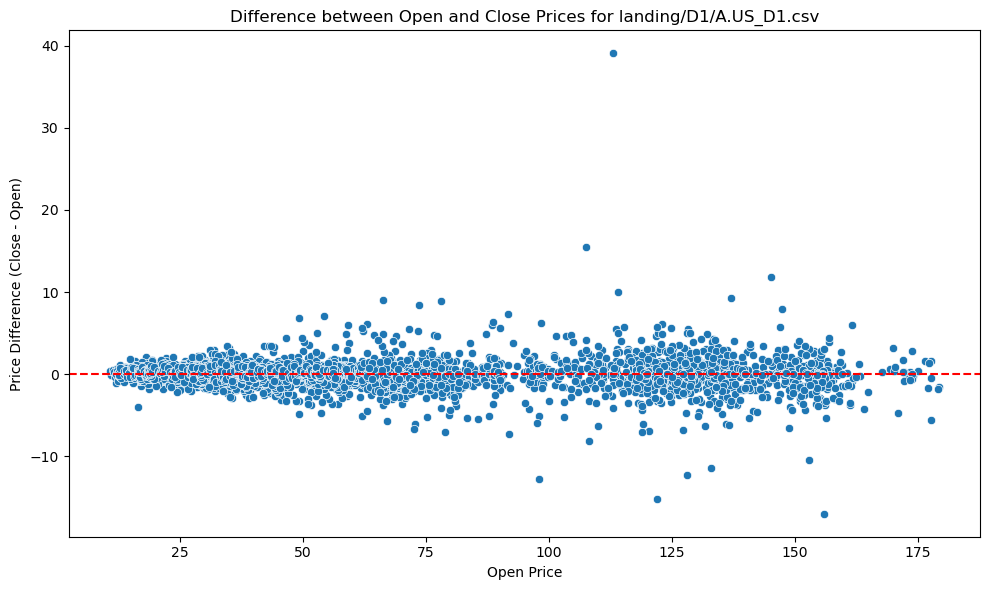

Processing file: landing/D1/AAL.US_D1.csv


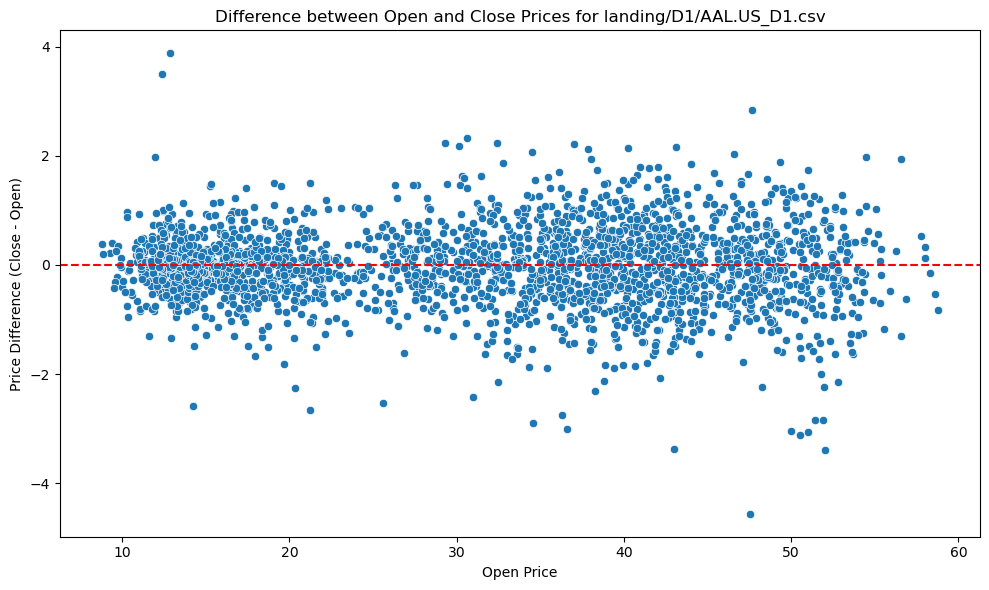

Processing file: landing/D1/AAPL.US_D1.csv


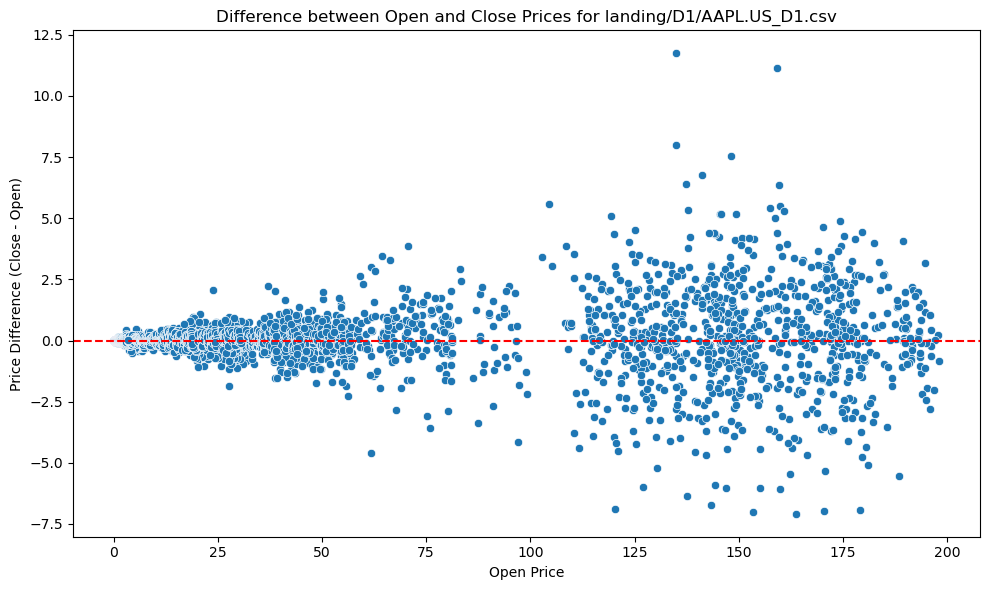

Processing file: landing/D1/ABBV.US_D1.csv


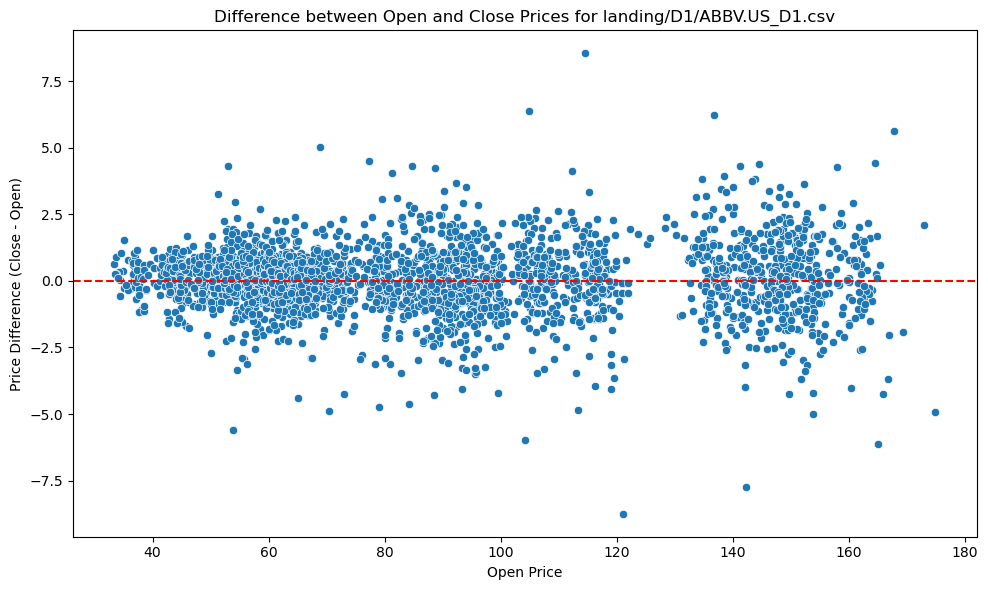

Processing file: landing/D1/ABNB.US_D1.csv


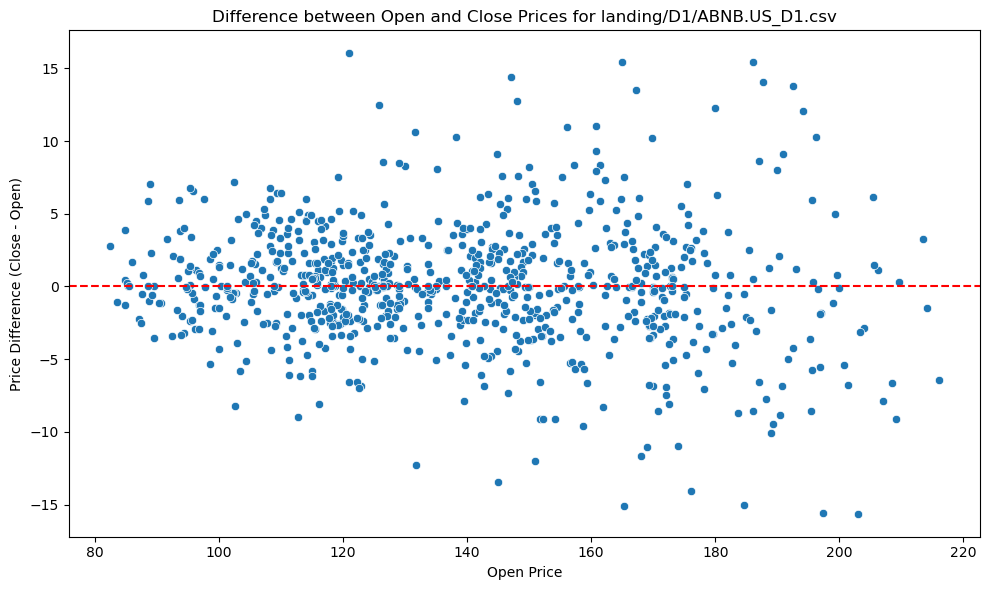

Processing file: landing/D1/ABT.US_D1.csv


KeyboardInterrupt: 

In [4]:
#Import libraries


import matplotlib.pyplot as plt
import seaborn as sns


#Source for the files
source_bucket_name = "my-big-data-as"


#Create a client object that points to GCS
storage_client = storage.Client()


# Get a list of the 'blobs' (objects or files) in the bucket
blobs = storage_client.list_blobs(source_bucket_name, prefix="landing/D1")


#Make a list 
filtered_blobs = [blob for blob in blobs if blob.name.endswith('.csv')]


#Loop through all CSV files using for loop
for blob in filtered_blobs:
    print(f"Processing file: {blob.name}")


    #Read the CSV content into a DataFrame
    csv_data = blob.download_as_text()
    df = pd.read_csv(StringIO(csv_data))


   #For Open and Close Columns, calculate the difference 
    if 'open' in df.columns and 'close' in df.columns:
        #Calculate the difference between open and close prices
        df['pricedifference'] = df['close'] - df['open']


        # Create the relationship plot
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x='open', y='pricedifference', data=df)
        plt.title(f'Difference between Open and Close Prices for {blob.name}')
        plt.xlabel('Open Price')
        plt.ylabel('Price Difference (Close - Open)')
        plt.tight_layout()
        plt.show()
